In [ ]:
# Установка необходимых библиотек
!pip install ccxt pandas requests pytz

# Импорт библиотек
import ccxt
import pandas as pd
import requests
import datetime
import pytz
import time
from google.colab import files

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.0/131.0 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.6/288.6 kB 6.2 MB/s eta 0:00:00
  Attempting uninstall: aiohttp
    Found existing installation: aiohttp 3.11.14
    Uninstalling aiohttp-3.11.14:
      Successfully uninstalled aiohttp-3.11.14


In [ ]:
import pandas as pd

# Читаем CSV (меняем разделитель, если надо)
df = pd.read_csv("dca_alerts3.csv")  # Если данные странно выглядят, попробуйте delimiter=";"
print(df)
# Показываем первые 5 строк
df.head(10)


FileNotFoundError: [Errno 2] No such file or directory: 'dca_alerts3.csv'

Разделяем frequency и period

In [ ]:
import pandas as pd

# Читаем CSV
df = pd.read_csv("dca_alerts3.csv")

# 1. Разделяем колонку 'period' на 'open' и 'close'
if 'period' in df.columns:
    df[['open', 'close']] = df['period'].str.split(' ➞ ', expand=True)
    df = df.drop(columns=['period'])  # Удаляем старую колонку 'period'

# 2. Разделяем колонку 'frequency' на 'frequency_amount' и 'frequency_interval'
if 'frequency' in df.columns:
    # Извлекаем сумму (например, 37.50K) и интервал (например, every 1min)
    df['frequency_amount'] = df['frequency'].str.extract(r'(\d+\.?\d*[MK]?)')  # Без $ в начале, так как он не всегда есть
    df['frequency_interval'] = df['frequency'].str.extract(r'every\s+([\d\w\s]+)')
    # Преобразуем '1min' в '1 min'
    df['frequency_interval'] = df['frequency_interval'].str.replace(r'(\d+)(\w+)', r'\1 \2', regex=True)


# 3. Вычисляем 'eta' как разницу между 'close' и 'open' и форматируем
if 'open' in df.columns and 'close' in df.columns:
    # Преобразуем 'open' и 'close' в datetime
    df['open'] = pd.to_datetime(df['open'], format='%d %b %Y %H:%M:%S UTC')
    df['close'] = pd.to_datetime(df['close'], format='%d %b %Y %H:%M:%S UTC')

print(df.head(10))

     ticker amount_usd     side  potential_price_change     mcap liquidity  \
0      KMNO     87.03K  SELLING                   -8.88   68.94M     3.66M   
1  Fartcoin    100.04K   BUYING                    1.92  418.90M    20.69M   
2  Fartcoin    297.80K  SELLING                   -5.26  416.78M    21.76M   
3    Ghibli     77.10K  SELLING                  -12.77   13.60M     2.18M   
4  Fartcoin    480.34K   BUYING                    7.97  458.52M    23.60M   
5  Fartcoin     87.13K  SELLING                   -1.51  463.19M    22.84M   
6    COLLAT     84.11K  SELLING                  -21.86   15.95M     1.28M   
7  Fartcoin    160.83K   BUYING                    2.68  500.43M    23.85M   
8   MONKEYS    217.26K  SELLING                  -41.86  521.49M     1.40M   
9  Fartcoin    533.54K  SELLING                   -7.80  513.37M    25.74M   

   vol_24h   vol_1h           frequency  eta                   futures  \
0    1.36M   49.91K    1.45K every 1min   1h  mexc bitget gate bina

In [ ]:
df.head(10)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval
0,KMNO,87.03K,SELLING,-8.88,68.94M,3.66M,1.36M,49.91K,1.45K every 1min,1h,mexc bitget gate binance,KMNo3nJsBXfcpJTVhZcXLW7RmTwTt4GVFE7suUBo9sS,NaN,NaN,NaN,NaN,2025-03-29 17:21:39,2025-03-29 18:21:39,1.45K,1 min
1,Fartcoin,100.04K,BUYING,1.92,418.90M,20.69M,8.52M,239.29K,3.33K every 1min,30m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-29 15:14:17,2025-03-29 15:44:17,3.33K,1 min
2,Fartcoin,297.80K,SELLING,-5.26,416.78M,21.76M,9.37M,193.56K,49.63K every 1min,5m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-29 10:36:57,2025-03-29 10:42:57,49.63K,1 min
3,Ghibli,77.10K,SELLING,-12.77,13.60M,2.18M,8.64M,596.54K,642.46 every 1min,2h,mexc gate,4TBi66vi32S7J8X1A6eWfaLHYmUXu7CStcEmsJQdpump,NaN,NaN,NaN,NaN,2025-03-29 01:34:18,2025-03-29 03:34:18,642.46,1 min
4,Fartcoin,480.34K,BUYING,7.97,458.52M,23.60M,11.00M,222.93K,48.03K every 2min,19m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-28 23:26:18,2025-03-28 23:46:18,48.03K,2 min
5,Fartcoin,87.13K,SELLING,-1.51,463.19M,22.84M,10.39M,1.72M,21.78K every 1min,4m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-28 18:22:38,2025-03-28 18:26:38,21.78K,1 min
6,COLLAT,84.11K,SELLING,-21.86,15.95M,1.28M,699.31K,60.78K,16.82K every 1min,5m,NaN,C7heQqfNzdMbUFQwcHkL9FvdwsFsDRBnfwZDDyWYCLTZ,NaN,NaN,NaN,NaN,2025-03-28 15:02:04,2025-03-28 15:07:04,16.82K,1 min
7,Fartcoin,160.83K,BUYING,2.68,500.43M,23.85M,12.44M,320.18K,8.04K every 3min,1h,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-28 11:30:24,2025-03-28 12:30:24,8.04K,3 min
8,MONKEYS,217.26K,SELLING,-41.86,521.49M,1.40M,887.45K,0.00,18.11K every 20min,4h,NaN,7TSCoke2mSZzAtyuRmzANf9virrnyv4xSUeaxUrKkLqw,NaN,NaN,NaN,NaN,2025-03-28 11:02:11,2025-03-28 15:02:11,18.11K,20 min
9,Fartcoin,533.54K,SELLING,-7.80,513.37M,25.74M,12.28M,375.46K,5.34K every 1min,1h,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-28 06:53:56,2025-03-28 08:33:56,5.34K,1 min


In [ ]:
df.tail(100)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval
3153,GRIFT,184.01K,SELLING,-3.70,111.75M,4.20M,15.08M,360.13K,968.45 every 1min,3h,mexc,GekTNfm84QfyP2GdAHZ5AgACBRd69aNmgA5FDhZupump,NaN,NaN,NaN,NaN,2025-01-24 20:28:40,2025-01-24 23:38:40,968.45,1 min
3154,Fartcoin,133.00K,SELLING,-0.99,1.34B,25.53M,63.19M,1.04M,1.75K every 1min,1h,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 20:27:26,2025-01-24 21:43:26,1.75K,1 min
3155,AVA,108.99K,SELLING,-4.15,132.46M,4.85M,18.13M,377.47K,1.24K every 1min,1h,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 20:24:21,2025-01-24 21:52:21,1.24K,1 min
3156,DOGEAI,102.72K,SELLING,-6.85,58.06M,1.95M,26.27M,466.69K,856.03 every 1min,2h,mexc,9UYAYvVS2cZ3BndbsoG1ScJbjfwyEPGxjE79hh5ipump,NaN,NaN,NaN,NaN,2025-01-24 20:01:26,2025-01-24 22:01:26,856.03,1 min
3157,arc,135.56K,SELLING,-1.60,388.94M,8.60M,38.72M,1.59M,6.78K every 1min,20m,mexc bitget gate,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,NaN,NaN,NaN,NaN,2025-01-24 19:42:44,2025-01-24 20:02:44,6.78K,1 min
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3248,Fartcoin,500.05K,BUYING,2.78,1.46B,26.68M,102.42M,1.75M,50.01K every 1min,10m,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 07:14:53,2025-01-24 07:24:53,50.01K,1 min
3249,TRUMP,500.05K,BUYING,4.47,6.98B,670.26M,152.92M,1.14M,100.01K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:14:18,2025-01-24 07:19:18,100.01K,1 min
3250,TRUMP,347.16K,BUYING,3.28,6.98B,670.26M,152.92M,1.14M,69.43K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:13:49,2025-01-24 07:18:49,69.43K,1 min
3251,TRUMP,1.00M,BUYING,9.14,6.84B,665.23M,156.11M,3.02M,200.03K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 06:45:25,2025-01-24 06:50:25,200.03K,1 min


In [ ]:
none_count = df['frequency_amount'].isna().sum()
print(f"\nКоличество строк, где frequency_amount равно None/NaN: {none_count}")


Количество строк, где frequency_amount равно None/NaN: 0


In [ ]:
print(len(df))

3253


In [ ]:
# Подсчитываем количество строк, где frequency_amount равно NaN
none_count_freq = df['frequency_amount'].isna().sum()
print(f"\nКоличество строк, где frequency_amount равно None/NaN: {none_count_freq}")

# Подсчитываем количество строк, где ticker равно NaN
none_count_ticker = df['ticker'].isna().sum()
print(f"Количество строк, где ticker равно None/NaN: {none_count_ticker}")


Количество строк, где frequency_amount равно None/NaN: 0
Количество строк, где ticker равно None/NaN: 319


In [ ]:
nan_tickers = df[pd.isna(df['ticker'])]
print(nan_tickers)


     ticker amount_usd side  potential_price_change     mcap liquidity  \
15      NaN        NaN  NaN                    1.20  551.45M    27.43M   
39      NaN        NaN  NaN                   15.02   26.23M     4.47M   
40      NaN        NaN  NaN                    3.64  548.04M    26.38M   
41      NaN        NaN  NaN                    3.64  554.86M    26.67M   
42      NaN        NaN  NaN                    4.03  557.81M    26.83M   
...     ...        ...  ...                     ...      ...       ...   
3128    NaN        NaN  NaN                  -18.30   29.18M     1.21M   
3143    NaN        NaN  NaN                    3.39   59.25M     3.55M   
3145    NaN        NaN  NaN                    3.54   59.25M     3.55M   
3146    NaN        NaN  NaN                  -19.64   28.38M     1.19M   
3169    NaN        NaN  NaN                    0.80    1.44B    26.77M   

      vol_24h   vol_1h          frequency  eta              futures  \
15     16.70M  287.11K   8.30K every 3mi

In [ ]:
!pip install requests pytz


Получение данных с mexc

In [ ]:
import ccxt
from datetime import datetime

def get_price_data(symbol, start_time_str, end_time_str, market_type='spot', timeframe='1m'):
    """
    Получает полные OHLCV данные о ценах с биржи MEXC с точной фильтрацией по времени.
    """

    def get_available_symbols(exchange):
        markets = exchange.load_markets()
        return list(markets.keys())

    # Инициализация биржи
    exchange = ccxt.mexc({
        'options': {'defaultType': market_type}
    })

    try:
        # Проверка доступности символа
        available_symbols = get_available_symbols(exchange)
        if symbol not in available_symbols:
            print(f"Символ {symbol} недоступен. Доступные символы:")
            for s in available_symbols:
                if symbol.split('/')[0] in s:
                    print(s)
            return None

        # Конвертация времени
        start_time = datetime.strptime(start_time_str, "%Y-%m-%d %H:%M:%S+00:00")
        end_time = datetime.strptime(end_time_str, "%Y-%m-%d %H:%M:%S+00:00")

        if start_time >= end_time:
            print("Начальное время должно быть раньше конечного")
            return None

        since = int(start_time.timestamp() * 1000)
        until = int(end_time.timestamp() * 1000)

        # Получение OHLCV данных
        all_prices = []
        while since < until:
            ohlcv = exchange.fetch_ohlcv(symbol, timeframe=timeframe, since=since, limit=1000)
            if not ohlcv:
                break

            # Фильтрация данных по точному временному диапазону с сохранением всех OHLCV
            filtered_prices = [
                {
                    'timestamp': datetime.utcfromtimestamp(candle[0] / 1000),
                    'open': candle[1],
                    'high': candle[2],
                    'low': candle[3],
                    'close': candle[4],
                    'volume': candle[5]
                }
                for candle in ohlcv
                if start_time <= datetime.utcfromtimestamp(candle[0] / 1000) <= end_time
            ]
            all_prices.extend(filtered_prices)

            if not ohlcv or ohlcv[-1][0] >= until:
                break
            since = ohlcv[-1][0] + 60 * 1000

        if not all_prices:
            print("Не удалось получить данные в заданном диапазоне")
            return None

        # Вычисление минимальной и максимальной цены за период
        high_prices = [candle['high'] for candle in all_prices]
        low_prices = [candle['low'] for candle in all_prices]

        # Формирование результата
        result = {
            'symbol': symbol,
            'start_time': start_time,
            'end_time': end_time,
            'open_price': all_prices[0]['open'] if all_prices else None,
            'close_price': all_prices[-1]['close'] if all_prices else None,
            'high_price': max(high_prices) if high_prices else None,
            'low_price': min(low_prices) if low_prices else None,
            'frequency_interval': timeframe,
            'frequency_amount': len(all_prices),
            'all_prices': all_prices,  # Полные OHLCV данные
            'market_type': market_type
        }

        return result

    except ccxt.BadSymbol:
        print(f"Неверный символ: {symbol}")
        return None
    except ccxt.ExchangeError as e:
        print(f"Ошибка биржи: {e}")
        return None
    except Exception as e:
        print(f"Произошла ошибка: {e}")
        return None

# Пример использования
if __name__ == "__main__":
    symbol = "BTC/USDT"
    start_time_str = "2025-03-06 15:17:00+00:00"
    end_time_str = "2025-03-06 15:22:54+00:00"

    result = get_price_data(symbol, start_time_str, end_time_str, market_type='spot')

    if result:
        print(f"Символ: {result['symbol']}")
        print(f"Период: {result['start_time']} - {result['end_time']}")
        print(f"Цена открытия: {result['open_price']}")
        print(f"Цена закрытия: {result['close_price']}")
        print(f"Максимальная цена: {result['high_price']}")
        print(f"Минимальная цена: {result['low_price']}")
        print(f"Интервал: {result['frequency_interval']}")
        print(f"Количество точек: {result['frequency_amount']}")
        print("Все цены (close):")
        for candle in result['all_prices']:
            print(f"{candle['timestamp']}: {candle['close']}")


Символ: BTC/USDT
Период: 2025-03-06 15:17:00 - 2025-03-06 15:22:54
Цена открытия: 90911.89
Цена закрытия: 91152.12
Максимальная цена: 91365.57
Минимальная цена: 90911.89
Интервал: 1m
Количество точек: 6
Все цены (close):
2025-03-06 15:17:00: 91105.99
2025-03-06 15:18:00: 91186.84
2025-03-06 15:19:00: 91137.04
2025-03-06 15:20:00: 91027.02
2025-03-06 15:21:00: 91098.6
2025-03-06 15:22:00: 91152.12


Получение с bybit

In [ ]:
import requests
import datetime
import pytz

# Базовые URL для Bybit
BASE_URL_SPOT = "https://api.bybit.com"
BASE_URL_FUTURE = "https://api.bybit.com"


def get_bybit_klines(symbol: str, start_time_str: str, end_time_str: str, market_type: str = 'spot',
                     timeframe: str = '1') -> dict:
    """
    Получает исторические OHLCV свечи с Bybit для указанного символа и временного диапазона.

    Args:
        symbol (str): Символ актива (например, 'BTCUSDT').
        start_time_str (str): Начальное время в формате 'YYYY-MM-DD HH:MM:SS+00:00'.
        end_time_str (str): Конечное время в формате 'YYYY-MM-DD HH:MM:SS+00:00'.
        market_type (str, optional): Тип рынка ('spot' или 'future'). По умолчанию 'spot'.
        timeframe (str, optional): Интервал свечей в минутах ('1' по умолчанию).

    Returns:
        dict: Словарь с данными о ценах, включая OHLCV.
    """
    # Проверяем тип рынка
    if market_type not in ['spot', 'future']:
        market_type = 'spot'

    # Парсим время
    try:
        start_time = datetime.datetime.strptime(start_time_str, "%Y-%m-%d %H:%M:%S+00:00").replace(tzinfo=pytz.UTC)
        end_time = datetime.datetime.strptime(end_time_str, "%Y-%m-%d %H:%M:%S+00:00").replace(tzinfo=pytz.UTC)

        if start_time >= end_time:
            print("Начальное время должно быть раньше конечного")
            return None

        start_timestamp = int(start_time.timestamp() * 1000)
        end_timestamp = int(end_time.timestamp() * 1000)
    except ValueError:
        print(f"❌ Ошибка: Неверный формат времени для {start_time_str} или {end_time_str}")
        return None

    # Формируем запрос
    if market_type == 'spot':
        url = f"{BASE_URL_SPOT}/v5/market/kline"
        params = {
            "category": "spot",
            "symbol": symbol.upper(),
            "interval": timeframe,
            "start": start_timestamp,
            "end": end_timestamp,
            "limit": 1000
        }
    else:
        url = f"{BASE_URL_FUTURE}/v5/market/kline"
        params = {
            "category": "linear",
            "symbol": symbol.upper(),
            "interval": timeframe,
            "start": start_timestamp,
            "end": end_timestamp,
            "limit": 1000
        }

    # Выполняем запрос
    try:
        response = requests.get(url, params=params, timeout=30)
        response.raise_for_status()
        data = response.json()
    except requests.RequestException as e:
        print(f"❌ Ошибка при запросе данных для {symbol}: {e}")
        return None

    # Проверяем наличие данных
    if not data or data.get('retCode') != 0 or not data.get('result', {}).get('list'):
        print(f"❌ Данные для {symbol} не найдены: {data.get('retMsg', 'Нет данных')}")
        return None

    # Парсим свечи с сохранением всех OHLCV данных
    all_prices = []
    for entry in data['result']['list']:
        timestamp = int(entry[0]) / 1000  # Время в миллисекундах
        dt = datetime.datetime.fromtimestamp(timestamp, tz=pytz.UTC)
        if start_time <= dt <= end_time:  # Фильтруем только свечи в заданном диапазоне
            candle = {
                'timestamp': dt,
                'open': float(entry[1]),  # Цена открытия
                'high': float(entry[2]),  # Максимальная цена
                'low': float(entry[3]),  # Минимальная цена
                'close': float(entry[4]),  # Цена закрытия
                'volume': float(entry[5])  # Объем
            }
            all_prices.append(candle)

    if not all_prices:
        print(f"❌ Нет данных для {symbol} в указанном диапазоне.")
        return None

    # Сортируем данные по времени в порядке возрастания
    all_prices.sort(key=lambda x: x['timestamp'])

    # Вычисление минимальной и максимальной цены за период
    high_prices = [candle['high'] for candle in all_prices]
    low_prices = [candle['low'] for candle in all_prices]

    # Формирование результата
    result = {
        'symbol': symbol,
        'start_time': start_time,
        'end_time': end_time,
        'open_price': all_prices[0]['open'] if all_prices else None,
        'close_price': all_prices[-1]['close'] if all_prices else None,
        'high_price': max(high_prices) if high_prices else None,
        'low_price': min(low_prices) if low_prices else None,
        'frequency_interval': f"{timeframe}m",
        'frequency_amount': len(all_prices),
        'all_prices': all_prices,  # Полные OHLCV данные
        'market_type': market_type
    }

    print(f"✅ Получены цены для {symbol} с {start_time_str} по {end_time_str} ({market_type})")
    return result


# Пример использования
if __name__ == "__main__":
    # Тестовые данные
    symbol = "BTCUSDT"
    start_time_str = "2025-03-06 16:40:00+00:00"
    end_time_str = "2025-03-06 16:50:54+00:00"
    market_type = "future"

    result = get_bybit_klines(symbol, start_time_str, end_time_str, market_type)

    if result:
        print(f"Символ: {result['symbol']}")
        print(f"Период: {result['start_time']} - {result['end_time']}")
        print(f"Цена открытия: {result['open_price']}")
        print(f"Цена закрытия: {result['close_price']}")
        print(f"Максимальная цена: {result['high_price']}")
        print(f"Минимальная цена: {result['low_price']}")
        print(f"Интервал: {result['frequency_interval']}")
        print(f"Количество точек: {result['frequency_amount']}")
        print("Все цены (close):")
        for candle in result['all_prices']:
            print(f"🕒 {candle['timestamp'].strftime('%Y-%m-%d %H:%M:%S')} - 💵 {candle['close']} USDT")

❌ Ошибка при запросе данных для BTCUSDT: 403 Client Error: Forbidden for url: https://api.bybit.com/v5/market/kline?category=linear&symbol=BTCUSDT&interval=1&start=1741279200000&end=1741279854000&limit=1000


Первеод Created и Finished в open и close
---



In [ ]:
df['created'] = pd.to_datetime(df['created'])
df['finish'] = pd.to_datetime(df['finish'])

# Заполнение колонок open и close, если они NaT
df['open'] = df.apply(lambda row: row['created'] if pd.isna(row['open']) else row['open'], axis=1)
df['close'] = df.apply(lambda row: row['finish'] if pd.isna(row['close']) else row['close'], axis=1)



In [ ]:
df.head(100)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval
0,KMNO,87.03K,SELLING,-8.88,68.94M,3.66M,1.36M,49.91K,1.45K every 1min,1h,mexc bitget gate binance,KMNo3nJsBXfcpJTVhZcXLW7RmTwTt4GVFE7suUBo9sS,NaN,NaN,NaT,NaT,2025-03-29 17:21:39,2025-03-29 18:21:39,1.45K,1 min
1,Fartcoin,100.04K,BUYING,1.92,418.90M,20.69M,8.52M,239.29K,3.33K every 1min,30m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-03-29 15:14:17,2025-03-29 15:44:17,3.33K,1 min
2,Fartcoin,297.80K,SELLING,-5.26,416.78M,21.76M,9.37M,193.56K,49.63K every 1min,5m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-03-29 10:36:57,2025-03-29 10:42:57,49.63K,1 min
3,Ghibli,77.10K,SELLING,-12.77,13.60M,2.18M,8.64M,596.54K,642.46 every 1min,2h,mexc gate,4TBi66vi32S7J8X1A6eWfaLHYmUXu7CStcEmsJQdpump,NaN,NaN,NaT,NaT,2025-03-29 01:34:18,2025-03-29 03:34:18,642.46,1 min
4,Fartcoin,480.34K,BUYING,7.97,458.52M,23.60M,11.00M,222.93K,48.03K every 2min,19m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-03-28 23:26:18,2025-03-28 23:46:18,48.03K,2 min
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,TRUMP,99.99K,BUYING,0.10,2.36B,414.43M,134.84M,3.57M,1.67K every 2min,1h,mexc bitget gate binance,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaT,NaT,2025-03-24 03:11:46,2025-03-24 05:11:45,1.67K,2 min
96,Fartcoin,125.10K,SELLING,-1.98,523.83M,24.84M,14.08M,1.39M,41.70K every 1min,3m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-03-24 01:42:08,2025-03-24 01:45:08,41.70K,1 min
97,Fartcoin,187.68K,SELLING,-2.96,523.93M,24.81M,14.03M,1.37M,62.56K every 1min,3m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-03-24 01:40:05,2025-03-24 01:43:05,62.56K,1 min
98,Fartcoin,170.77K,BUYING,2.72,533.20M,24.96M,12.16M,550.47K,85.39K every 5min,9m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-03-23 23:17:42,2025-03-23 23:27:42,85.39K,5 min


In [ ]:
df.tail(100)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval
3153,GRIFT,184.01K,SELLING,-3.70,111.75M,4.20M,15.08M,360.13K,968.45 every 1min,3h,mexc,GekTNfm84QfyP2GdAHZ5AgACBRd69aNmgA5FDhZupump,NaN,NaN,NaT,NaT,2025-01-24 20:28:40,2025-01-24 23:38:40,968.45,1 min
3154,Fartcoin,133.00K,SELLING,-0.99,1.34B,25.53M,63.19M,1.04M,1.75K every 1min,1h,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-01-24 20:27:26,2025-01-24 21:43:26,1.75K,1 min
3155,AVA,108.99K,SELLING,-4.15,132.46M,4.85M,18.13M,377.47K,1.24K every 1min,1h,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaT,NaT,2025-01-24 20:24:21,2025-01-24 21:52:21,1.24K,1 min
3156,DOGEAI,102.72K,SELLING,-6.85,58.06M,1.95M,26.27M,466.69K,856.03 every 1min,2h,mexc,9UYAYvVS2cZ3BndbsoG1ScJbjfwyEPGxjE79hh5ipump,NaN,NaN,NaT,NaT,2025-01-24 20:01:26,2025-01-24 22:01:26,856.03,1 min
3157,arc,135.56K,SELLING,-1.60,388.94M,8.60M,38.72M,1.59M,6.78K every 1min,20m,mexc bitget gate,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,NaN,NaN,NaT,NaT,2025-01-24 19:42:44,2025-01-24 20:02:44,6.78K,1 min
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3248,Fartcoin,500.05K,BUYING,2.78,1.46B,26.68M,102.42M,1.75M,50.01K every 1min,10m,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaT,NaT,2025-01-24 07:14:53,2025-01-24 07:24:53,50.01K,1 min
3249,TRUMP,500.05K,BUYING,4.47,6.98B,670.26M,152.92M,1.14M,100.01K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaT,NaT,2025-01-24 07:14:18,2025-01-24 07:19:18,100.01K,1 min
3250,TRUMP,347.16K,BUYING,3.28,6.98B,670.26M,152.92M,1.14M,69.43K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaT,NaT,2025-01-24 07:13:49,2025-01-24 07:18:49,69.43K,1 min
3251,TRUMP,1.00M,BUYING,9.14,6.84B,665.23M,156.11M,3.02M,200.03K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaT,NaT,2025-01-24 06:45:25,2025-01-24 06:50:25,200.03K,1 min


In [ ]:
df['created'] = pd.to_datetime(df['created'], utc=True)
df['finish'] = pd.to_datetime(df['finish'], utc=True)
df['open'] = pd.to_datetime(df['open'], utc=True)
df['close'] = pd.to_datetime(df['close'], utc=True)

# Выводим первые строки для проверки
print(df[['ticker', 'open', 'close']].head())

     ticker                      open                     close
0      KMNO 2025-03-29 17:21:39+00:00 2025-03-29 18:21:39+00:00
1  Fartcoin 2025-03-29 15:14:17+00:00 2025-03-29 15:44:17+00:00
2  Fartcoin 2025-03-29 10:36:57+00:00 2025-03-29 10:42:57+00:00
3    Ghibli 2025-03-29 01:34:18+00:00 2025-03-29 03:34:18+00:00
4  Fartcoin 2025-03-28 23:26:18+00:00 2025-03-28 23:46:18+00:00


In [ ]:
new_df = df.copy()

# Сохранение обновленного CSV
new_df.to_csv('updated_data.csv', index=False)

Общие преобразования в df

In [ ]:
import pandas as pd
import ccxt
import datetime

# Функция для получения данных с MEXC
def get_price_data(symbol, start_time_str, end_time_str, market_type='spot', timeframe='1'):
    def get_available_symbols(exchange):
        markets = exchange.load_markets()
        return list(markets.keys())

    exchange = ccxt.mexc({'options': {'defaultType': market_type}})
    try:
        available_symbols = get_available_symbols(exchange)
        if symbol not in available_symbols:
            print(f"Символ {symbol} недоступен на MEXC.")
            return None

        # Парсинг времени с учетом UTC offset (+00:00)
        start_time = datetime.datetime.strptime(start_time_str, "%Y-%m-%d %H:%M:%S+00:00")
        end_time = datetime.datetime.strptime(end_time_str, "%Y-%m-%d %H:%M:%S+00:00")

        if start_time >= end_time:
            print(f"Начальное время должно быть раньше конечного для {symbol}")
            return None

        since = int(start_time.timestamp() * 1000)
        until = int(end_time.timestamp() * 1000)

        all_prices = []
        while since < until:
            ohlcv = exchange.fetch_ohlcv(symbol, timeframe=timeframe, since=since, limit=1000)
            if not ohlcv:
                break
            filtered_prices = [
                {
                    'timestamp': datetime.datetime.utcfromtimestamp(candle[0] / 1000),
                    'open': candle[1],
                    'high': candle[2],
                    'low': candle[3],
                    'close': candle[4],
                    'volume': candle[5]
                }
                for candle in ohlcv
                if start_time <= datetime.datetime.utcfromtimestamp(candle[0] / 1000) <= end_time
            ]
            all_prices.extend(filtered_prices)
            if not ohlcv or ohlcv[-1][0] >= until:
                break
            since = ohlcv[-1][0] + 60 * 1000

        if not all_prices:
            print(f"Не удалось получить данные для {symbol} в заданном диапазоне")
            return None

        all_prices.sort(key=lambda x: x['timestamp'])  # Сортировка по времени
        high_prices = [candle['high'] for candle in all_prices]
        low_prices = [candle['low'] for candle in all_prices]

        result = {
            'symbol': symbol,
            'start_time': start_time,
            'end_time': end_time,
            'open_price': all_prices[0]['open'] if all_prices else None,
            'close_price': all_prices[-1]['close'] if all_prices else None,
            'high_price': max(high_prices) if high_prices else None,
            'low_price': min(low_prices) if low_prices else None,
            'frequency_interval': timeframe,
            'frequency_amount': len(all_prices),
            'all_prices': all_prices,
            'market_type': market_type
        }
        return result

    except Exception as e:
        print(f"Ошибка для {symbol}: {e}")
        return None


# Функция для обработки DataFrame и получения данных с MEXC
def process_df_with_mexc(df):
    # Добавляем новые столбцы
    df['open_price'] = None
    df['close_price'] = None
    df['period_ohlc'] = None

    for index, row in df.iterrows():
        # Проверяем, что ticker не NaN и приводим к верхнему регистру
        ticker = str(row['ticker']).upper() if pd.notna(row['ticker']) else None
        if not ticker:
            print(f"Пропускаю строку {index}: тикер отсутствует или NaN")
            continue

        # Преобразуем Timestamp в строку, если это необходимо
        start_time_str = row['open'] if isinstance(row['open'], str) else row['open'].strftime("%Y-%m-%d %H:%M:%S+00:00")
        end_time_str = row['close'] if isinstance(row['close'], str) else row['close'].strftime("%Y-%m-%d %H:%M:%S+00:00")
        market_type = 'spot'  # Можно добавить логику для выбора 'future'
        timeframe = '1'  # Фиксируем интервал в 1 минуту

        print(f"Обрабатываю {ticker} за период {start_time_str} - {end_time_str} с timeframe={timeframe}")

        # Получаем данные с MEXC
        result = get_price_data(f"{ticker.upper()}/USDT", start_time_str, end_time_str, market_type, '1m')

        if result:
            # Сохраняем данные в DataFrame
            df.at[index, 'open_price'] = result['open_price']
            df.at[index, 'close_price'] = result['close_price']
            df.at[index, 'period_ohlc'] = result['all_prices']

            print(f"Успешно получены данные для {ticker}:")
            print(f"Open: {result['open_price']}, Close: {result['close_price']}")
            print(f"Количество свечей: {len(result['all_prices'])}")
        else:
            print(f"Не удалось получить данные для {ticker}")

    return df

# Выполняем обработку
updated_df = process_df_with_mexc(df)

# Выводим результат
print("\nОбновленный DataFrame:")
print(updated_df[['ticker', 'open', 'close', 'open_price', 'close_price', 'period_ohlc']].head())

# Пример доступа к OHLC данным для первой строки
if updated_df['period_ohlc'].iloc[0] is not None:
    print("\nПример OHLC данных для первого тикера:")
    for candle in updated_df['period_ohlc'].iloc[0][:5]:  # Первые 5 свечей
        print(f"{candle['timestamp']}: O={candle['open']}, H={candle['high']}, L={candle['low']}, C={candle['close']}, V={candle['volume']}")
else:
    print("\nНет OHLC данных для первого тикера (возможно, символ недоступен).")

Обрабатываю KMNO за период 2025-03-29 17:21:39+00:00 - 2025-03-29 18:21:39+00:00 с timeframe=1
Успешно получены данные для KMNO:
Open: 0.0516, Close: 0.05134
Количество свечей: 60
Обрабатываю FARTCOIN за период 2025-03-29 15:14:17+00:00 - 2025-03-29 15:44:17+00:00 с timeframe=1
Успешно получены данные для FARTCOIN:
Open: 0.42044, Close: 0.4154
Количество свечей: 30
Обрабатываю FARTCOIN за период 2025-03-29 10:36:57+00:00 - 2025-03-29 10:42:57+00:00 с timeframe=1
Успешно получены данные для FARTCOIN:
Open: 0.41616, Close: 0.41538
Количество свечей: 6
Обрабатываю GHIBLI за период 2025-03-29 01:34:18+00:00 - 2025-03-29 03:34:18+00:00 с timeframe=1
Успешно получены данные для GHIBLI:
Open: 0.01408, Close: 0.01259
Количество свечей: 120
Обрабатываю FARTCOIN за период 2025-03-28 23:26:18+00:00 - 2025-03-28 23:46:18+00:00 с timeframe=1
Успешно получены данные для FARTCOIN:
Open: 0.46072, Close: 0.46932
Количество свечей: 20
Обрабатываю FARTCOIN за период 2025-03-28 18:22:38+00:00 - 2025-03-28

KeyboardInterrupt: 

Анализ df с ценами


In [ ]:
import pandas as pd

# Читаем CSV (меняем разделитель, если надо)
df = pd.read_csv("updated_data_with_bybit.csv")  # Если данные странно выглядят, попробуйте delimiter=";"
print(df)
# Показываем первые 5 строк
df.head(100)

        ticker amount_usd     side  potential_price_change     mcap liquidity  \
0         KMNO     87.03K  SELLING                   -8.88   68.94M     3.66M   
1     Fartcoin    100.04K   BUYING                    1.92  418.90M    20.69M   
2     Fartcoin    297.80K  SELLING                   -5.26  416.78M    21.76M   
3       Ghibli     77.10K  SELLING                  -12.77   13.60M     2.18M   
4     Fartcoin    480.34K   BUYING                    7.97  458.52M    23.60M   
...        ...        ...      ...                     ...      ...       ...   
3248  Fartcoin    500.05K   BUYING                    2.78    1.46B    26.68M   
3249     TRUMP    500.05K   BUYING                    4.47    6.98B   670.26M   
3250     TRUMP    347.16K   BUYING                    3.28    6.98B   670.26M   
3251     TRUMP      1.00M   BUYING                    9.14    6.84B   665.23M   
3252       TMC    130.12K   BUYING                    1.65   16.30M   991.93K   

      vol_24h   vol_1h     

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,...,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv
0,KMNO,87.03K,SELLING,-8.88,68.94M,3.66M,1.36M,49.91K,1.45K every 1min,1h,...,NaN,NaN,NaN,2025-03-29 17:21:39+00:00,2025-03-29 18:21:39+00:00,1.45K,1 min,0.05122,0.05124,"[{'timestamp': datetime.datetime(2025, 3, 29, ..."
1,Fartcoin,100.04K,BUYING,1.92,418.90M,20.69M,8.52M,239.29K,3.33K every 1min,30m,...,NaN,NaN,NaN,2025-03-29 15:14:17+00:00,2025-03-29 15:44:17+00:00,3.33K,1 min,0.42080,0.41580,"[{'timestamp': datetime.datetime(2025, 3, 29, ..."
2,Fartcoin,297.80K,SELLING,-5.26,416.78M,21.76M,9.37M,193.56K,49.63K every 1min,5m,...,NaN,NaN,NaN,2025-03-29 10:36:57+00:00,2025-03-29 10:42:57+00:00,49.63K,1 min,0.41650,0.41620,"[{'timestamp': datetime.datetime(2025, 3, 29, ..."
3,Ghibli,77.10K,SELLING,-12.77,13.60M,2.18M,8.64M,596.54K,642.46 every 1min,2h,...,NaN,NaN,NaN,2025-03-29 01:34:18+00:00,2025-03-29 03:34:18+00:00,642.46,1 min,NaN,NaN,NaN
4,Fartcoin,480.34K,BUYING,7.97,458.52M,23.60M,11.00M,222.93K,48.03K every 2min,19m,...,NaN,NaN,NaN,2025-03-28 23:26:18+00:00,2025-03-28 23:46:18+00:00,48.03K,2 min,0.46060,0.46900,"[{'timestamp': datetime.datetime(2025, 3, 28, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,TRUMP,99.99K,BUYING,0.10,2.36B,414.43M,134.84M,3.57M,1.67K every 2min,1h,...,NaN,NaN,NaN,2025-03-24 03:11:46+00:00,2025-03-24 05:11:45+00:00,1.67K,2 min,11.77200,11.83000,"[{'timestamp': datetime.datetime(2025, 3, 24, ..."
96,Fartcoin,125.10K,SELLING,-1.98,523.83M,24.84M,14.08M,1.39M,41.70K every 1min,3m,...,NaN,NaN,NaN,2025-03-24 01:42:08+00:00,2025-03-24 01:45:08+00:00,41.70K,1 min,0.53170,0.52710,"[{'timestamp': datetime.datetime(2025, 3, 24, ..."
97,Fartcoin,187.68K,SELLING,-2.96,523.93M,24.81M,14.03M,1.37M,62.56K every 1min,3m,...,NaN,NaN,NaN,2025-03-24 01:40:05+00:00,2025-03-24 01:43:05+00:00,62.56K,1 min,0.52500,0.52830,"[{'timestamp': datetime.datetime(2025, 3, 24, ..."
98,Fartcoin,170.77K,BUYING,2.72,533.20M,24.96M,12.16M,550.47K,85.39K every 5min,9m,...,NaN,NaN,NaN,2025-03-23 23:17:42+00:00,2025-03-23 23:27:42+00:00,85.39K,5 min,0.53430,0.53130,"[{'timestamp': datetime.datetime(2025, 3, 23, ..."


In [ ]:
# Подсчет строк с NaN в open_price и close_price
nan_open_price = df['open_price'].isna().sum()
nan_close_price = df['close_price'].isna().sum()

print(f"Количество строк с NaN в 'open_price': {nan_open_price}")
print(f"Количество строк с NaN в 'close_price': {nan_close_price}")


Количество строк с NaN в 'open_price': 1326
Количество строк с NaN в 'close_price': 1326


In [ ]:
unique_tickers = df['ticker'].unique()

# Вывод всех уникальных тикеров
print("Уникальные тикеры:")
for ticker in unique_tickers:
    print(ticker)

Уникальные тикеры:
KMNO
Fartcoin
Ghibli
COLLAT
MONKEYS
FWOG
TRUMP
nan
FAT
MOODENG
AVA
POPCAT
jellyjelly
JitoSOL
JLP
arc
GRASS
GIGA
Bonk
Routine
meow
Oracler
TRX
ORCA
HNT
GOLD
ANALOS
JTO
WBTC
SNAI
pwease
SSE
GFM
WOULD
FRED
MUMU
Anon
SPX
ALCH
RAY
MOBY
CHEX
RETARDIO
pippin
GrokCoin
JUP
GRIFT
cbBTC
WETH
MLG
GRIFFAIN
MOTHER
LUCE
jailstool
GME
MEW
PYTHIA
ZEREBRO
VIRTUAL
DOGEAI
LMT
michi
MPLX
USA
swarms
JupSOL
AIXBT
mSOL
WIF
FLOYDAI
DBR
ACT
TAI
MANEKI
UFD
GOAT
Greed
VINE
LIBRA
PONKE
SHDW
TRACY
GUAC
PENGU
pep
Duo
LAYER
CLOUD
Fullsend
PKIN
AskJ
RENDER
FARTBOY
listen
FDUSD
CAR
BUTTCOIN
BIGBALLS
USDS
vvaifu
TSOTCHKE
Calicoin
Pnut
LLM
BUZZ
ENRON
MUSKIT
MELANIA
TNSR
FAFO
San
RIF
DRIFT
GYAT
W
TANK
LUX
MemesAI
SIGMA
GANG
HOOD
RIFT
RYAN
MATES
KAYYO
AGiXT
HAT
FRIC
Stupid
cloudy
SPICE
ZEUS
YNE
GRPH
OIIAOIIA
MAJOR
REGENT
Seek
LUMO
ELIZA
STNK
ALON
JAIL
nuit
CHILLGUY
FSTR
ARGO
TETSUO
GIKO
SAFEMOON
BULLY
Murad
KIT
Sorkincoin
TMC


Удаление тикеров с nan

In [ ]:
# 📋 Собираем тикеры с NaN в open_price или close_price
tickers_with_nan = df[(df['open_price'].isna()) | (df['close_price'].isna())]['ticker'].unique().tolist()

# 🖨️ Проверяем массив тикеров
print("Тикеры с NaN в open_price или close_price:", tickers_with_nan)

# 🗑️ Удаляем строки с NaN в open_price и close_price
df = df.dropna(subset=['open_price', 'close_price'])

Тикеры с NaN в open_price или close_price: ['Ghibli', 'COLLAT', 'MONKEYS', nan, 'FAT', 'JitoSOL', 'JLP', 'Routine', 'meow', 'Oracler', 'GOLD', 'ANALOS', 'WBTC', 'SNAI', 'pwease', 'SSE', 'GFM', 'WOULD', 'FRED', 'Anon', 'RAY', 'MOBY', 'CHEX', 'RETARDIO', 'GrokCoin', 'GRIFT', 'cbBTC', 'WETH', 'MLG', 'MOTHER', 'GME', 'PYTHIA', 'DOGEAI', 'LMT', 'MPLX', 'USA', 'JupSOL', 'mSOL', 'FLOYDAI', 'UFD', 'Greed', 'LIBRA', 'SHDW', 'TRACY', 'GUAC', 'pep', 'Duo', 'LAYER', 'Fullsend', 'PKIN', 'AskJ', 'jailstool', 'FARTBOY', 'listen', 'FDUSD', 'CAR', 'BUTTCOIN', 'BIGBALLS', 'USDS', 'vvaifu', 'TSOTCHKE', 'Calicoin', 'LLM', 'ENRON', 'MUSKIT', 'FAFO', 'San', 'GYAT', 'TANK', 'LUX', 'MemesAI', 'SIGMA', 'GANG', 'HOOD', 'RIFT', 'RYAN', 'MATES', 'jellyjelly', 'KAYYO', 'AGiXT', 'HAT', 'FRIC', 'Stupid', 'cloudy', 'SPICE', 'YNE', 'GRPH', 'OIIAOIIA', 'REGENT', 'Seek', 'LUMO', 'ELIZA', 'STNK', 'ALON', 'JAIL', 'nuit', 'michi', 'FSTR', 'ARGO', 'TETSUO', 'GIKO', 'SAFEMOON', 'BULLY', 'Murad', 'KIT', 'Sorkincoin', 'TMC']


In [ ]:
# 🔍 Ищем тикеры из tickers_with_nan, которые есть в исходном df
tickers_still_in_df = [ticker for ticker in tickers_with_nan if ticker in df['ticker'].values]

# 🖨️ Выводим результат
print("Тикеры из tickers_with_nan, которые есть в исходном df:", tickers_still_in_df)


Тикеры из tickers_with_nan, которые есть в исходном df: ['jailstool', 'jellyjelly', 'michi']


Процентная разница и получение win or loss

In [ ]:
# 📊 Добавляем колонку с разницей в процентах
df['percent_change'] = ((df['close_price'] - df['open_price']) / df['open_price']) * 100

# 🏆 Добавляем колонку с результатом в зависимости от направления DCA
def get_result(row):
    if row['side'] == 'BUYING':
        return 'win' if row['percent_change'] > 0 else 'loss'
    elif row['side'] == 'SELLING':
        return 'win' if row['percent_change'] < 0 else 'loss'
    else:
        return 'unknown'  # На всякий случай, если вдруг что-то еще попадется

df['result'] = df.apply(get_result, axis=1)

# 🖨️ Выводим первые 5 строк для проверки
print(df[['ticker', 'side', 'open_price', 'close_price', 'percent_change', 'result']].head())


     ticker     side  open_price  close_price  percent_change result
0      KMNO  SELLING     0.05122      0.05124        0.039047   loss
1  Fartcoin   BUYING     0.42080      0.41580       -1.188213   loss
2  Fartcoin  SELLING     0.41650      0.41620       -0.072029    win
4  Fartcoin   BUYING     0.46060      0.46900        1.823708    win
5  Fartcoin  SELLING     0.46190      0.46050       -0.303096    win


In [ ]:
df.head(100)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,...,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result
0,KMNO,87.03K,SELLING,-8.88,68.94M,3.66M,1.36M,49.91K,1.45K every 1min,1h,...,NaN,2025-03-29 17:21:39+00:00,2025-03-29 18:21:39+00:00,1.45K,1 min,0.05122,0.05124,"[{'timestamp': datetime.datetime(2025, 3, 29, ...",0.039047,loss
1,Fartcoin,100.04K,BUYING,1.92,418.90M,20.69M,8.52M,239.29K,3.33K every 1min,30m,...,NaN,2025-03-29 15:14:17+00:00,2025-03-29 15:44:17+00:00,3.33K,1 min,0.42080,0.41580,"[{'timestamp': datetime.datetime(2025, 3, 29, ...",-1.188213,loss
2,Fartcoin,297.80K,SELLING,-5.26,416.78M,21.76M,9.37M,193.56K,49.63K every 1min,5m,...,NaN,2025-03-29 10:36:57+00:00,2025-03-29 10:42:57+00:00,49.63K,1 min,0.41650,0.41620,"[{'timestamp': datetime.datetime(2025, 3, 29, ...",-0.072029,win
4,Fartcoin,480.34K,BUYING,7.97,458.52M,23.60M,11.00M,222.93K,48.03K every 2min,19m,...,NaN,2025-03-28 23:26:18+00:00,2025-03-28 23:46:18+00:00,48.03K,2 min,0.46060,0.46900,"[{'timestamp': datetime.datetime(2025, 3, 28, ...",1.823708,win
5,Fartcoin,87.13K,SELLING,-1.51,463.19M,22.84M,10.39M,1.72M,21.78K every 1min,4m,...,NaN,2025-03-28 18:22:38+00:00,2025-03-28 18:26:38+00:00,21.78K,1 min,0.46190,0.46050,"[{'timestamp': datetime.datetime(2025, 3, 28, ...",-0.303096,win
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,Fartcoin,240.04K,BUYING,4.26,449.97M,22.31M,12.10M,334.47K,80.01K every 1min,3m,...,NaN,2025-03-22 23:16:47+00:00,2025-03-22 23:19:47+00:00,80.01K,1 min,0.45140,0.45290,"[{'timestamp': datetime.datetime(2025, 3, 22, ...",0.332300,win
117,Fartcoin,226.35K,SELLING,-3.92,452.72M,22.41M,12.20M,297.56K,113.17K every 1min,2m,...,NaN,2025-03-22 23:12:25+00:00,2025-03-22 23:14:25+00:00,113.17K,1 min,0.45370,0.44870,"[{'timestamp': datetime.datetime(2025, 3, 22, ...",-1.102050,win
119,Fartcoin,71.54K,SELLING,-1.24,468.28M,22.91M,16.39M,427.84K,35.77K every 1min,2m,...,NaN,2025-03-22 19:17:24+00:00,2025-03-22 19:19:24+00:00,35.77K,1 min,0.46810,0.46820,"[{'timestamp': datetime.datetime(2025, 3, 22, ...",0.021363,loss
120,Fartcoin,72.33K,SELLING,-1.24,473.45M,23.06M,16.36M,423.52K,36.17K every 1min,2m,...,NaN,2025-03-22 19:09:03+00:00,2025-03-22 19:11:03+00:00,36.17K,1 min,0.47380,0.47250,"[{'timestamp': datetime.datetime(2025, 3, 22, ...",-0.274377,win


In [ ]:
print(len(df))

1927


Смотрим винрейт

In [ ]:
# Преобразуем столбец 'result' в 1 и 0
df['win'] = df['result'].apply(lambda x: 1 if x == 'win' else 0)

# Подсчитаем винрейт
win_rate = df['win'].mean() * 100

print(f"Win Rate: {win_rate:.2f}%")

Win Rate: 60.87%


In [ ]:
pd.set_option('display.max_columns', None)  # Показывать все столбцы
pd.set_option('display.max_rows', None)     # Показывать все строки (опционально)
pd.set_option('display.width', None)

In [ ]:
print(df.head(10))

      ticker amount_usd     side  potential_price_change     mcap liquidity vol_24h   vol_1h  \
0       KMNO     87.03K  SELLING                   -8.88   68.94M     3.66M   1.36M   49.91K   
1   Fartcoin    100.04K   BUYING                    1.92  418.90M    20.69M   8.52M  239.29K   
2   Fartcoin    297.80K  SELLING                   -5.26  416.78M    21.76M   9.37M  193.56K   
4   Fartcoin    480.34K   BUYING                    7.97  458.52M    23.60M  11.00M  222.93K   
5   Fartcoin     87.13K  SELLING                   -1.51  463.19M    22.84M  10.39M    1.72M   
7   Fartcoin    160.83K   BUYING                    2.68  500.43M    23.85M  12.44M  320.18K   
9   Fartcoin    533.54K  SELLING                   -7.80  513.37M    25.74M  12.28M  375.46K   
10  Fartcoin    273.00K  SELLING                   -4.10  515.62M    25.79M  12.31M  399.10K   
11      FWOG    116.70K  SELLING                   -9.84   50.48M     4.39M   1.47M   15.66K   
12     TRUMP      8.22M  SELLING        

Анализ корреляций

In [ ]:
import pandas as pd

# Функция для преобразования значений с K, M, B в числовой формат
def convert_to_float(value):
    if isinstance(value, str):
        value = value.replace(',', '')  # Убираем запятые
        if 'K' in value:
            return float(value.replace('K', '')) * 1e3
        elif 'M' in value:
            return float(value.replace('M', '')) * 1e6
        elif 'B' in value:
            return float(value.replace('B', '')) * 1e9
        else:
            return float(value)
    return value

# Преобразуем столбцы в числовой формат
df['amount_usd'] = df['amount_usd'].apply(convert_to_float)
df['vol_24h'] = df['vol_24h'].apply(convert_to_float)

# Переводим другие столбцы в числа, если это нужно
df['percent_change'] = pd.to_numeric(df['percent_change'], errors='coerce')
df['win'] = pd.to_numeric(df['win'], errors='coerce')

# Считаем корреляцию
correlation = df[['percent_change', 'amount_usd', 'vol_24h', 'win']].corr()
print(correlation)


                percent_change  amount_usd   vol_24h       win
percent_change        1.000000    0.002623 -0.053796 -0.057418
amount_usd            0.002623    1.000000  0.031715  0.031453
vol_24h              -0.053796    0.031715  1.000000  0.015828
win                  -0.057418    0.031453  0.015828  1.000000


In [ ]:


# 1. Подсчитаем успешные и неуспешные сделки по дням
df['date'] = pd.to_datetime(df['open']).dt.date  # Преобразуем в формат даты
daily_stats = df.groupby('date')['win'].value_counts().unstack(fill_value=0)

# 2. Анализ параметров, которые могут влиять на выигрыш
# Можно использовать корреляцию для числовых данных и средние значения для категориальных
correlation = df[['percent_change', 'amount_usd', 'vol_24h', 'win']].corr()

# 3. Сгруппируем по типу сделок и проанализируем среднее
average_stats = df.groupby('side')[['percent_change', 'amount_usd', 'vol_24h']].mean()

# Выводим результаты
print("Статистика по выигрышам и проигрышам по дням:")
print(daily_stats)

print("\nКорреляция между параметрами и выигрышем:")
print(correlation)

print("\nСредние значения для каждой категории сделок:")
print(average_stats)


Статистика по выигрышам и проигрышам по дням:
win          0   1
date              
2025-01-24  21  61
2025-01-25  35  40
2025-01-26  18  37
2025-01-27  54  69
2025-01-28  28  60
2025-01-29  29  33
2025-01-30  38  51
2025-01-31  15  34
2025-02-01  38  49
2025-02-02  33  40
2025-02-03  38  66
2025-02-04  18  31
2025-02-05  14  34
2025-02-06   8  10
2025-02-07  15  21
2025-02-08   9  13
2025-02-09  12  18
2025-02-10  15  23
2025-02-11  14  26
2025-02-12  14  16
2025-02-13   9  22
2025-02-14   8  23
2025-02-15  12  11
2025-02-16   5  13
2025-02-17   9  12
2025-02-18  15  19
2025-02-19  12   8
2025-02-20  10  11
2025-02-21   5  18
2025-02-22   4  11
2025-02-23   0   5
2025-02-24  11  20
2025-02-25  11  22
2025-02-26   9  11
2025-02-27   4  18
2025-02-28   6   8
2025-03-01   4  11
2025-03-02  13  12
2025-03-03   8   9
2025-03-04   8  18
2025-03-05   5   6
2025-03-06   4   5
2025-03-07   6   2
2025-03-08   7  14
2025-03-09   3   7
2025-03-10   2   2
2025-03-11   4   3
2025-03-12   5   1
2025

In [ ]:
# Преобразуем столбец open в формат datetime и вытащим дату
df['date'] = pd.to_datetime(df['open']).dt.date

# Группируем по дате и считаем сделки
daily_stats = df.groupby('date').agg(
    total_deals=('win', 'count'),
    win_deals=('win', lambda x: (x == 1).sum()),
    lose_deals=('win', lambda x: (x == 0).sum())
)

# Считаем средние значения
average_stats = daily_stats.mean()

print("Среднее количество сделок в день:", average_stats['total_deals'])
print("Среднее количество выигрышных сделок в день:", average_stats['win_deals'])
print("Среднее количество проигрышных сделок в день:", average_stats['lose_deals'])


Среднее количество сделок в день: 29.646153846153847
Среднее количество выигрышных сделок в день: 18.046153846153846
Среднее количество проигрышных сделок в день: 11.6


             total_deals  win_deals  lose_deals   win_rate
day_of_week                                               
Monday               364        215         149  59.065934
Tuesday              304        196         108  64.473684
Wednesday            230        126         104  54.782609
Thursday             220        131          89  59.545455
Friday               283        193          90  68.197880
Saturday             286        162         124  56.643357
Sunday               240        150          90  62.500000


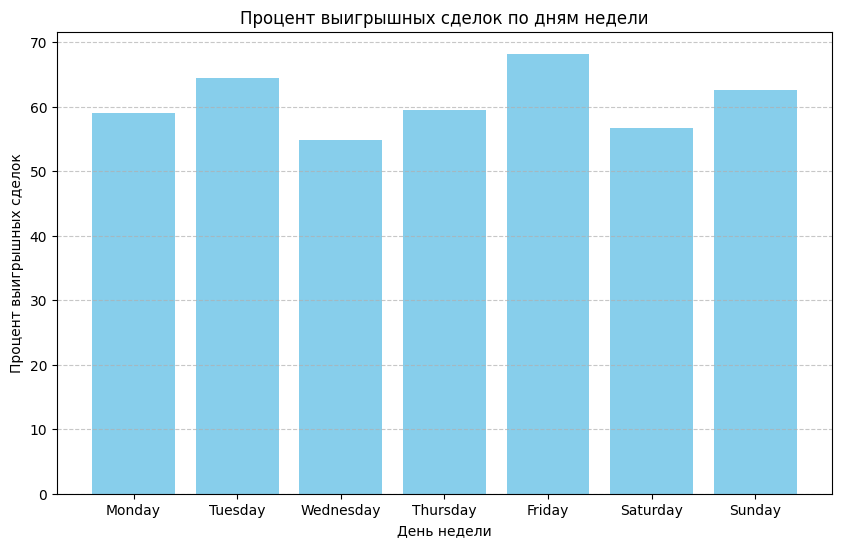

In [ ]:
import matplotlib.pyplot as plt

# Преобразуем столбец open в формат datetime и вытащим день недели
df['day_of_week'] = pd.to_datetime(df['open']).dt.day_name()

# Группируем по дню недели и считаем количество сделок
weekday_stats = df.groupby('day_of_week').agg(
    total_deals=('win', 'count'),
    win_deals=('win', lambda x: (x == 1).sum()),
    lose_deals=('win', lambda x: (x == 0).sum())
)

# Считаем процент выигрышных сделок
weekday_stats['win_rate'] = (weekday_stats['win_deals'] / weekday_stats['total_deals']) * 100

# Сортируем дни недели по правильному порядку
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_stats = weekday_stats.reindex(ordered_days)

# Выводим таблицу
print(weekday_stats)

# Строим график
plt.figure(figsize=(10, 6))
plt.bar(weekday_stats.index, weekday_stats['win_rate'], color='skyblue')
plt.title('Процент выигрышных сделок по дням недели')
plt.xlabel('День недели')
plt.ylabel('Процент выигрышных сделок')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


Анализ по дням недели:
             total_deals  win_deals  lose_deals   win_rate more_wins_or_loses
day_of_week                                                                  
Monday               364        215         149  59.065934                Win
Tuesday              304        196         108  64.473684                Win
Wednesday            230        126         104  54.782609                Win
Thursday             220        131          89  59.545455                Win
Friday               283        193          90  68.197880                Win
Saturday             286        162         124  56.643357                Win
Sunday               240        150          90  62.500000                Win

Анализ по месяцам:
           total_deals  win_deals  lose_deals  avg_profit   win_rate profitability
month                                                                             
January          623.0      385.0       238.0   -0.520170  61.797753  Unprofitable
Februa

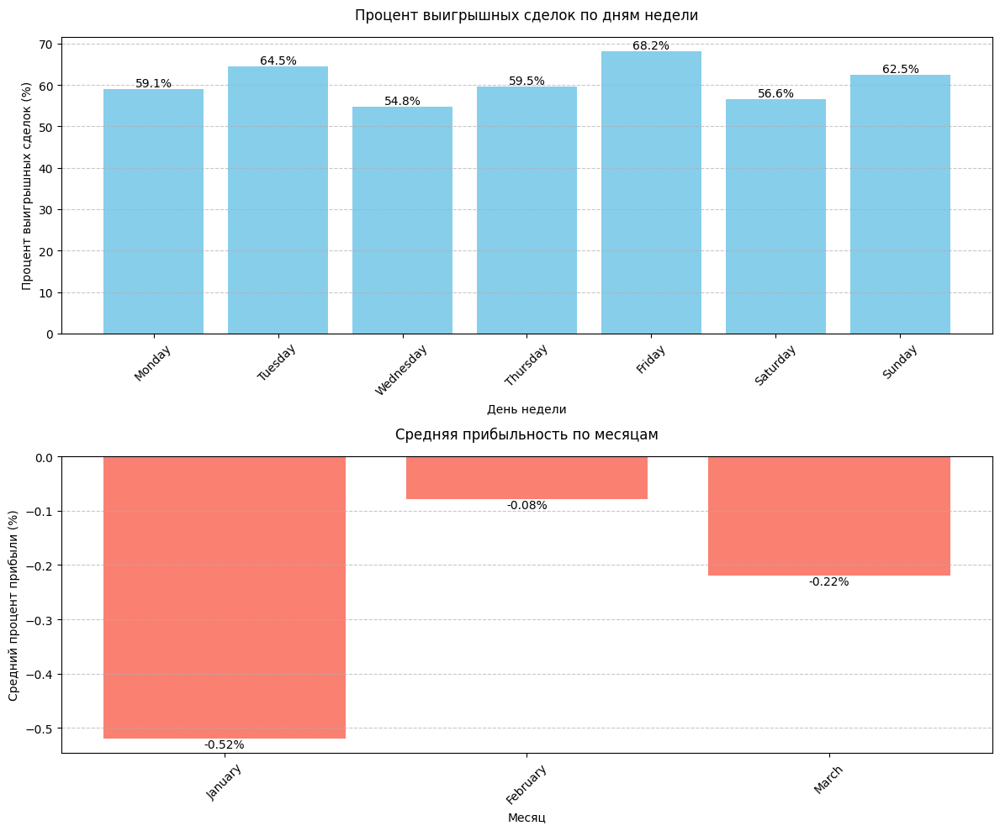

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Предполагаем, что у нас есть DataFrame df с колонками 'open', 'win', 'percent_change'
# Добавляем столбцы с днём недели и месяцем
df['day_of_week'] = pd.to_datetime(df['open']).dt.day_name()
df['month'] = pd.to_datetime(df['open']).dt.month_name()

# Анализ по дням недели
weekday_stats = df.groupby('day_of_week').agg(
    total_deals=('win', 'count'),
    win_deals=('win', lambda x: (x == 1).sum()),
    lose_deals=('win', lambda x: (x == 0).sum())
)
weekday_stats['win_rate'] = (weekday_stats['win_deals'] / weekday_stats['total_deals']) * 100
weekday_stats['more_wins_or_loses'] = weekday_stats.apply(
    lambda row: 'Win' if row['win_deals'] > row['lose_deals'] else 'Lose',
    axis=1
)

ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_stats = weekday_stats.reindex(ordered_days)

print("Анализ по дням недели:")
print(weekday_stats)

# Анализ по месяцам
month_stats = df.groupby('month').agg(
    total_deals=('win', 'count'),
    win_deals=('win', lambda x: (x == 1).sum()),
    lose_deals=('win', lambda x: (x == 0).sum()),
    avg_profit=('percent_change', 'mean')
).fillna(0)  # Заполняем NaN нулями
month_stats['win_rate'] = (month_stats['win_deals'] / month_stats['total_deals'] * 100).fillna(0)
month_stats['profitability'] = month_stats['avg_profit'].apply(
    lambda x: 'Profitable' if x > 0 else 'Unprofitable'
)

ordered_months = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]
month_stats = month_stats.reindex(ordered_months)

print("\nАнализ по месяцам:")
print(month_stats)

# Графики
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# График по дням недели
bars1 = axes[0].bar(weekday_stats.index, weekday_stats['win_rate'], color='skyblue')
axes[0].set_title('Процент выигрышных сделок по дням недели', pad=15)
axes[0].set_xlabel('День недели')
axes[0].set_ylabel('Процент выигрышных сделок (%)')
axes[0].grid(axis='y', linestyle='--', alpha=0.7)
axes[0].tick_params(axis='x', rotation=45)

for bar in bars1:
    height = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%',
                ha='center', va='bottom')

# График по месяцам
bars2 = axes[1].bar(month_stats.index, month_stats['avg_profit'],
                   color=['lightgreen' if x > 0 else 'salmon' for x in month_stats['avg_profit']])
axes[1].set_title('Средняя прибыльность по месяцам', pad=15)
axes[1].set_xlabel('Месяц')
axes[1].set_ylabel('Средний процент прибыли (%)')
axes[1].grid(axis='y', linestyle='--', alpha=0.7)
axes[1].tick_params(axis='x', rotation=45)
axes[1].axhline(y=0, color='black', linestyle='-', alpha=0.3)

for bar in bars2:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.2f}%',
                ha='center', va='bottom' if height > 0 else 'top')

plt.tight_layout()
plt.show()

<ipython-input-33-c441aeb41dcd>:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month'] = df['open_time'].dt.to_period('M')


Статистика по дням:
         Проигрышные дни  Выигрышные дни
month                                   
2025-01                0               8
2025-02                2              26
2025-03               12              17

Статистика по сделкам:
         Неуспешные сделки  Успешные сделки
month                                      
2025-01                238              385
2025-02                358              579
2025-03                158              209


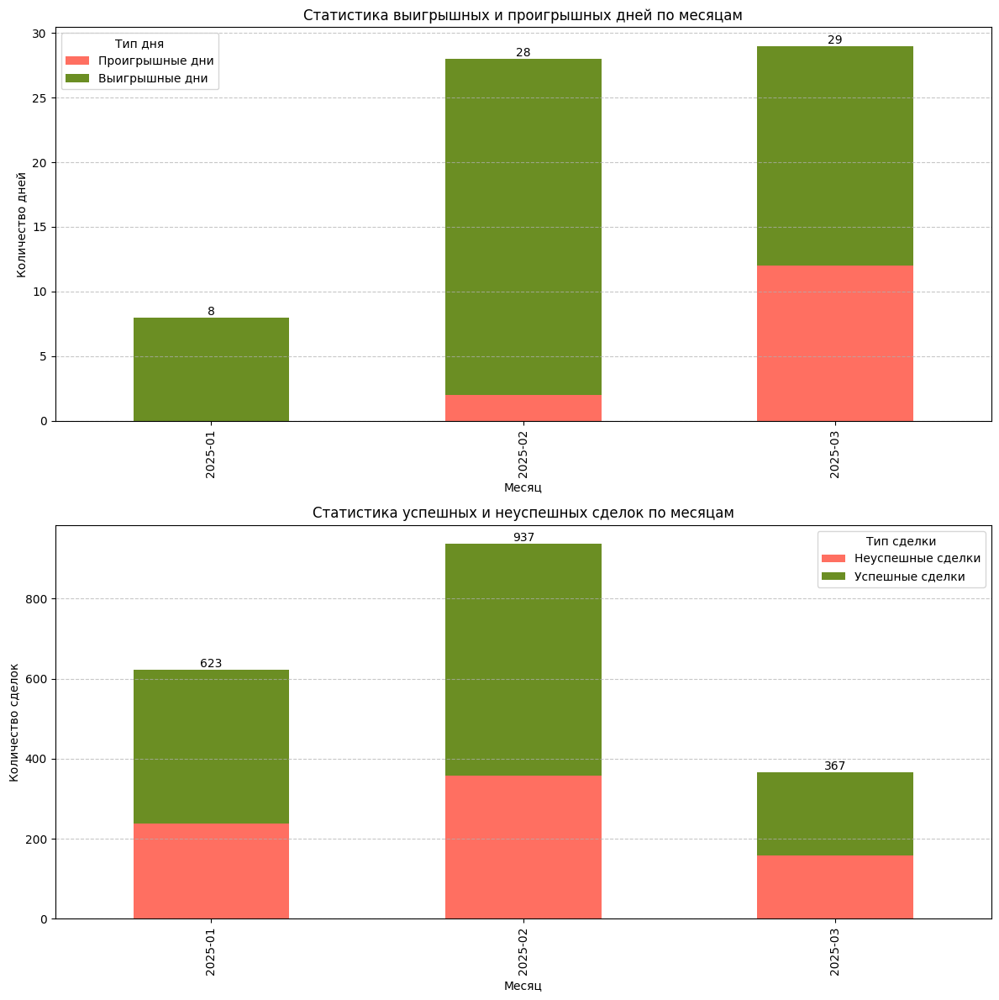

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Преобразуем столбец 'open_time' в формат даты
df['open_time'] = pd.to_datetime(df['open'])
df['month'] = df['open_time'].dt.to_period('M')
df['day'] = df['open_time'].dt.date

# Определяем, является ли сделка выигрышной
df['is_win'] = df['win'].apply(lambda x: 1 if x > 0 else 0)

# 1. Статистика по дням
# Группируем по дням, чтобы определить, был ли день выигрышным
daily_stats = df.groupby('day').agg({
    'is_win': ['sum', 'count']
}).reset_index()
daily_stats.columns = ['day', 'win_count', 'total_count']
daily_stats['win_day'] = (daily_stats['win_count'] > daily_stats['total_count']/2).astype(int)
daily_stats['month'] = pd.to_datetime(daily_stats['day']).dt.to_period('M')

# Группируем по месяцам и считаем выигрышные и проигрышные дни
monthly_day_stats = daily_stats.groupby(['month', 'win_day']).size().unstack(fill_value=0)
if not monthly_day_stats.empty:
    monthly_day_stats.columns = ['Проигрышные дни', 'Выигрышные дни']

# 2. Статистика по сделкам
monthly_trade_stats = df.groupby(['month', 'is_win']).size().unstack(fill_value=0)
if not monthly_trade_stats.empty:
    monthly_trade_stats.columns = ['Неуспешные сделки', 'Успешные сделки']

# Выводим таблицы
print("Статистика по дням:")
print(monthly_day_stats)
print("\nСтатистика по сделкам:")
print(monthly_trade_stats)

# Графики
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

# График по дням
if not monthly_day_stats.empty:
    monthly_day_stats.plot(kind='bar', stacked=True, ax=ax1,
                          color=['#FF6F61', '#6B8E23'])
    ax1.set_title('Статистика выигрышных и проигрышных дней по месяцам')
    ax1.set_xlabel('Месяц')
    ax1.set_ylabel('Количество дней')
    ax1.legend(title='Тип дня')
    ax1.grid(axis='y', linestyle='--', alpha=0.7)

    # Добавляем подписи значений
    for i, (index, row) in enumerate(monthly_day_stats.iterrows()):
        total_height = row['Проигрышные дни'] + row['Выигрышные дни']
        ax1.text(i, total_height, str(total_height),
                ha='center', va='bottom')

# График по сделкам
if not monthly_trade_stats.empty:
    monthly_trade_stats.plot(kind='bar', stacked=True, ax=ax2,
                           color=['#FF6F61', '#6B8E23'])
    ax2.set_title('Статистика успешных и неуспешных сделок по месяцам')
    ax2.set_xlabel('Месяц')
    ax2.set_ylabel('Количество сделок')
    ax2.legend(title='Тип сделки')
    ax2.grid(axis='y', linestyle='--', alpha=0.7)

    # Добавляем подписи значений
    for i, (index, row) in enumerate(monthly_trade_stats.iterrows()):
        total_height = row['Неуспешные сделки'] + row['Успешные сделки']
        ax2.text(i, total_height, str(total_height),
                ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [ ]:
df.tail(10)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win
3231,TRUMP,243980.0,SELLING,-0.47,6.77B,662.90M,160870000.0,9.87M,48.80K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 10:22:37+00:00,2025-01-24 10:27:37+00:00,48.80K,1 min,34.3010,34.19600,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",-0.306114,win,1,2025-01-24,Friday,2025-01,2025-01-24 10:22:37+00:00,2025-01-24,1
3237,swarms,78340.0,SELLING,-2.05,129.43M,7.29M,29590000.0,721.07K,5.22K every 1min,15m,mexc bitget gate,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-01-24 09:29:59+00:00,2025-01-24 09:44:59+00:00,5.22K,1 min,0.1294,0.12972,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.247295,loss,0,2025-01-24,Friday,2025-01,2025-01-24 09:29:59+00:00,2025-01-24,0
3238,swarms,78340.0,SELLING,-2.01,129.43M,7.29M,29590000.0,721.07K,5.22K every 1min,15m,mexc bitget gate,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-01-24 09:29:49+00:00,2025-01-24 09:44:49+00:00,5.22K,1 min,0.1294,0.12972,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.247295,loss,0,2025-01-24,Friday,2025-01,2025-01-24 09:29:49+00:00,2025-01-24,0
3239,Fartcoin,100010.0,BUYING,0.54,1.45B,26.76M,93410000.0,1.10M,2.27K every 1min,44m,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 08:58:59+00:00,2025-01-24 09:42:59+00:00,2.27K,1 min,1.4484,1.39450,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",-3.721348,loss,0,2025-01-24,Friday,2025-01,2025-01-24 08:58:59+00:00,2025-01-24,0
3243,AVA,122240.0,SELLING,-3.80,152.88M,5.20M,19520000.0,579.48K,12.22K every 1min,10m,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 08:11:43+00:00,2025-01-24 08:21:43+00:00,12.22K,1 min,0.9329,0.93680,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.418051,loss,0,2025-01-24,Friday,2025-01,2025-01-24 08:11:43+00:00,2025-01-24,0
3247,AVA,143370.0,SELLING,-4.73,159.39M,5.32M,19490000.0,362.04K,716.85 every 1min,3h,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 07:20:51+00:00,2025-01-24 10:40:51+00:00,716.85,1 min,0.9350,0.93950,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.481283,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:20:51+00:00,2025-01-24,0
3248,Fartcoin,500050.0,BUYING,2.78,1.46B,26.68M,102420000.0,1.75M,50.01K every 1min,10m,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 07:14:53+00:00,2025-01-24 07:24:53+00:00,50.01K,1 min,1.4297,1.41420,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",-1.084144,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:14:53+00:00,2025-01-24,0
3249,TRUMP,500050.0,BUYING,4.47,6.98B,670.26M,152920000.0,1.14M,100.01K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:14:18+00:00,2025-01-24 07:19:18+00:00,100.01K,1 min,34.3690,34.46200,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.270593,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:14:18+00:00,2025-01-24,1
3250,TRUMP,347160.0,BUYING,3.28,6.98B,670.26M,152920000.0,1.14M,69.43K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:13:49+00:00,2025-01-24 07:18:49+00:00,69.43K,1 min,34.3650,34.44700,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.238615,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:13:49+00:00,2025-01-24,1
3251,TRUMP,1000000.0,BUYING,9.14,6.84B,665.23M,156110000.0,3.02M,200.03K every 1min,5m,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 06:45:25+00:00,2025-01-24 06:50:25+00:00,200.03K,1 min,34.4850,34.74300,"[{'timestamp': datetime.datetime(2025, 1, 24, ...",0.748151,win,1,2025-0

In [ ]:
df.head()

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win
0,KMNO,87030.0,SELLING,-8.88,68.94M,3.66M,1360000.0,49.91K,1.45K every 1min,1h,mexc bitget gate binance,KMNo3nJsBXfcpJTVhZcXLW7RmTwTt4GVFE7suUBo9sS,NaN,NaN,NaN,NaN,2025-03-29 17:21:39+00:00,2025-03-29 18:21:39+00:00,1.45K,1 min,0.05122,0.05124,"[{'timestamp': datetime.datetime(2025, 3, 29, ...",0.039047,loss,0,2025-03-29,Saturday,2025-03,2025-03-29 17:21:39+00:00,2025-03-29,0
1,Fartcoin,100040.0,BUYING,1.92,418.90M,20.69M,8520000.0,239.29K,3.33K every 1min,30m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-29 15:14:17+00:00,2025-03-29 15:44:17+00:00,3.33K,1 min,0.42080,0.41580,"[{'timestamp': datetime.datetime(2025, 3, 29, ...",-1.188213,loss,0,2025-03-29,Saturday,2025-03,2025-03-29 15:14:17+00:00,2025-03-29,0
2,Fartcoin,297800.0,SELLING,-5.26,416.78M,21.76M,9370000.0,193.56K,49.63K every 1min,5m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-29 10:36:57+00:00,2025-03-29 10:42:57+00:00,49.63K,1 min,0.41650,0.41620,"[{'timestamp': datetime.datetime(2025, 3, 29, ...",-0.072029,win,1,2025-03-29,Saturday,2025-03,2025-03-29 10:36:57+00:00,2025-03-29,1
4,Fartcoin,480340.0,BUYING,7.97,458.52M,23.60M,11000000.0,222.93K,48.03K every 2min,19m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-28 23:26:18+00:00,2025-03-28 23:46:18+00:00,48.03K,2 min,0.46060,0.46900,"[{'timestamp': datetime.datetime(2025, 3, 28, ...",1.823708,win,1,2025-03-28,Friday,2025-03,2025-03-28 23:26:18+00:00,2025-03-28,1
5,Fartcoin,87130.0,SELLING,-1.51,463.19M,22.84M,10390000.0,1.72M,21.78K every 1min,4m,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-28 18:22:38+00:00,2025-03-28 18:26:38+00:00,21.78K,1 min,0.46190,0.46050,"[{'timestamp': datetime.datetime(2025, 3, 28, ...",-0.303096,win,1,2025-03-28,Friday,2025-03,2025-03-28 18:22:38+00:00,2025-03-28,1


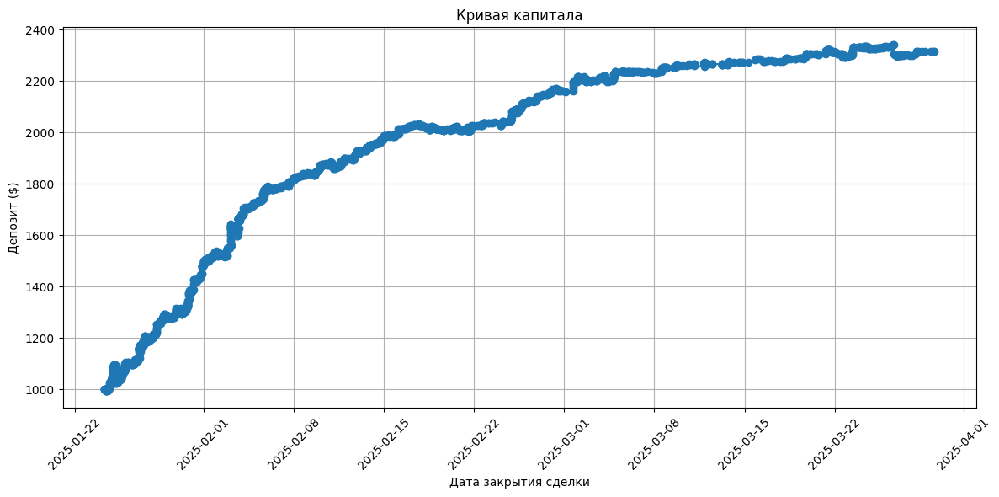

Прибыль по месяцам:
     month      profit
0  2025-01  478.221411
1  2025-02  682.239451
2  2025-03  155.509125


<ipython-input-36-0377c7927700>:50: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month'] = df['close'].dt.to_period('M')


<Figure size 1200x600 with 0 Axes>

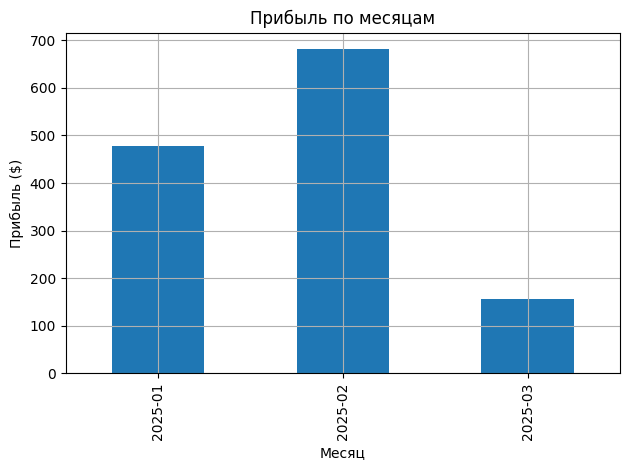

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Преобразуем даты в формат datetime
df['open'] = pd.to_datetime(df['open'])
df['close'] = pd.to_datetime(df['close'])

# Шаг 1: Расчет прибыли для каждой сделки
def calculate_profit(row):
    if row['side'] == 'BUYING':
        return 100 * (row['close_price'] / row['open_price'] - 1)
    elif row['side'] == 'SELLING':
        return 100 * (1 - row['close_price'] / row['open_price'])
    else:
        return 0

df['profit'] = df.apply(calculate_profit, axis=1)

# Шаг 2: Сортировка по дате открытия
df = df.sort_values(by='open')

# Шаг 3: Моделирование депозита
initial_deposit = 1000
deposit = initial_deposit
equity_curve = [initial_deposit]

for index, row in df.iterrows():
    if deposit >= 100:
        profit = row['profit']
        deposit += profit
        equity_curve.append(deposit)
    else:
        equity_curve.append(deposit)  # Депозит не меняется, если не хватает средств

# Добавляем equity_curve в DataFrame
df['equity_after_trade'] = equity_curve[1:]  # Берем значения после каждой сделки

# Шаг 4: Построение кривой капитала
plt.figure(figsize=(12, 6))
plt.plot(df['close'], df['equity_after_trade'], marker='o', linestyle='-')
plt.title("Кривая капитала")
plt.xlabel("Дата закрытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Шаг 5: Прибыль по месяцам
df['month'] = df['close'].dt.to_period('M')
monthly_profit = df.groupby('month')['profit'].sum().reset_index()

print("Прибыль по месяцам:")
print(monthly_profit)

# График прибыли по месяцам
plt.figure(figsize=(12, 6))
monthly_profit.plot(x='month', y='profit', kind='bar', legend=False)
plt.title("Прибыль по месяцам")
plt.xlabel("Месяц")
plt.ylabel("Прибыль ($)")
plt.grid(True)
plt.tight_layout()
plt.show()


Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465, порог ликвидации 0.7302
Цена ликвидации для BUYING: 0.7302
Свеча low: 0.7588 (отклонение: -0.24%)
Свеча low: 0.7583 (отклонение: -0.30%)
Свеча low: 0.7563 (отклонение: -0.57%)
Свеча low: 0.756 (отклонение: -0.60%)
Свеча low: 0.7553 (отклонение: -0.70%)
Свеча low: 0.7544 (отклонение: -0.82%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7551 (отклонение: -0.72%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7555 (отклонение: -0.67%)
Свеча low: 0.7548 (отклонение: -0.76%)
Свеча low: 0.7545 (отклонение: -0.80%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7536 (отклонение: -0.92%)
Свеча low: 0.754 (отклонение: -0.87%)
Свеча low: 0.7528 (отклонение: -1.03%)
Свеча low: 0.7527 (отклонение: -1.04%)
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.754
Прибыль для JUP: -21.69 

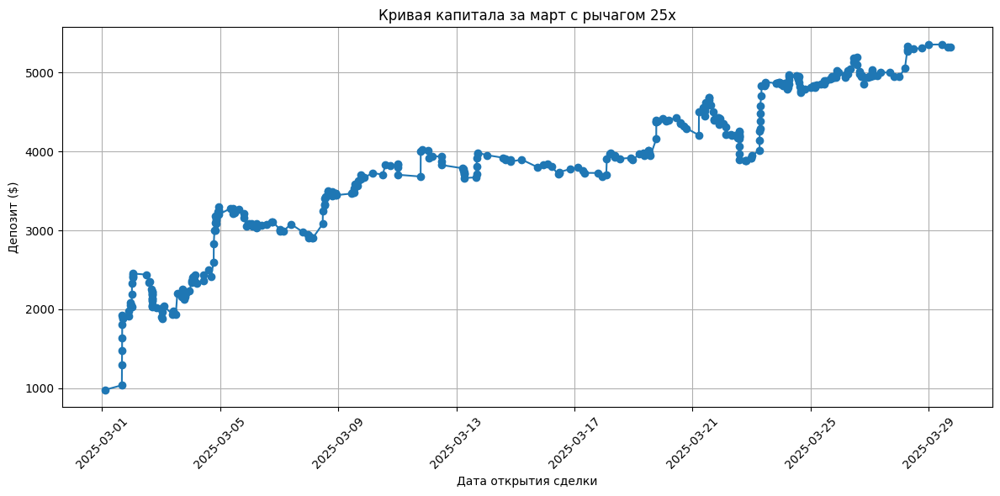

Итоговый депозит за март с рычагом 25x: $5327.61
Количество ликвидаций: 10


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов (в процентах, но переведем в цены при выводе)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для проверки ликвидации и симуляции сделки
def simulate_trade(row, stop_loss_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации: убыток, равный инвестиции ($100), деленный на плечо
    liquidation_threshold = 1 / leverage  # Например, при leverage=100 это 1% (0.01)

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для BUYING стоп-лосс ниже open_price
        liquidation_price = open_price * (1 - liquidation_threshold)  # Цена ликвидации для BUYING
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для SELLING стоп-лосс выше open_price
        liquidation_price = open_price * (1 + liquidation_threshold)  # Цена ликвидации для SELLING

    # Выводим цены вместо процентов
    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, порог ликвидации {liquidation_price:.4f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if low_price <= stop_loss_price:
                print(f"Стоп-лосс сработал на {low_price}")
                return low_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if high_price >= stop_loss_price:
                print(f"Стоп-лосс сработал на {high_price}")
                return high_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли с отладочными выводами
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        # Если ликвидация, убыток равен всей инвестиции
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
leverage = 25  # Плечо 100x

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0  # Счетчик ликвидаций

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, leverage, investment)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"Итоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")


Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465, порог ликвидации 0.7302
Цена ликвидации для BUYING: 0.7302
Свеча low: 0.7588 (отклонение: -0.24%)
Свеча low: 0.7583 (отклонение: -0.30%)
Свеча low: 0.7563 (отклонение: -0.57%)
Свеча low: 0.756 (отклонение: -0.60%)
Свеча low: 0.7553 (отклонение: -0.70%)
Свеча low: 0.7544 (отклонение: -0.82%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7551 (отклонение: -0.72%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7555 (отклонение: -0.67%)
Свеча low: 0.7548 (отклонение: -0.76%)
Свеча low: 0.7545 (отклонение: -0.80%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7536 (отклонение: -0.92%)
Свеча low: 0.754 (отклонение: -0.87%)
Свеча low: 0.7528 (отклонение: -1.03%)
Свеча low: 0.7527 (отклонение: -1.04%)
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.754
Прибыль для JUP: -21.69 

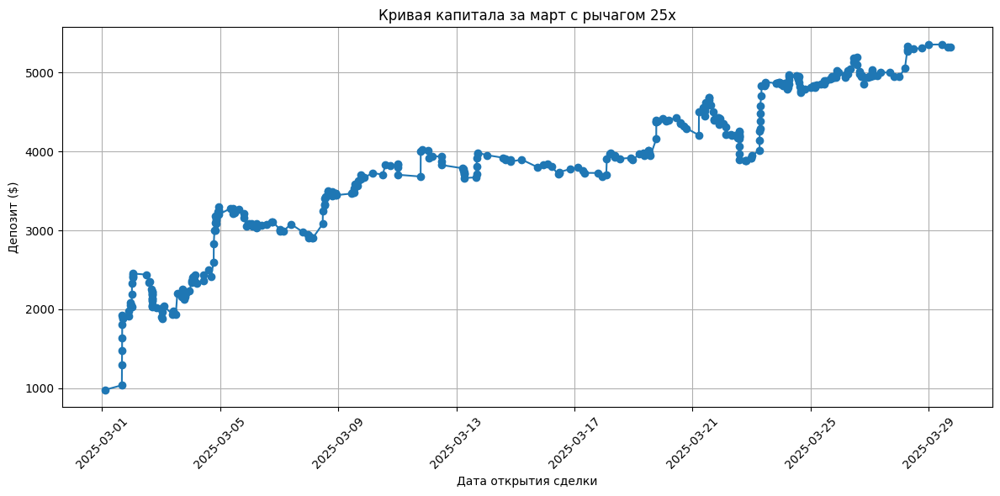


Итоговый депозит за март с рычагом 25x: $5327.61
Количество ликвидаций: 10

Детали ликвидаций:
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0408, Цена ликвидации: 0.0429, Время открытия: 2025-03-02 14:16:44+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0417, Цена ликвидации: 0.0449, Время открытия: 2025-03-02 16:11:26+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0639, Цена ликвидации: 0.0674, Время открытия: 2025-03-03 00:32:01+00:00
Тикер: swarms, Сторона: SELLING, Цена открытия: 0.0696, Цена ликвидации: 0.0724, Время открытия: 2025-03-03 09:19:22+00:00
Тикер: ZEREBRO, Сторона: BUYING, Цена открытия: 0.0621, Цена ликвидации: 0.0592, Время открытия: 2025-03-04 04:54:48+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0530, Цена ликвидации: 0.0551, Время открытия: 2025-03-05 21:24:13+00:00
Тикер: FWOG, Сторона: BUYING, Цена открытия: 0.0520, Цена ликвидации: 0.0498, Время открытия: 2025-03-16 10:41:37+00:00
Тикер: Fartcoin, Сторона: SELLING, Цена открытия: 0.36

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов (в процентах, но переведем в цены при выводе)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для проверки ликвидации и симуляции сделки
def simulate_trade(row, stop_loss_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации: убыток, равный инвестиции ($100), деленный на плечо
    liquidation_threshold = 1 / leverage  # Например, при leverage=25 это 4% (0.04)

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для BUYING стоп-лосс ниже open_price
        liquidation_price = open_price * (1 - liquidation_threshold)  # Цена ликвидации для BUYING
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для SELLING стоп-лосс выше open_price
        liquidation_price = open_price * (1 + liquidation_threshold)  # Цена ликвидации для SELLING

    # Выводим цены вместо процентов
    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, порог ликвидации {liquidation_price:.4f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if low_price <= stop_loss_price:
                print(f"Стоп-лосс сработал на {low_price}")
                return low_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if high_price >= stop_loss_price:
                print(f"Стоп-лосс сработал на {high_price}")
                return high_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли с отладочными выводами
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
leverage = 25  # Плечо 25x

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0  # Счетчик ликвидаций
liquidations = []  # Список для хранения деталей ликвидаций

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, leverage, investment)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
            # Собираем информацию о ликвидации
            liquidations.append({
                'ticker': row['ticker'],
                'side': row['side'],
                'open_price': row['open_price'],
                'liquidation_price': final_price,
                'open_time': row['open_time']
            })
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"\nИтоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

# Вывод деталей ликвидаций
if liquidations:
    print("\nДетали ликвидаций:")
    for liq in liquidations:
        print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
              f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
              f"Время открытия: {liq['open_time']}")
else:
    print("\nЛиквидаций не произошло.")

С базовым trailing stop loss в 1%


Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465, порог ликвидации 0.7302, trailing stop 1.0%
Цена ликвидации для BUYING: 0.7302
Свеча low: 0.7588 (отклонение: -0.24%), high: 0.7607
Новый максимум: 0.7607, trailing stop обновлен до 0.7531
Свеча low: 0.7583 (отклонение: -0.30%), high: 0.7602
Свеча low: 0.7563 (отклонение: -0.57%), high: 0.7586
Свеча low: 0.756 (отклонение: -0.60%), high: 0.7572
Свеча low: 0.7553 (отклонение: -0.70%), high: 0.757
Свеча low: 0.7544 (отклонение: -0.82%), high: 0.7567
Свеча low: 0.7543 (отклонение: -0.83%), high: 0.756
Свеча low: 0.7551 (отклонение: -0.72%), high: 0.7575
Свеча low: 0.7543 (отклонение: -0.83%), high: 0.7565
Свеча low: 0.7543 (отклонение: -0.83%), high: 0.7571
Свеча low: 0.7541 (отклонение: -0.85%), high: 0.7562
Свеча low: 0.7555 (отклонение: -0.67%), high: 0.7579
Свеча low: 0.7548 (отклонение: -0.76%), high: 0.7565
Свеча low: 0.7545 (отклонение: -0.80%), high: 0.7563
Свеча low: 0.7541 (отклонение: -0.85%), high: 0.7553
Свеча 

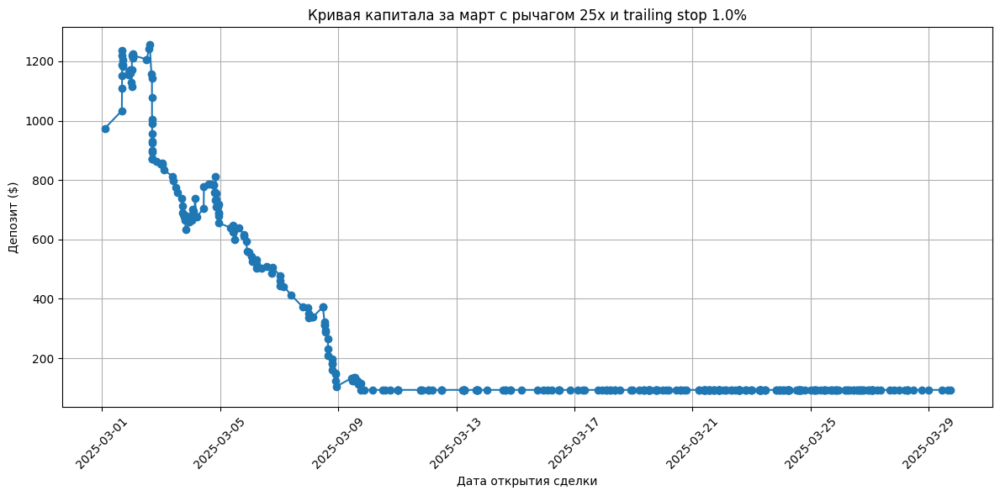

Итоговый депозит за март с рычагом 25x: $93.21
Количество ликвидаций: 1


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов (в процентах, но переведем в цены при выводе)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для проверки ликвидации, стоп-лосса и trailing stop loss
def simulate_trade(row, stop_loss_dict, leverage, investment, trailing_stop_percent):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации
    liquidation_threshold = 1 / leverage  # Например, при leverage=100 это 1% (0.01)

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Стоп-лосс ниже open_price
        liquidation_price = open_price * (1 - liquidation_threshold)  # Цена ликвидации для BUYING
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Стоп-лосс выше open_price
        liquidation_price = open_price * (1 + liquidation_threshold)  # Цена ликвидации для SELLING

    # Выводим цены вместо процентов
    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, порог ликвидации {liquidation_price:.4f}, "
          f"trailing stop {trailing_stop_percent*100}%")

    if side == 'BUYING':
        max_high = open_price  # Максимальная цена для trailing stop
        trailing_stop_price = max_high * (1 - trailing_stop_percent)  # Начальный trailing stop
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((low_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%), high: {high_price}")
            # Обновляем максимум и trailing stop
            if high_price > max_high:
                max_high = high_price
                trailing_stop_price = max_high * (1 - trailing_stop_percent)
                print(f"Новый максимум: {max_high}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка trailing stop
            if low_price <= trailing_stop_price:
                print(f"Trailing stop сработал на {low_price}")
                return low_price, False
            # Проверка обычного стоп-лосса
            if low_price <= stop_loss_price:
                print(f"Стоп-лосс сработал на {low_price}")
                return low_price, False
        print(f"Ни стоп-лосс, ни ликвидация, ни trailing stop не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        min_low = open_price  # Минимальная цена для trailing stop
        trailing_stop_price = min_low * (1 + trailing_stop_percent)  # Начальный trailing stop
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%), low: {low_price}")
            # Обновляем минимум и trailing stop
            if low_price < min_low:
                min_low = low_price
                trailing_stop_price = min_low * (1 + trailing_stop_percent)
                print(f"Новый минимум: {min_low}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка trailing stop
            if high_price >= trailing_stop_price:
                print(f"Trailing stop сработал на {high_price}")
                return high_price, False
            # Проверка обычного стоп-лосса
            if high_price >= stop_loss_price:
                print(f"Стоп-лосс сработал на {high_price}")
                return high_price, False
        print(f"Ни стоп-лосс, ни ликвидация, ни trailing stop не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли с отладочными выводами
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        # Если ликвидация, убыток равен всей инвестиции
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
leverage = 25  # Плечо 100x
trailing_stop_percent = 0.01  # Trailing stop 1%

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0  # Счетчик ликвидаций

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, leverage, investment, trailing_stop_percent)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x и trailing stop {trailing_stop_percent*100}%")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"Итоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

моя идея


Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465, порог ликвидации 0.7302
Цена ликвидации для BUYING: 0.7302
Свеча low: 0.7588 (отклонение: -0.24%), high: 0.7607
Новый максимум: 0.7607, trailing stop обновлен до 0.7466
Свеча low: 0.7583 (отклонение: -0.30%), high: 0.7602
Свеча low: 0.7563 (отклонение: -0.57%), high: 0.7586
Свеча low: 0.756 (отклонение: -0.60%), high: 0.7572
Свеча low: 0.7553 (отклонение: -0.70%), high: 0.757
Свеча low: 0.7544 (отклонение: -0.82%), high: 0.7567
Свеча low: 0.7543 (отклонение: -0.83%), high: 0.756
Свеча low: 0.7551 (отклонение: -0.72%), high: 0.7575
Свеча low: 0.7543 (отклонение: -0.83%), high: 0.7565
Свеча low: 0.7543 (отклонение: -0.83%), high: 0.7571
Свеча low: 0.7541 (отклонение: -0.85%), high: 0.7562
Свеча low: 0.7555 (отклонение: -0.67%), high: 0.7579
Свеча low: 0.7548 (отклонение: -0.76%), high: 0.7565
Свеча low: 0.7545 (отклонение: -0.80%), high: 0.7563
Свеча low: 0.7541 (отклонение: -0.85%), high: 0.7553
Свеча low: 0.7541 (отклоне

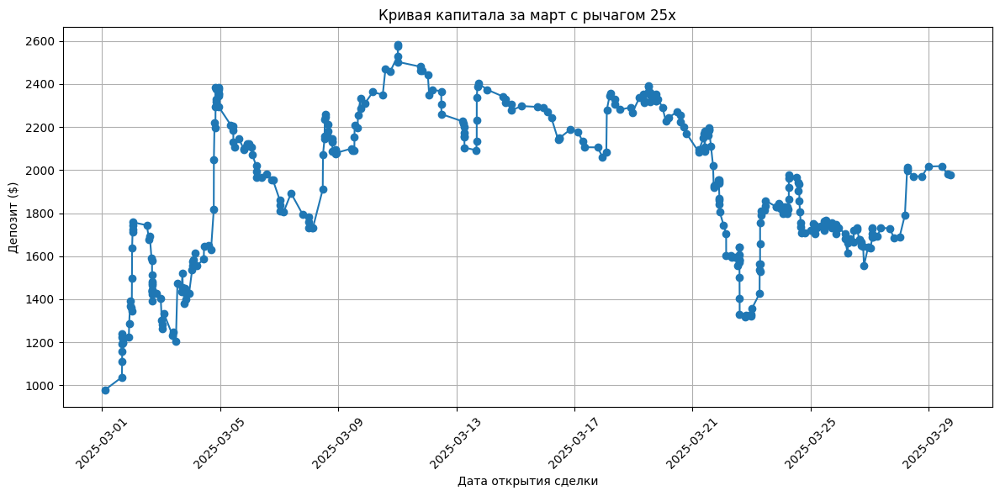

Итоговый депозит за март с рычагом 25x: $1978.89
Количество ликвидаций: 5


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

def simulate_trade(row, stop_loss_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)  # Начальный стоп-лосс в процентах
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации
    liquidation_threshold = 1 / leverage

    # Начальные цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Начальный стоп-лосс ниже open_price
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Начальный стоп-лосс выше open_price
        liquidation_price = open_price * (1 + liquidation_threshold)

    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, порог ликвидации {liquidation_price:.4f}")

    if side == 'BUYING':
        max_high = open_price  # Начальный максимум
        trailing_stop_price = stop_loss_price  # Trailing stop начинается с начального стоп-лосса
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%), high: {high_price}")
            # Обновляем максимум и trailing stop
            if high_price > max_high:
                price_increase_percent = (high_price - open_price) / open_price  # Процент роста
                max_high = high_price
                # Сдвигаем trailing stop на процент роста от начальной цены
                trailing_stop_price = open_price * (1 + stop_loss + price_increase_percent)
                print(f"Новый максимум: {max_high}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
            # Проверка trailing stop
            if low_price <= trailing_stop_price:
                print(f"Trailing stop сработал на {low_price}")
                return low_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        min_low = open_price  # Начальный минимум
        trailing_stop_price = stop_loss_price  # Trailing stop начинается с начального стоп-лосса
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%), low: {low_price}")
            # Обновляем минимум и trailing stop
            if low_price < min_low:
                price_decrease_percent = (open_price - low_price) / open_price  # Процент падения
                min_low = low_price
                # Сдвигаем trailing stop на процент падения от начальной цены
                trailing_stop_price = open_price * (1 + stop_loss - price_decrease_percent)
                print(f"Новый минимум: {min_low}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
            # Проверка trailing stop
            if high_price >= trailing_stop_price:
                print(f"Trailing stop сработал на {high_price}")
                return high_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
df['open_time'] = pd.to_datetime(df['open_time'])
df_march = df[df['open_time'].dt.month == 3]
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
leverage = 25

# Инициализация
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, leverage, investment)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

df_march['equity_after_trade'] = equity_curve[1:]

# График
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"Итоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")


Решение проблемы с ликвидацией

Стоп-лосс скорректирован с -1.85% до -3.67% (больше ликвидации)

Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7327, порог ликвидации 0.7352
Цена ликвидации для BUYING: 0.7352
Свеча low: 0.7588 (отклонение: -0.24%)
Свеча low: 0.7583 (отклонение: -0.30%)
Свеча low: 0.7563 (отклонение: -0.57%)
Свеча low: 0.756 (отклонение: -0.60%)
Свеча low: 0.7553 (отклонение: -0.70%)
Свеча low: 0.7544 (отклонение: -0.82%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7551 (отклонение: -0.72%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7555 (отклонение: -0.67%)
Свеча low: 0.7548 (отклонение: -0.76%)
Свеча low: 0.7545 (отклонение: -0.80%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7536 (отклонение: -0.92%)
Свеча low: 0.754 (отклонение: -0.87%)
Свеча low: 0.7528 (отклонение: -1.03%)
Свеча low: 0.7527 (отклонение: -1.04%)
Ни стоп-лосс, ни ликвидация не ср

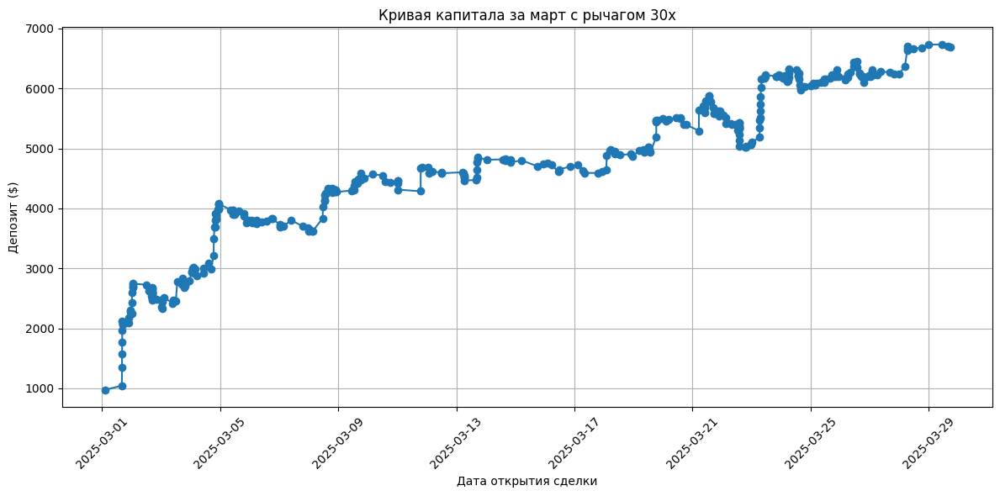


Итоговый депозит за март с рычагом 30x: $6697.03
Количество ликвидаций: 41

Детали ликвидаций:
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0408, Цена ликвидации: 0.0429, Время открытия: 2025-03-02 14:16:44+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0417, Цена ликвидации: 0.0449, Время открытия: 2025-03-02 16:11:26+00:00
Тикер: Fartcoin, Сторона: BUYING, Цена открытия: 0.2846, Цена ликвидации: 0.2745, Время открытия: 2025-03-02 16:39:39+00:00
Тикер: Fartcoin, Сторона: BUYING, Цена открытия: 0.2867, Цена ликвидации: 0.2759, Время открытия: 2025-03-02 16:44:23+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0639, Цена ликвидации: 0.0674, Время открытия: 2025-03-03 00:32:01+00:00
Тикер: swarms, Сторона: SELLING, Цена открытия: 0.0696, Цена ликвидации: 0.0724, Время открытия: 2025-03-03 09:19:22+00:00
Тикер: JUP, Сторона: BUYING, Цена открытия: 0.7323, Цена ликвидации: 0.7061, Время открытия: 2025-03-03 17:40:33+00:00
Тикер: arc, Сторона: BUYING, Цена открытия: 0.1977,

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re
import numpy as np

# Определение стоп-лоссов (в процентах, но переведем в цены при выводе)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для проверки ликвидации и симуляции сделки
def simulate_trade(row, stop_loss_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации
    liquidation_threshold = 1 / leverage  # Например, при leverage=25 это 4% (0.04)

    # Корректировка стоп-лосса, если он меньше ликвидации по модулю
    min_stop_loss = liquidation_threshold * 1.1  # Запас 10% от ликвидации
    if side == 'BUYING' and stop_loss > -min_stop_loss:
        original_stop_loss = stop_loss
        stop_loss = -min_stop_loss
        print(f"Стоп-лосс скорректирован с {original_stop_loss*100:.2f}% до {stop_loss*100:.2f}% (больше ликвидации)")
    elif side == 'SELLING' and stop_loss < min_stop_loss:
        original_stop_loss = stop_loss
        stop_loss = min_stop_loss
        print(f"Стоп-лосс скорректирован с {original_stop_loss*100:.2f}% до {stop_loss*100:.2f}% (больше ликвидации)")

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для BUYING стоп-лосс ниже open_price
        liquidation_price = open_price * (1 - liquidation_threshold)  # Цена ликвидации для BUYING
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для SELLING стоп-лосс выше open_price
        liquidation_price = open_price * (1 + liquidation_threshold)  # Цена ликвидации для SELLING

    # Выводим цены вместо процентов
    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, порог ликвидации {liquidation_price:.4f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if low_price <= stop_loss_price:
                print(f"Стоп-лосс сработал на {low_price}")
                return low_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if high_price >= stop_loss_price:
                print(f"Стоп-лосс сработал на {high_price}")
                return high_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли с отладочными выводами
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Расчет метрик стратегии
def calculate_metrics(equity_curve, profits):
    # Максимальная просадка
    peak = np.maximum.accumulate(equity_curve)
    drawdowns = (peak - equity_curve) / peak * 100
    max_drawdown = np.max(drawdowns) if len(drawdowns) > 0 else 0

    # Общая доходность
    initial_deposit = equity_curve[0]
    final_deposit = equity_curve[-1]
    total_return = (final_deposit - initial_deposit) / initial_deposit * 100

    # Средняя прибыль/убыток на сделку
    avg_profit_loss = np.mean(profits) if profits else 0

    # Процент прибыльных сделок
    win_rate = (np.sum(np.array(profits) > 0) / len(profits) * 100) if profits else 0

    # Коэффициент Шарпа (упрощённый, без безрисковой ставки)
    returns = np.diff(equity_curve) / equity_curve[:-1]  # Доходность между шагами
    sharpe_ratio = np.mean(returns) / np.std(returns) if np.std(returns) != 0 else 0

    return {
        'Max Drawdown (%)': max_drawdown,
        'Total Return (%)': total_return,
        'Average Profit/Loss per Trade ($)': avg_profit_loss,
        'Win Rate (%)': win_rate,
        'Sharpe Ratio': sharpe_ratio
    }

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
leverage = 30  # Плечо 25x

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0  # Счетчик ликвидаций
liquidations = []  # Список для хранения деталей ликвидаций
profits = []  # Список для хранения прибылей/убытков

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, leverage, investment)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        profits.append(profit)  # Сохраняем прибыль/убыток
        if liquidated:
            liquidation_count += 1
            liquidations.append({
                'ticker': row['ticker'],
                'side': row['side'],
                'open_price': row['open_price'],
                'liquidation_price': final_price,
                'open_time': row['open_time']
            })
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Расчет метрик
metrics = calculate_metrics(equity_curve, profits)

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"\nИтоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

# Вывод деталей ликвидаций
if liquidations:
    print("\nДетали ликвидаций:")
    for liq in liquidations:
        print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
              f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
              f"Время открытия: {liq['open_time']}")
else:
    print("\nЛиквидаций не произошло.")

# Вывод метрик
print("\nМетрики стратегии:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.2f}")

Рассчет с учетом комиссий

Стоп-лосс скорректирован с -1.85% до -3.67% (больше ликвидации)

Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7327, порог ликвидации 0.7352
Цена ликвидации для BUYING: 0.7352
Свеча low: 0.7588 (отклонение: -0.24%)
Свеча low: 0.7583 (отклонение: -0.30%)
Свеча low: 0.7563 (отклонение: -0.57%)
Свеча low: 0.756 (отклонение: -0.60%)
Свеча low: 0.7553 (отклонение: -0.70%)
Свеча low: 0.7544 (отклонение: -0.82%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7551 (отклонение: -0.72%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7555 (отклонение: -0.67%)
Свеча low: 0.7548 (отклонение: -0.76%)
Свеча low: 0.7545 (отклонение: -0.80%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7536 (отклонение: -0.92%)
Свеча low: 0.754 (отклонение: -0.87%)
Свеча low: 0.7528 (отклонение: -1.03%)
Свеча low: 0.7527 (отклонение: -1.04%)
Ни стоп-лосс, ни ликвидация не ср

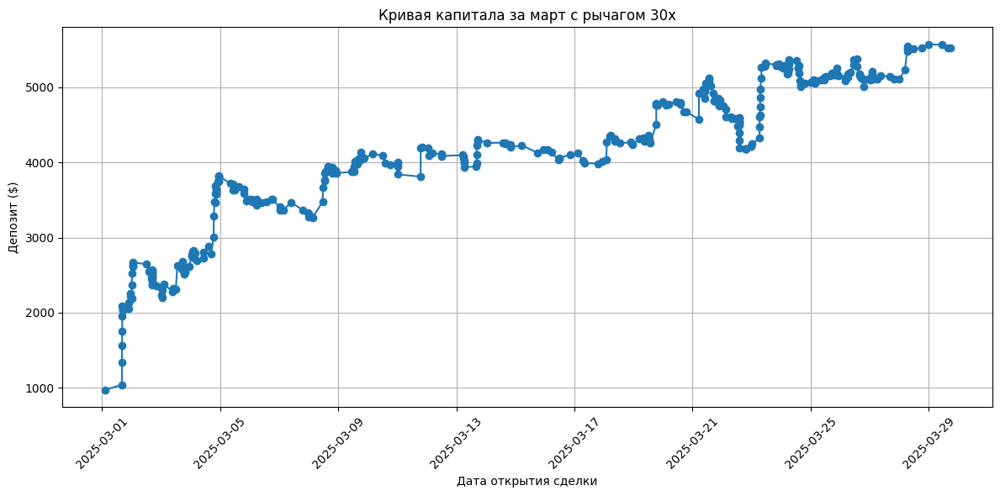


Итоговый депозит за март с рычагом 30x: $5525.53
Количество ликвидаций: 41

Детали ликвидаций:
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0408, Цена ликвидации: 0.0429, Время открытия: 2025-03-02 14:16:44+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0417, Цена ликвидации: 0.0449, Время открытия: 2025-03-02 16:11:26+00:00
Тикер: Fartcoin, Сторона: BUYING, Цена открытия: 0.2846, Цена ликвидации: 0.2745, Время открытия: 2025-03-02 16:39:39+00:00
Тикер: Fartcoin, Сторона: BUYING, Цена открытия: 0.2867, Цена ликвидации: 0.2759, Время открытия: 2025-03-02 16:44:23+00:00
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0639, Цена ликвидации: 0.0674, Время открытия: 2025-03-03 00:32:01+00:00
Тикер: swarms, Сторона: SELLING, Цена открытия: 0.0696, Цена ликвидации: 0.0724, Время открытия: 2025-03-03 09:19:22+00:00
Тикер: JUP, Сторона: BUYING, Цена открытия: 0.7323, Цена ликвидации: 0.7061, Время открытия: 2025-03-03 17:40:33+00:00
Тикер: arc, Сторона: BUYING, Цена открытия: 0.1977,

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re
import numpy as np

# Определение стоп-лоссов (в процентах, но переведем в цены при выводе)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для проверки ликвидации и симуляции сделки
def simulate_trade(row, stop_loss_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации
    liquidation_threshold = 1 / leverage  # Например, при leverage=25 это 4% (0.04)

    # Корректировка стоп-лосса, если он меньше ликвидации по модулю
    min_stop_loss = liquidation_threshold * 1.1  # Запас 10% от ликвидации
    if side == 'BUYING' and stop_loss > -min_stop_loss:
        original_stop_loss = stop_loss
        stop_loss = -min_stop_loss
        print(f"Стоп-лосс скорректирован с {original_stop_loss*100:.2f}% до {stop_loss*100:.2f}% (больше ликвидации)")
    elif side == 'SELLING' and stop_loss < min_stop_loss:
        original_stop_loss = stop_loss
        stop_loss = min_stop_loss
        print(f"Стоп-лосс скорректирован с {original_stop_loss*100:.2f}% до {stop_loss*100:.2f}% (больше ликвидации)")

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для BUYING стоп-лосс ниже open_price
        liquidation_price = open_price * (1 - liquidation_threshold)  # Цена ликвидации для BUYING
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Для SELLING стоп-лосс выше open_price
        liquidation_price = open_price * (1 + liquidation_threshold)  # Цена ликвидации для SELLING

    # Выводим цены вместо процентов
    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, порог ликвидации {liquidation_price:.4f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if low_price <= stop_loss_price:
                print(f"Стоп-лосс сработал на {low_price}")
                return low_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100  # Отклонение в процентах
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True  # Возвращаем цену и флаг ликвидации
            # Проверка стоп-лосса
            if high_price >= stop_loss_price:
                print(f"Стоп-лосс сработал на {high_price}")
                return high_price, False
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли с учетом комиссий
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']
    taker_fee_rate = 0.0006  # Комиссия 0.06% для taker-ордеров на Bybit

    # Рассчитываем количество контрактов
    quantity = (investment * leverage) / open_price

    # Рассчитываем комиссии
    fee_open = quantity * open_price * taker_fee_rate  # Комиссия при открытии
    fee_close = quantity * final_price * taker_fee_rate  # Комиссия при закрытии
    total_fees = fee_open + fee_close  # Общая комиссия

    if liquidated:
        profit = -investment  # При ликвидации теряем инвестицию
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        gross_profit = investment * leverage * price_change  # Прибыль до комиссий
        profit = gross_profit - total_fees  # Чистая прибыль с учетом комиссий

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated}), Комиссии: {total_fees:.4f}")
    return profit

# Расчет метрик стратегии
def calculate_metrics(equity_curve, profits):
    # Максимальная просадка
    peak = np.maximum.accumulate(equity_curve)
    drawdowns = (peak - equity_curve) / peak * 100
    max_drawdown = np.max(drawdowns) if len(drawdowns) > 0 else 0

    # Общая доходность
    initial_deposit = equity_curve[0]
    final_deposit = equity_curve[-1]
    total_return = (final_deposit - initial_deposit) / initial_deposit * 100

    # Средняя прибыль/убыток на сделку
    avg_profit_loss = np.mean(profits) if profits else 0

    # Процент прибыльных сделок
    win_rate = (np.sum(np.array(profits) > 0) / len(profits) * 100) if profits else 0

    # Коэффициент Шарпа (упрощённый, без безрисковой ставки)
    returns = np.diff(equity_curve) / equity_curve[:-1]  # Доходность между шагами
    sharpe_ratio = np.mean(returns) / np.std(returns) if np.std(returns) != 0 else 0

    return {
        'Max Drawdown (%)': max_drawdown,
        'Total Return (%)': total_return,
        'Average Profit/Loss per Trade ($)': avg_profit_loss,
        'Win Rate (%)': win_rate,
        'Sharpe Ratio': sharpe_ratio
    }

# Предполагаем, что df уже определён где-то выше
# df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
# df['open_time'] = pd.to_datetime(df['open_time'])
# df_march = df[df['open_time'].dt.month == 3]
# df_march = df_march.sort_values(by='open_time')

initial_deposit = 1000
investment = 100
leverage = 30  # Плечо 30x

deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0
liquidations = []
profits = []

for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, leverage, investment)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        profits.append(profit)
        if liquidated:
            liquidation_count += 1
            liquidations.append({
                'ticker': row['ticker'],
                'side': row['side'],
                'open_price': row['open_price'],
                'liquidation_price': final_price,
                'open_time': row['open_time']
            })
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

df_march['equity_after_trade'] = equity_curve[1:]
metrics = calculate_metrics(equity_curve, profits)

plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"\nИтоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

if liquidations:
    print("\nДетали ликвидаций:")
    for liq in liquidations:
        print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
              f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
              f"Время открытия: {liq['open_time']}")
else:
    print("\nЛиквидаций не произошло.")

print("\nМетрики стратегии:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.2f}")

Динамическое плечо


Для JUP, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465 (-1.85%), порог ликвидации 0.7302, Фиксированное плечо 25.00x
Цена ликвидации для BUYING: 0.7302
Свеча low: 0.7588 (отклонение: -0.24%)
Свеча low: 0.7583 (отклонение: -0.30%)
Свеча low: 0.7563 (отклонение: -0.57%)
Свеча low: 0.756 (отклонение: -0.60%)
Свеча low: 0.7553 (отклонение: -0.70%)
Свеча low: 0.7544 (отклонение: -0.82%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7551 (отклонение: -0.72%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7555 (отклонение: -0.67%)
Свеча low: 0.7548 (отклонение: -0.76%)
Свеча low: 0.7545 (отклонение: -0.80%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7536 (отклонение: -0.92%)
Свеча low: 0.754 (отклонение: -0.87%)
Свеча low: 0.7528 (отклонение: -1.03%)
Свеча low: 0.7527 (отклонение: -1.04%)
Ни стоп-лосс, ни ликвидация не сработали, используется close

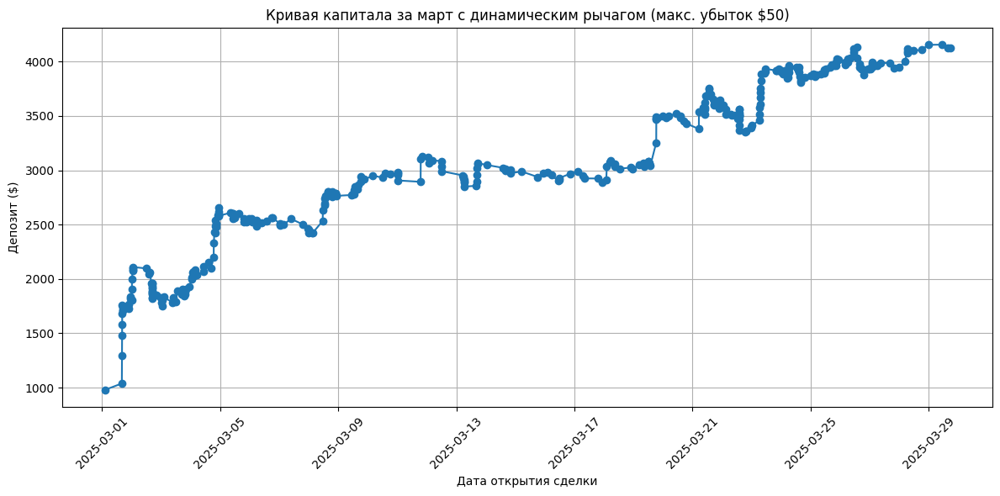


Итоговый депозит за март с динамическим рычагом: $4126.55
Количество ликвидаций: 2

Детали ликвидаций:
Тикер: ALCH, Сторона: SELLING, Цена открытия: 0.0417, Цена ликвидации: 0.0449, Время открытия: 2025-03-02 16:11:26+00:00
Тикер: jellyjelly, Сторона: SELLING, Цена открытия: 0.0277, Цена ликвидации: 0.0295, Время открытия: 2025-03-26 13:43:45+00:00


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов (в процентах)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для симуляции сделки
def simulate_trade(row, stop_loss_dict, investment, max_loss=50, base_leverage=25):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Определяем плечо
    abs_stop_loss = abs(stop_loss)
    if abs_stop_loss > 0.02:  # Если стоп-лосс больше 2% по модулю
        leverage = max_loss / (investment * abs_stop_loss)
        leverage_type = f"Динамическое плечо {leverage:.2f}x"
    else:
        leverage = base_leverage
        leverage_type = f"Фиксированное плечо {leverage:.2f}x"

    liquidation_threshold = 1 / leverage

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 + liquidation_threshold)

    # Выводим информацию
    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f} ({stop_loss*100:.2f}%), "
          f"порог ликвидации {liquidation_price:.4f}, {leverage_type}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
            if low_price <= stop_loss_price:
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False  # Возвращаем точное значение стоп-лосса
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
            if high_price >= stop_loss_price:
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False  # Возвращаем точное значение стоп-лосса
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли с отладочными выводами
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment  # При ликвидации теряем всю инвестицию
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    # Убыток ограничивается $50 только если стоп-лосс > 2% по модулю
    abs_stop_loss = abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))
    if abs_stop_loss > 0.02:
        profit = max(profit, -50)  # Ограничение для динамического плеча
    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
max_loss = 50  # Максимальный убыток $50
base_leverage = 25  # Базовое плечо

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0  # Счетчик ликвидаций
liquidations = []  # Список для хранения деталей ликвидаций

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, max_loss, base_leverage)
        leverage = max_loss / (investment * abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))) if abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0)) > 0.02 else base_leverage
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
            liquidations.append({
                'ticker': row['ticker'],
                'side': row['side'],
                'open_price': row['open_price'],
                'liquidation_price': final_price,
                'open_time': row['open_time']
            })
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с динамическим рычагом (макс. убыток ${max_loss})")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"\nИтоговый депозит за март с динамическим рычагом: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

# Вывод деталей ликвидаций
if liquidations:
    print("\nДетали ликвидаций:")
    for liq in liquidations:
        print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
              f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
              f"Время открытия: {liq['open_time']}")
else:
    print("\nЛиквидаций не произошло.")

In [ ]:
import pandas as pd
import re
import datetime
import pytz

# Определение стоп-лоссов
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Предполагается, что df уже загружен
# df = pd.read_csv('your_data.csv')

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март
df_march = df[df['open_time'].dt.month == 3]

# Функция для проверки срабатывания стоп-лосса
def check_stop_loss(row):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    if side == 'BUYING':
        for candle in all_ochlv:
            low_price = candle['low']
            if (low_price - open_price) / open_price <= stop_loss:
                return True
        return False

    elif side == 'SELLING':
        for candle in all_ochlv:
            high_price = candle['high']
            if (high_price - open_price) / open_price >= stop_loss:
                return True
        return False

# Применение функции к df_march
df_march['stop_loss_triggered'] = df_march.apply(check_stop_loss, axis=1)

# Подсчет количества срабатываний стоп-лосса
stop_loss_count = df_march['stop_loss_triggered'].sum()

print(f"Количество срабатываний стоп-лосса за март: {stop_loss_count}")

Количество срабатываний стоп-лосса за март: 78


<ipython-input-62-debae45b5630>:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_march['stop_loss_triggered'] = df_march.apply(check_stop_loss, axis=1)


**Динамическое плечо к стоплосу**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов (в процентах)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для симуляции сделки
def simulate_trade(row, stop_loss_dict, investment, max_risk=32.5, base_leverage=25):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Рассчитываем плечо
    abs_stop_loss = abs(stop_loss)
    calculated_leverage = max_risk / (investment * abs_stop_loss) if abs_stop_loss != 0 else base_leverage
    leverage = max(int(min(calculated_leverage, base_leverage)), 1)  # Округляем вниз, минимум 1
    stop_loss_in_money = investment * leverage * abs_stop_loss  # Стоп-лосс в деньгах

    liquidation_threshold = 1 / leverage

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 + liquidation_threshold)

    # Выводим информацию с eta_bin
    print(f"\nДля {row['ticker']}, eta_bin: {eta_bin}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f} ({stop_loss*100:.2f}%), "
          f"порог ликвидации {liquidation_price:.4f}, "
          f"Плечо: {leverage}x, Стоп-лосс в деньгах: ${stop_loss_in_money:.2f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            if low_price <= stop_loss_price:  # Сначала проверяем стоп-лосс
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            if high_price >= stop_loss_price:  # Сначала проверяем стоп-лосс
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры (регулируемые)
initial_deposit = 1000
investment = 100
max_risk = 50  # Максимальный риск на сделку
base_leverage = 30  # Стартовое плечо

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0
liquidations = []

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, max_risk, base_leverage)
        leverage = max(int(min(max_risk / (investment * abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))), base_leverage)), 1) if abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0)) != 0 else base_leverage
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
            liquidations.append({
                'ticker': row['ticker'],
                'side': row['side'],
                'open_price': row['open_price'],
                'liquidation_price': final_price,
                'open_time': row['open_time']
            })
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март (макс. риск ${max_risk}, базовое плечо {base_leverage}x)")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"\nИтоговый депозит за март: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

# Вывод деталей ликвидаций
if liquidations:
    print("\nДетали ликвидаций:")
    for liq in liquidations:
        print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
              f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
              f"Время открытия: {liq['open_time']}")
else:
    print("\nЛиквидаций не произошло.")

NameError: name 'df' is not defined


Для JUP, eta_bin: 1.0, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465 (-1.85%), порог ликвидации 0.7324, Плечо: 27x, Стоп-лосс в деньгах: $49.95
Цена ликвидации для BUYING: 0.7324
Свеча low: 0.7588 (отклонение: -0.24%)
Свеча low: 0.7583 (отклонение: -0.30%)
Свеча low: 0.7563 (отклонение: -0.57%)
Свеча low: 0.756 (отклонение: -0.60%)
Свеча low: 0.7553 (отклонение: -0.70%)
Свеча low: 0.7544 (отклонение: -0.82%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7551 (отклонение: -0.72%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7543 (отклонение: -0.83%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7555 (отклонение: -0.67%)
Свеча low: 0.7548 (отклонение: -0.76%)
Свеча low: 0.7545 (отклонение: -0.80%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7541 (отклонение: -0.85%)
Свеча low: 0.7536 (отклонение: -0.92%)
Свеча low: 0.754 (отклонение: -0.87%)
Свеча low: 0.7528 (отклонение: -1.03%)
Свеча low: 0.7527 (отклонение: -1.04%)
Ни стоп-лосс, ни ликвидация не ср

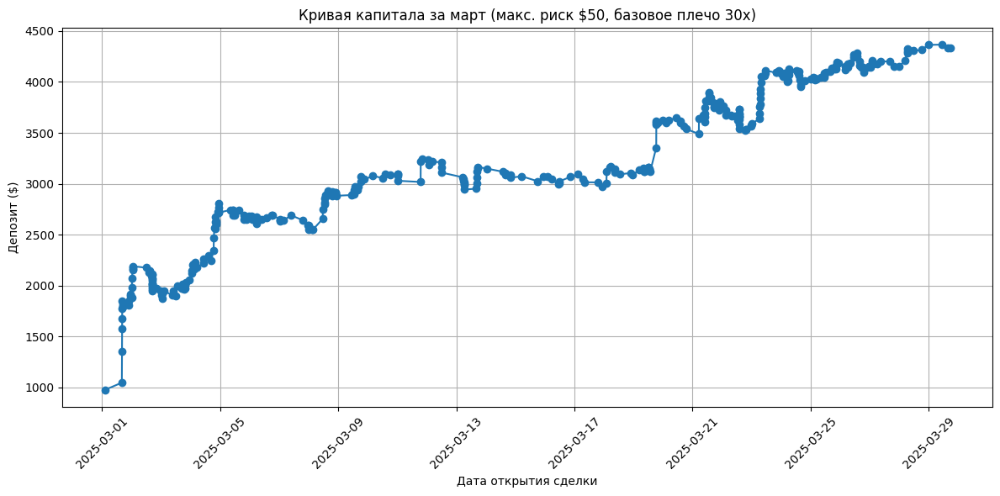


Итоговый депозит за март: $4333.60
Количество ликвидаций: 0

Ликвидаций не произошло.

Метрики стратегии:
Max Drawdown (%): 14.49
Total Return (%): 333.36
Average Profit/Loss per Trade ($): 9.08
Win Rate (%): 53.95
Sharpe Ratio: 0.18


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re
import numpy as np

# Определение стоп-лоссов (в процентах)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для симуляции сделки
def simulate_trade(row, stop_loss_dict, investment, max_risk=32.5, base_leverage=25):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Рассчитываем плечо
    abs_stop_loss = abs(stop_loss)
    calculated_leverage = max_risk / (investment * abs_stop_loss) if abs_stop_loss != 0 else base_leverage
    leverage = max(int(min(calculated_leverage, base_leverage)), 1)  # Округляем вниз, минимум 1
    stop_loss_in_money = investment * leverage * abs_stop_loss  # Стоп-лосс в деньгах

    liquidation_threshold = 1 / leverage

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 + liquidation_threshold)

    # Выводим информацию с eta_bin
    print(f"\nДля {row['ticker']}, eta_bin: {eta_bin}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f} ({stop_loss*100:.2f}%), "
          f"порог ликвидации {liquidation_price:.4f}, "
          f"Плечо: {leverage}x, Стоп-лосс в деньгах: ${stop_loss_in_money:.2f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            if low_price <= stop_loss_price:  # Сначала проверяем стоп-лосс
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            if high_price >= stop_loss_price:  # Сначала проверяем стоп-лосс
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Расчет метрик стратегии
def calculate_metrics(equity_curve, profits):
    # Максимальная просадка
    peak = np.maximum.accumulate(equity_curve)
    drawdowns = (peak - equity_curve) / peak * 100
    max_drawdown = np.max(drawdowns) if len(drawdowns) > 0 else 0

    # Общая доходность
    initial_deposit = equity_curve[0]
    final_deposit = equity_curve[-1]
    total_return = (final_deposit - initial_deposit) / initial_deposit * 100

    # Средняя прибыль/убыток на сделку
    avg_profit_loss = np.mean(profits) if profits else 0

    # Процент прибыльных сделок
    win_rate = (np.sum(np.array(profits) > 0) / len(profits) * 100) if profits else 0

    # Коэффициент Шарпа (упрощённый, без безрисковой ставки)
    returns = np.diff(equity_curve) / equity_curve[:-1]  # Доходность между шагами
    sharpe_ratio = np.mean(returns) / np.std(returns) if np.std(returns) != 0 else 0

    return {
        'Max Drawdown (%)': max_drawdown,
        'Total Return (%)': total_return,
        'Average Profit/Loss per Trade ($)': avg_profit_loss,
        'Win Rate (%)': win_rate,
        'Sharpe Ratio': sharpe_ratio
    }

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Фильтрация данных за март (любой год)
df_march = df[df['open_time'].dt.month == 3]

# Сортировка по времени открытия сделки
df_march = df_march.sort_values(by='open_time')

# Параметры (регулируемые)
initial_deposit = 1000
investment = 100
max_risk = 50  # Максимальный риск на сделку
base_leverage = 30  # Стартовое плечо

# Инициализация депозита и счетчиков
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0
liquidations = []
profits = []  # Список для хранения прибылей/убытков

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, max_risk, base_leverage)
        leverage = max(int(min(max_risk / (investment * abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))), base_leverage)), 1) if abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0)) != 0 else base_leverage
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        profits.append(profit)
        if liquidated:
            liquidation_count += 1
            liquidations.append({
                'ticker': row['ticker'],
                'side': row['side'],
                'open_price': row['open_price'],
                'liquidation_price': final_price,
                'open_time': row['open_time']
            })
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

# Добавляем кривую капитала в DataFrame
df_march['equity_after_trade'] = equity_curve[1:]

# Расчет метрик
metrics = calculate_metrics(equity_curve, profits)

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март (макс. риск ${max_risk}, базовое плечо {base_leverage}x)")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Вывод итогов
print(f"\nИтоговый депозит за март: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

# Вывод деталей ликвидаций
if liquidations:
    print("\nДетали ликвидаций:")
    for liq in liquidations:
        print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
              f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
              f"Время открытия: {liq['open_time']}")
else:
    print("\nЛиквидаций не произошло.")

# Вывод метрик
print("\nМетрики стратегии:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.2f}")

Для всего периода

<ipython-input-152-2b7dd3c668b8>:164: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month'] = df['open_time'].dt.to_period('M')



=== Симуляция для 2024-11 ===

Для CHILLGUY, eta_bin: 0.0, сторона SELLING, цена открытия 0.394, стоп-лосс 0.3981 (1.03%), порог ликвидации 0.4071, Плечо: 30x, Стоп-лосс в деньгах: $30.90
Цена ликвидации для SELLING: 0.4071
Стоп-лосс сработал на 0.3981
Прибыль для CHILLGUY: -30.90 (Ликвидировано: False)

Для GOAT, eta_bin: 0.0, сторона SELLING, цена открытия 0.8161, стоп-лосс 0.8245 (1.03%), порог ликвидации 0.8433, Плечо: 30x, Стоп-лосс в деньгах: $30.90
Цена ликвидации для SELLING: 0.8433
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.8186
Прибыль для GOAT: -9.19 (Ликвидировано: False)

Для Pnut, eta_bin: 1.0, сторона SELLING, цена открытия 1.1462, стоп-лосс 1.1642 (1.57%), порог ликвидации 1.1844, Плечо: 30x, Стоп-лосс в деньгах: $47.10
Цена ликвидации для SELLING: 1.1844
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 1.1475
Прибыль для Pnut: -3.40 (Ликвидировано: False)

Для MOODENG, eta_bin: 0.0, сторона SELLING, цена открытия 0.35615, ст

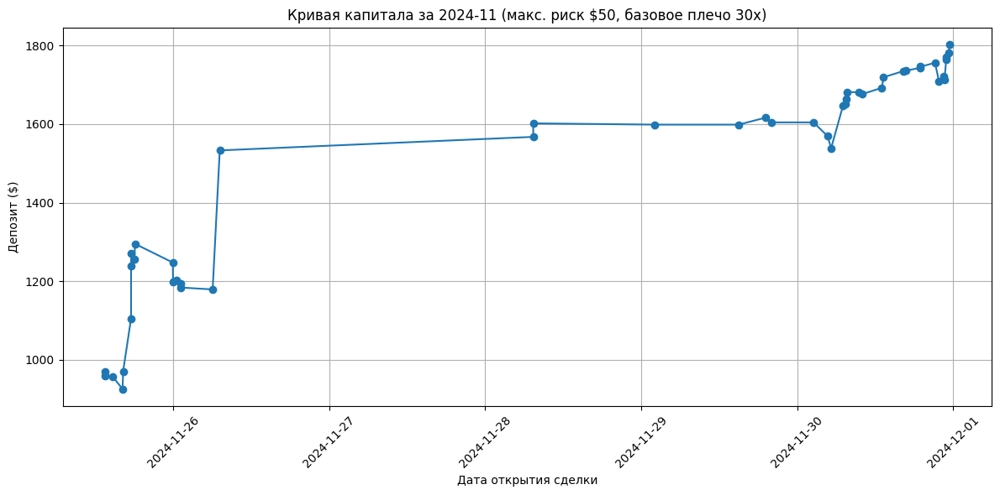

Выходные данные были обрезаны до нескольких последних строк (5000).

Для LUCE, eta_bin: 3.0, сторона SELLING, цена открытия 0.1556, стоп-лосс 0.1613 (3.67%), порог ликвидации 0.1676, Плечо: 13x, Стоп-лосс в деньгах: $47.71
Цена ликвидации для SELLING: 0.1676
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.1501
Прибыль для LUCE: 45.95 (Ликвидировано: False)

Для GRASS, eta_bin: 2.0, сторона BUYING, цена открытия 2.8752, стоп-лосс 2.7887 (-3.01%), порог ликвидации 2.6955, Плечо: 16x, Стоп-лосс в деньгах: $48.16
Цена ликвидации для BUYING: 2.6955
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 2.8892
Прибыль для GRASS: 7.79 (Ликвидировано: False)

Для LUCE, eta_bin: 4.0, сторона SELLING, цена открытия 0.1419, стоп-лосс 0.1494 (5.29%), порог ликвидации 0.1577, Плечо: 9x, Стоп-лосс в деньгах: $47.61
Цена ликвидации для SELLING: 0.1577
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.1417
Прибыль для LUCE: 1.27 (Ликвидировано: False

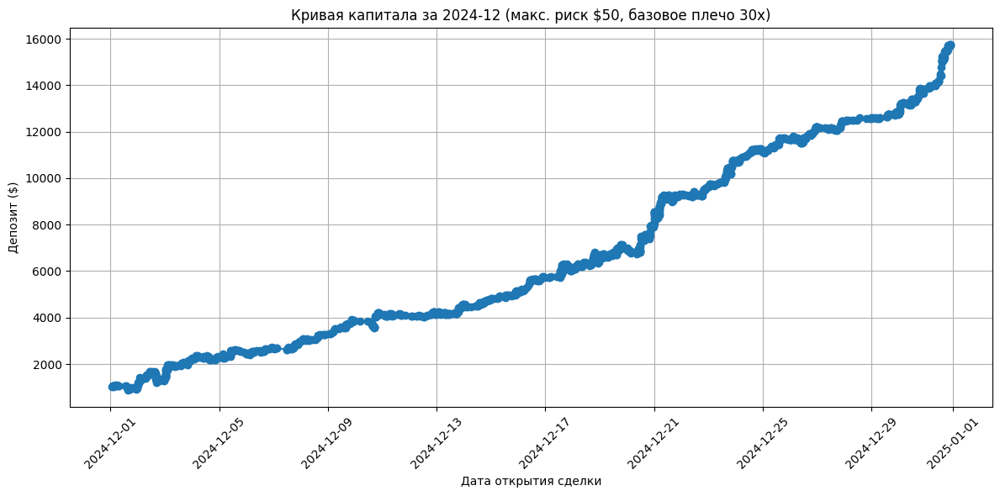

Выходные данные были обрезаны до нескольких последних строк (5000).

Для Fartcoin, eta_bin: 2.0, сторона BUYING, цена открытия 1.5646, стоп-лосс 1.5175 (-3.01%), порог ликвидации 1.4668, Плечо: 16x, Стоп-лосс в деньгах: $48.16
Цена ликвидации для BUYING: 1.4668
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 1.8375
Прибыль для Fartcoin: 279.07 (Ликвидировано: False)

Для MELANIA, eta_bin: 0.0, сторона SELLING, цена открытия 4.116, стоп-лосс 4.1584 (1.03%), порог ликвидации 4.2532, Плечо: 30x, Стоп-лосс в деньгах: $30.90
Цена ликвидации для SELLING: 4.2532
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 4.102
Прибыль для MELANIA: 10.20 (Ликвидировано: False)

Для TRUMP, eta_bin: 2.0, сторона BUYING, цена открытия 38.323, стоп-лосс 37.1695 (-3.01%), порог ликвидации 35.9278, Плечо: 16x, Стоп-лосс в деньгах: $48.16
Цена ликвидации для BUYING: 35.9278
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 39.527
Прибыль для TRUMP: 50.27 (Ли

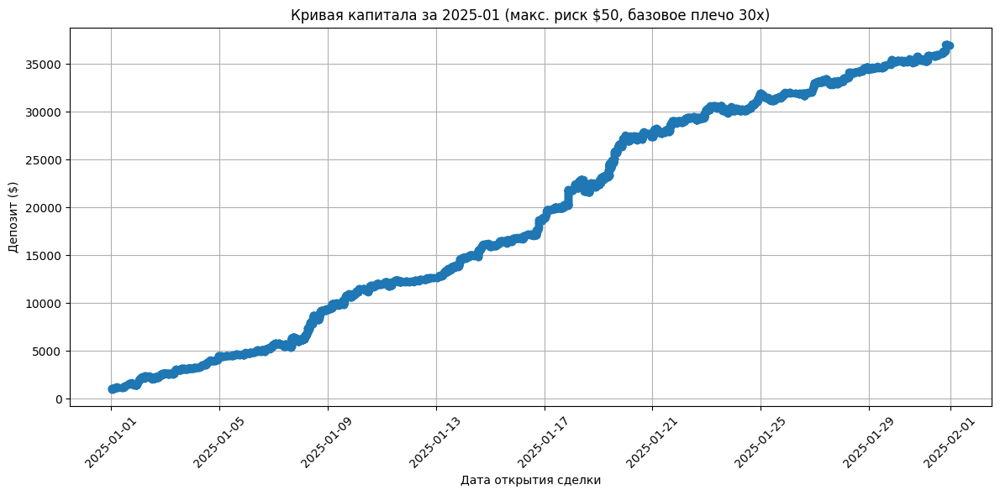


Итоговый депозит за 2025-01: $36957.63
Количество ликвидаций: 0

Ликвидаций не произошло.

Метрики стратегии:
Max Drawdown (%): 14.44
Total Return (%): 3595.76
Average Profit/Loss per Trade ($): 10.54
Win Rate (%): 52.32
Sharpe Ratio: 0.14

=== Симуляция для 2025-02 ===

Для GIGA, eta_bin: 2.0, сторона SELLING, цена открытия 0.06717, стоп-лосс 0.0694 (3.26%), порог ликвидации 0.0716, Плечо: 15x, Стоп-лосс в деньгах: $48.90
Цена ликвидации для SELLING: 0.0716
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.06039
Прибыль для GIGA: 151.41 (Ликвидировано: False)

Для GIGA, eta_bin: 1.0, сторона SELLING, цена открытия 0.06267, стоп-лосс 0.0637 (1.57%), порог ликвидации 0.0648, Плечо: 30x, Стоп-лосс в деньгах: $47.10
Цена ликвидации для SELLING: 0.0648
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.06065
Прибыль для GIGA: 96.70 (Ликвидировано: False)

Для Fartcoin, eta_bin: 1.0, сторона SELLING, цена открытия 0.8895, стоп-лосс 0.9035 (1.57%), порог

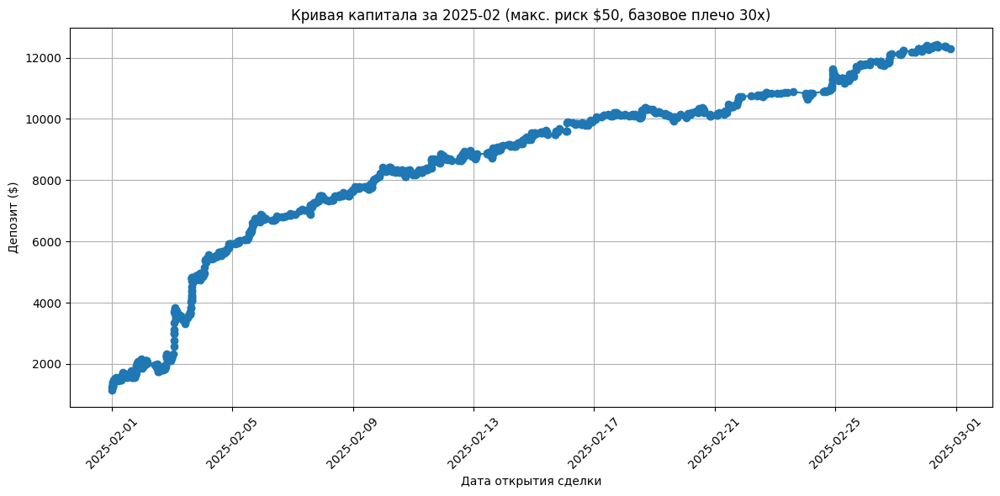


Итоговый депозит за 2025-02: $12285.16
Количество ликвидаций: 0

Ликвидаций не произошло.

Метрики стратегии:
Max Drawdown (%): 19.50
Total Return (%): 1128.52
Average Profit/Loss per Trade ($): 11.98
Win Rate (%): 55.10
Sharpe Ratio: 0.17

=== Симуляция для 2025-03 ===

Для JUP, eta_bin: 1.0, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.7465 (-1.85%), порог ликвидации 0.7324, Плечо: 27x, Стоп-лосс в деньгах: $49.95
Цена ликвидации для BUYING: 0.7324
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.754
Прибыль для JUP: -23.43 (Ликвидировано: False)

Для Fartcoin, eta_bin: 1.0, сторона SELLING, цена открытия 0.2695, стоп-лосс 0.2737 (1.57%), порог ликвидации 0.2785, Плечо: 30x, Стоп-лосс в деньгах: $47.10
Цена ликвидации для SELLING: 0.2785
Ни стоп-лосс, ни ликвидация не сработали, используется close_price 0.2631
Прибыль для Fartcoin: 71.24 (Ликвидировано: False)

Для Fartcoin, eta_bin: 1.0, сторона SELLING, цена открытия 0.2694, стоп-лосс 0.2736 (1.57%), порог

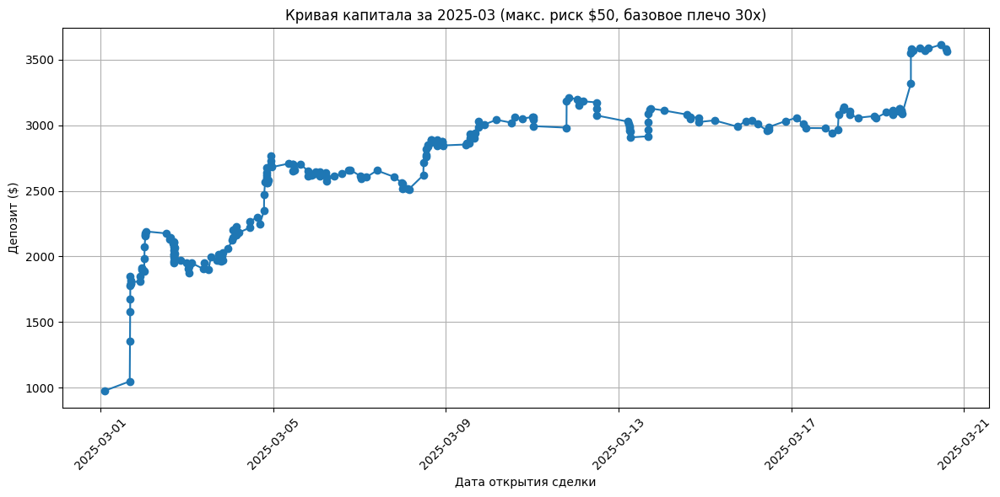


Итоговый депозит за 2025-03: $3563.22
Количество ликвидаций: 0

Ликвидаций не произошло.

Метрики стратегии:
Max Drawdown (%): 14.49
Total Return (%): 256.32
Average Profit/Loss per Trade ($): 11.49
Win Rate (%): 52.47
Sharpe Ratio: 0.21

=== Итоговые результаты по всем месяцам ===
2024-11: Итоговый депозит $1802.64, Total Return: 80.26%, Max Drawdown: 8.97%
2024-12: Итоговый депозит $15736.05, Total Return: 1473.60%, Max Drawdown: 27.65%
2025-01: Итоговый депозит $36957.63, Total Return: 3595.76%, Max Drawdown: 14.44%
2025-02: Итоговый депозит $12285.16, Total Return: 1128.52%, Max Drawdown: 19.50%
2025-03: Итоговый депозит $3563.22, Total Return: 256.32%, Max Drawdown: 14.49%


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re
import numpy as np

# Определение стоп-лоссов (в процентах)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv с обработкой ошибок
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция для симуляции сделки
def simulate_trade(row, stop_loss_dict, investment, max_risk=32.5, base_leverage=25):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Рассчитываем плечо
    abs_stop_loss = abs(stop_loss)
    calculated_leverage = max_risk / (investment * abs_stop_loss) if abs_stop_loss != 0 else base_leverage
    leverage = max(int(min(calculated_leverage, base_leverage)), 1)  # Округляем вниз, минимум 1
    stop_loss_in_money = investment * leverage * abs_stop_loss  # Стоп-лосс в деньгах

    liquidation_threshold = 1 / leverage

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 + liquidation_threshold)

    # Выводим информацию с eta_bin
    print(f"\nДля {row['ticker']}, eta_bin: {eta_bin}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f} ({stop_loss*100:.2f}%), "
          f"порог ликвидации {liquidation_price:.4f}, "
          f"Плечо: {leverage}x, Стоп-лосс в деньгах: ${stop_loss_in_money:.2f}")

    if side == 'BUYING':
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            #print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%)")
            if low_price <= stop_loss_price:  # Сначала проверяем стоп-лосс
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            #print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%)")
            if high_price >= stop_loss_price:  # Сначала проверяем стоп-лосс
                print(f"Стоп-лосс сработал на {stop_loss_price:.4f}")
                return stop_loss_price, False
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
        print(f"Ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Расчет прибыли
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Расчет метрик стратегии
def calculate_metrics(equity_curve, profits):
    # Максимальная просадка
    peak = np.maximum.accumulate(equity_curve)
    drawdowns = (peak - equity_curve) / peak * 100
    max_drawdown = np.max(drawdowns) if len(drawdowns) > 0 else 0

    # Общая доходность
    initial_deposit = equity_curve[0]
    final_deposit = equity_curve[-1]
    total_return = (final_deposit - initial_deposit) / initial_deposit * 100

    # Средняя прибыль/убыток на сделку
    avg_profit_loss = np.mean(profits) if profits else 0

    # Процент прибыльных сделок
    win_rate = (np.sum(np.array(profits) > 0) / len(profits) * 100) if profits else 0

    # Коэффициент Шарпа (упрощённый, без безрисковой ставки)
    returns = np.diff(equity_curve) / equity_curve[:-1]  # Доходность между шагами
    sharpe_ratio = np.mean(returns) / np.std(returns) if np.std(returns) != 0 else 0

    return {
        'Max Drawdown (%)': max_drawdown,
        'Total Return (%)': total_return,
        'Average Profit/Loss per Trade ($)': avg_profit_loss,
        'Win Rate (%)': win_rate,
        'Sharpe Ratio': sharpe_ratio
    }

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)

# Преобразование open_time в datetime
df['open_time'] = pd.to_datetime(df['open_time'])

# Сортировка по времени открытия сделки
df = df.sort_values(by='open_time')

# Параметры (регулируемые)
initial_deposit = 1000
investment = 100
max_risk = 50  # Максимальный риск на сделку
base_leverage = 30  # Стартовое плечо

# Получаем уникальные месяцы
df['month'] = df['open_time'].dt.to_period('M')
months = df['month'].unique()

# Словарь для хранения результатов по месяцам
monthly_results = {}

# Симуляция по всем месяцам
for month in months:
    print(f"\n=== Симуляция для {month} ===")
    df_month = df[df['month'] == month].copy()

    # Инициализация депозита и счетчиков для текущего месяца
    deposit = initial_deposit
    equity_curve = [initial_deposit]
    liquidation_count = 0
    liquidations = []
    profits = []

    # Симуляция сделок
    for index, row in df_month.iterrows():
        if deposit >= investment:
            final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, max_risk, base_leverage)
            leverage = max(int(min(max_risk / (investment * abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))), base_leverage)), 1) if abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0)) != 0 else base_leverage
            profit = calculate_profit(row, final_price, leverage, investment, liquidated)
            deposit += profit
            profits.append(profit)
            if liquidated:
                liquidation_count += 1
                liquidations.append({
                    'ticker': row['ticker'],
                    'side': row['side'],
                    'open_price': row['open_price'],
                    'liquidation_price': final_price,
                    'open_time': row['open_time']
                })
            equity_curve.append(deposit)
        else:
            print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
            equity_curve.append(deposit)

    # Добавляем кривую капитала в DataFrame месяца
    df_month['equity_after_trade'] = equity_curve[1:]

    # Расчет метрик
    metrics = calculate_metrics(equity_curve, profits)

    # Сохранение результатов
    monthly_results[month] = {
        'df': df_month,
        'final_deposit': deposit,
        'liquidation_count': liquidation_count,
        'liquidations': liquidations,
        'metrics': metrics
    }

    # Построение графика
    plt.figure(figsize=(12, 6))
    plt.plot(df_month['open_time'], df_month['equity_after_trade'], marker='o', linestyle='-')
    plt.title(f"Кривая капитала за {month} (макс. риск ${max_risk}, базовое плечо {base_leverage}x)")
    plt.xlabel("Дата открытия сделки")
    plt.ylabel("Депозит ($)")
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Вывод итогов
    print(f"\nИтоговый депозит за {month}: ${deposit:.2f}")
    print(f"Количество ликвидаций: {liquidation_count}")

    # Вывод деталей ликвидаций
    if liquidations:
        print("\nДетали ликвидаций:")
        for liq in liquidations:
            print(f"Тикер: {liq['ticker']}, Сторона: {liq['side']}, "
                  f"Цена открытия: {liq['open_price']:.4f}, Цена ликвидации: {liq['liquidation_price']:.4f}, "
                  f"Время открытия: {liq['open_time']}")
    else:
        print("\nЛиквидаций не произошло.")

    # Вывод метрик
    print("\nМетрики стратегии:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.2f}")

# Итоговый вывод по всем месяцам
print("\n=== Итоговые результаты по всем месяцам ===")
for month, result in monthly_results.items():
    print(f"{month}: Итоговый депозит ${result['final_deposit']:.2f}, "
          f"Total Return: {result['metrics']['Total Return (%)']:.2f}%, "
          f"Max Drawdown: {result['metrics']['Max Drawdown (%)']:.2f}%")

In [ ]:
def simulate_trade(row, stop_loss_dict):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    if side == 'BUYING':
        for candle in all_ochlv:
            low_price = candle['low']
            if (low_price - open_price) / open_price <= stop_loss:
                print(f"Стоп-лосс сработал для {row['ticker']}: final_price={low_price}")
                return low_price
        print(f"Стоп-лосс не сработал для {row['ticker']}: final_price={row['close_price']}")
        return row['close_price']

    elif side == 'SELLING':
        for candle in all_ochlv:
            high_price = candle['high']
            if (high_price - open_price) / open_price >= stop_loss:
                print(f"Стоп-лосс сработал для {row['ticker']}: final_price={high_price}")
                return high_price
        print(f"Стоп-лосс не сработал для {row['ticker']}: final_price={row['close_price']}")
        return row['close_price']

# В цикле симуляции:
for index, row in df.iterrows():
    if deposit >= investment:
        final_price = simulate_trade(row, stop_loss_dict)
        profit = calculate_profit(row, final_price, leverage=15, investment=investment)
        print(f"Прибыль для {row['ticker']}: {profit:.2f}, Депозит: {deposit:.2f}")
        deposit += profit
        equity_curve.append(deposit)
    else:
        equity_curve.append(deposit)

Стоп-лосс сработал для CHILLGUY: final_price=0.3996


TypeError: calculate_profit() missing 1 required positional argument: 'liquidated'

In [ ]:
import pandas as pd

def convert_eta_to_minutes(value):
    total_minutes = 0
    # Если есть часы
    if 'h' in value:
        hours = float(value.split('h')[0])  # Используем float для значений с плавающей точкой
        total_minutes += hours * 60
    # Если есть минуты
    if 'm' in value:
        minutes = float(value.split('m')[0].split()[-1])  # Убираем все лишние пробелы и знаки
        total_minutes += minutes
    return total_minutes


df['eta'] = df['eta'].apply(convert_eta_to_minutes)
print(df.head(10))


        ticker  amount_usd     side  potential_price_change     mcap liquidity      vol_24h  \
3251     TRUMP   1000000.0   BUYING                    9.14    6.84B   665.23M  156110000.0   
3250     TRUMP    347160.0   BUYING                    3.28    6.98B   670.26M  152920000.0   
3249     TRUMP    500050.0   BUYING                    4.47    6.98B   670.26M  152920000.0   
3248  Fartcoin    500050.0   BUYING                    2.78    1.46B    26.68M  102420000.0   
3247       AVA    143370.0  SELLING                   -4.73  159.39M     5.32M   19490000.0   
3243       AVA    122240.0  SELLING                   -3.80  152.88M     5.20M   19520000.0   
3239  Fartcoin    100010.0   BUYING                    0.54    1.45B    26.76M   93410000.0   
3238    swarms     78340.0  SELLING                   -2.01  129.43M     7.29M   29590000.0   
3237    swarms     78340.0  SELLING                   -2.05  129.43M     7.29M   29590000.0   
3231     TRUMP    243980.0  SELLING               

In [ ]:
df.head(10)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win,profit,equity_after_trade
3251,TRUMP,1000000.0,BUYING,9.14,6.84B,665.23M,156110000.0,3.02M,200.03K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 06:45:25+00:00,2025-01-24 06:50:25+00:00,200.03K,1 min,34.4850,34.74300,"[{'timestamp': 2025-01-24 06:46:00+00:00, 'ope...",0.748151,win,1,2025-01-24,Friday,2025-01,2025-01-24 06:45:25+00:00,2025-01-24,1,0.748151,1000.748151
3250,TRUMP,347160.0,BUYING,3.28,6.98B,670.26M,152920000.0,1.14M,69.43K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:13:49+00:00,2025-01-24 07:18:49+00:00,69.43K,1 min,34.3650,34.44700,"[{'timestamp': 2025-01-24 07:14:00+00:00, 'ope...",0.238615,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:13:49+00:00,2025-01-24,1,0.238615,1000.986766
3249,TRUMP,500050.0,BUYING,4.47,6.98B,670.26M,152920000.0,1.14M,100.01K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:14:18+00:00,2025-01-24 07:19:18+00:00,100.01K,1 min,34.3690,34.46200,"[{'timestamp': 2025-01-24 07:15:00+00:00, 'ope...",0.270593,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:14:18+00:00,2025-01-24,1,0.270593,1001.257359
3248,Fartcoin,500050.0,BUYING,2.78,1.46B,26.68M,102420000.0,1.75M,50.01K every 1min,10.0,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 07:14:53+00:00,2025-01-24 07:24:53+00:00,50.01K,1 min,1.4297,1.41420,"[{'timestamp': 2025-01-24 07:15:00+00:00, 'ope...",-1.084144,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:14:53+00:00,2025-01-24,0,-1.084144,1000.173215
3247,AVA,143370.0,SELLING,-4.73,159.39M,5.32M,19490000.0,362.04K,716.85 every 1min,180.0,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 07:20:51+00:00,2025-01-24 10:40:51+00:00,716.85,1 min,0.9350,0.93950,"[{'timestamp': 2025-01-24 07:21:00+00:00, 'ope...",0.481283,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:20:51+00:00,2025-01-24,0,-0.481283,999.691932
3243,AVA,122240.0,SELLING,-3.80,152.88M,5.20M,19520000.0,579.48K,12.22K every 1min,10.0,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 08:11:43+00:00,2025-01-24 08:21:43+00:00,12.22K,1 min,0.9329,0.93680,"[{'timestamp': 2025-01-24 08:12:00+00:00, 'ope...",0.418051,loss,0,2025-01-24,Friday,2025-01,2025-01-24 08:11:43+00:00,2025-01-24,0,-0.418051,999.273881
3239,Fartcoin,100010.0,BUYING,0.54,1.45B,26.76M,93410000.0,1.10M,2.27K every 1min,44.0,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 08:58:59+00:00,2025-01-24 09:42:59+00:00,2.27K,1 min,1.4484,1.39450,"[{'timestamp': 2025-01-24 08:59:00+00:00, 'ope...",-3.721348,loss,0,2025-01-24,Friday,2025-01,2025-01-24 08:58:59+00:00,2025-01-24,0,-3.721348,995.552533
3238,swarms,78340.0,SELLING,-2.01,129.43M,7.29M,29590000.0,721.07K,5.22K every 1min,15.0,mexc bitget gate,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-01-24 09:29:49+00:00,2025-01-24 09:44:49+00:00,5.22K,1 min,0.1294,0.12972,"[{'timestamp': 2025-01-24 09:30:00+00:00, 'ope...",0.247295,loss,0,2025-01-24,Friday,2025-01,2025-01-24 09:29:49+00:00,2025-01-24,0,-0.247295,995.305238
3237,swarms,78340.0,SELLING,-2.05,129.43M,7.29M,29590000.0,721.07K,5.22K every 1min,15.0,mexc bitget gate,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-01-24 09:29:59+00:00,2025-01-24 09:44:59+00:00,5.22K,1 min,0.1294,0.12972,"[{'timestamp': 2025-01-24 09:30:00+00:00, 'ope...",0.247295,loss,0,2025-01-24,Friday,2025-01,2025-01-24 09:29:59+00:00,2025-01-24,0,-0.247295,995.057943
3231,TRUMP,243980.0,SELLING,-0.47,6.77B,662.90M,160870000.0,9.87M,48.80K every 1min,5.0,mexc b

In [ ]:
# Группируем данные по результату и вычисляем средние значения
result_stats = df.groupby('result')[['potential_price_change', 'eta', 'amount_usd']].mean()

print(result_stats)

        potential_price_change        eta     amount_usd
result                                                  
loss                  0.611580  38.029178  272961.671088
win                  -0.320179  41.745951  306295.771526


Получааем бины на ETA

In [ ]:
import numpy as np
import pandas as pd

bins = [1, 10, 30, 70, 150, 300, 500]


# Применяем pd.cut с новыми бинами
df['eta_bin'] = pd.cut(df['eta'], bins=bins, labels=False)



print("\nГраницы бинов:", bins)


Границы бинов: [1, 10, 30, 70, 150, 300, 500]


In [ ]:
df.head(10)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win,profit,equity_after_trade,eta_bin
3251,TRUMP,1000000.0,BUYING,9.14,6.84B,665.23M,156110000.0,3.02M,200.03K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 06:45:25+00:00,2025-01-24 06:50:25+00:00,200.03K,1 min,34.4850,34.74300,"[{'timestamp': 2025-01-24 06:46:00+00:00, 'ope...",0.748151,win,1,2025-01-24,Friday,2025-01,2025-01-24 06:45:25+00:00,2025-01-24,1,0.748151,1000.748151,0.0
3250,TRUMP,347160.0,BUYING,3.28,6.98B,670.26M,152920000.0,1.14M,69.43K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:13:49+00:00,2025-01-24 07:18:49+00:00,69.43K,1 min,34.3650,34.44700,"[{'timestamp': 2025-01-24 07:14:00+00:00, 'ope...",0.238615,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:13:49+00:00,2025-01-24,1,0.238615,1000.986766,0.0
3249,TRUMP,500050.0,BUYING,4.47,6.98B,670.26M,152920000.0,1.14M,100.01K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:14:18+00:00,2025-01-24 07:19:18+00:00,100.01K,1 min,34.3690,34.46200,"[{'timestamp': 2025-01-24 07:15:00+00:00, 'ope...",0.270593,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:14:18+00:00,2025-01-24,1,0.270593,1001.257359,0.0
3248,Fartcoin,500050.0,BUYING,2.78,1.46B,26.68M,102420000.0,1.75M,50.01K every 1min,10.0,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 07:14:53+00:00,2025-01-24 07:24:53+00:00,50.01K,1 min,1.4297,1.41420,"[{'timestamp': 2025-01-24 07:15:00+00:00, 'ope...",-1.084144,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:14:53+00:00,2025-01-24,0,-1.084144,1000.173215,0.0
3247,AVA,143370.0,SELLING,-4.73,159.39M,5.32M,19490000.0,362.04K,716.85 every 1min,180.0,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 07:20:51+00:00,2025-01-24 10:40:51+00:00,716.85,1 min,0.9350,0.93950,"[{'timestamp': 2025-01-24 07:21:00+00:00, 'ope...",0.481283,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:20:51+00:00,2025-01-24,0,-0.481283,999.691932,4.0
3243,AVA,122240.0,SELLING,-3.80,152.88M,5.20M,19520000.0,579.48K,12.22K every 1min,10.0,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 08:11:43+00:00,2025-01-24 08:21:43+00:00,12.22K,1 min,0.9329,0.93680,"[{'timestamp': 2025-01-24 08:12:00+00:00, 'ope...",0.418051,loss,0,2025-01-24,Friday,2025-01,2025-01-24 08:11:43+00:00,2025-01-24,0,-0.418051,999.273881,0.0
3239,Fartcoin,100010.0,BUYING,0.54,1.45B,26.76M,93410000.0,1.10M,2.27K every 1min,44.0,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 08:58:59+00:00,2025-01-24 09:42:59+00:00,2.27K,1 min,1.4484,1.39450,"[{'timestamp': 2025-01-24 08:59:00+00:00, 'ope...",-3.721348,loss,0,2025-01-24,Friday,2025-01,2025-01-24 08:58:59+00:00,2025-01-24,0,-3.721348,995.552533,2.0
3238,swarms,78340.0,SELLING,-2.01,129.43M,7.29M,29590000.0,721.07K,5.22K every 1min,15.0,mexc bitget gate,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-01-24 09:29:49+00:00,2025-01-24 09:44:49+00:00,5.22K,1 min,0.1294,0.12972,"[{'timestamp': 2025-01-24 09:30:00+00:00, 'ope...",0.247295,loss,0,2025-01-24,Friday,2025-01,2025-01-24 09:29:49+00:00,2025-01-24,0,-0.247295,995.305238,1.0
3237,swarms,78340.0,SELLING,-2.05,129.43M,7.29M,29590000.0,721.07K,5.22K every 1min,15.0,mexc bitget gate,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-01-24 09:29:59+00:00,2025-01-24 09:44:59+00:00,5.22K,1 min,0.1294,0.12972,"[{'timestamp': 2025-01-24 09:30:00+00:00, 'ope...",0.247295,loss,0,2025-01-24,Friday,2025-01,2025-01-24 09:29:59+00:00,2025-01-24,0,-0.247295,995.057943,1.0
3231,TRUMP,243980.0,SELLING,-0.47,6.77B,662.90M,16

Получаем самые профитные бины

In [ ]:
# Считаем количество побед и поражений в каждом бине
bin_counts = df.groupby('eta_bin')['win'].agg(win_count='sum', loss_count=lambda x: (x == 0).sum())

# Выводим результат
print(bin_counts.reset_index())

# Выводим границы бинов
print("\nГраницы бинов:", bins)


   eta_bin  win_count  loss_count
0      0.0        356         244
1      1.0        360         240
2      2.0        312         197
3      3.0         73          41
4      4.0         68          29
5      5.0          0           1

Границы бинов: [1, 10, 30, 70, 150, 300, 500]


ta_bin	win_count	loss_count	winrate (%)
4	233	137	62.97%
3	245	147	62.50%
1	1018	644	61.23%
0	1012	648	60.96%
2	983	661	59.81%
5	1	2	33.33%

---

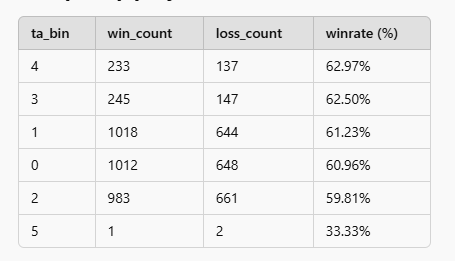

In [ ]:
print(df.loc[0, 'all_ochlv'])  # Выведет содержимое первой строки


[{'timestamp': datetime.datetime(2025, 3, 29, 17, 22, tzinfo=<UTC>), 'open': 0.05122, 'high': 0.05122, 'low': 0.05084, 'close': 0.05106, 'volume': 598000.0}, {'timestamp': datetime.datetime(2025, 3, 29, 17, 23, tzinfo=<UTC>), 'open': 0.05106, 'high': 0.05106, 'low': 0.05091, 'close': 0.05099, 'volume': 108970.0}, {'timestamp': datetime.datetime(2025, 3, 29, 17, 24, tzinfo=<UTC>), 'open': 0.05099, 'high': 0.05109, 'low': 0.05098, 'close': 0.05105, 'volume': 37140.0}, {'timestamp': datetime.datetime(2025, 3, 29, 17, 25, tzinfo=<UTC>), 'open': 0.05105, 'high': 0.05119, 'low': 0.05098, 'close': 0.05115, 'volume': 50810.0}, {'timestamp': datetime.datetime(2025, 3, 29, 17, 26, tzinfo=<UTC>), 'open': 0.05115, 'high': 0.05141, 'low': 0.05114, 'close': 0.05135, 'volume': 68770.0}, {'timestamp': datetime.datetime(2025, 3, 29, 17, 27, tzinfo=<UTC>), 'open': 0.05135, 'high': 0.05142, 'low': 0.05133, 'close': 0.0514, 'volume': 41100.0}, {'timestamp': datetime.datetime(2025, 3, 29, 17, 28, tzinfo=<U

In [ ]:
data = df.copy()

In [ ]:
import ast
import re

# Извлекаем all_ochlv для первой строки
first_row_all_ochlv = data.iloc[0]['all_ochlv']

# Проверяем тип и содержимое для отладки
print("Тип first_row_all_ochlv:", type(first_row_all_ochlv))
print("Содержимое first_row_all_ochlv:", first_row_all_ochlv)

# Если это строка, парсим её в список словарей
if isinstance(first_row_all_ochlv, str):
    try:
        # Заменяем datetime.datetime на строку
        # Используем регулярное выражение для замены datetime
        processed_str = re.sub(
            r"datetime\.datetime\((\d{4}), (\d{1,2}), (\d{1,2}), (\d{1,2}), (\d{1,2}), tzinfo=<UTC>\)",
            r"'\\1-\\2-\\3T\\4:\\5:00+00:00'",
            first_row_all_ochlv
        )
        # Заменяем tzinfo=<UTC> на строку
        processed_str = processed_str.replace("tzinfo=<UTC>", "tzinfo='UTC'")
        # Парсим строку в список словарей
        candles = ast.literal_eval(processed_str)
    except (SyntaxError, ValueError) as e:
        print("Ошибка при парсинге с ast.literal_eval:", e)
        candles = []
else:
    candles = first_row_all_ochlv

# Извлекаем все значения 'low' из списка словарей
low_values = [candle['low'] for candle in candles if isinstance(candle, dict) and 'low' in candle]

# Выводим значения на экран
print("Все значения 'low':", low_values)

Тип first_row_all_ochlv: <class 'list'>
Содержимое first_row_all_ochlv: [{'timestamp': datetime.datetime(2025, 1, 24, 6, 46, tzinfo=<UTC>), 'open': 34.485, 'high': 34.555, 'low': 34.468, 'close': 34.549, 'volume': 15271.2}, {'timestamp': datetime.datetime(2025, 1, 24, 6, 47, tzinfo=<UTC>), 'open': 34.549, 'high': 34.746, 'low': 34.542, 'close': 34.719, 'volume': 65163.0}, {'timestamp': datetime.datetime(2025, 1, 24, 6, 48, tzinfo=<UTC>), 'open': 34.719, 'high': 34.726, 'low': 34.6, 'close': 34.64, 'volume': 13381.2}, {'timestamp': datetime.datetime(2025, 1, 24, 6, 49, tzinfo=<UTC>), 'open': 34.64, 'high': 34.745, 'low': 34.633, 'close': 34.712, 'volume': 17564.1}, {'timestamp': datetime.datetime(2025, 1, 24, 6, 50, tzinfo=<UTC>), 'open': 34.712, 'high': 34.748, 'low': 34.669, 'close': 34.743, 'volume': 6185.1}]
Все значения 'low': [34.468, 34.542, 34.6, 34.633, 34.669]


получение min и max за периоды

In [ ]:
import re
import ast
import pandas as pd

# Define a pattern to match datetime objects
pattern = r"datetime\s*(\.|)\s*datetime\((\d{4}), (\d{1,2}), (\d{1,2}), (\d{1,2}), (\d{1,2}), tzinfo=<UTC>\)"

# Function to replace datetime objects with their string representations
def replace_datetime(match):
    year, month, day, hour, minute = map(int, match.groups()[1:])
    return f'"{year}-{month:02d}-{day:02d}T{hour:02d}:{minute:02d}:00+00:00"'

# Function to parse all_ochlv string
def parse_all_ochlv(all_ochlv_str):
    if not isinstance(all_ochlv_str, str):
        return []
    try:
        processed_str = re.sub(pattern, replace_datetime, all_ochlv_str)
        return ast.literal_eval(processed_str)
    except (SyntaxError, ValueError) as e:
        print(f"Error parsing all_ochlv: {e}")
        return []

# Function to extract min and max percentage difference relative to open price
def calculate_min_max_pct(all_ochlv_str):
    candles = parse_all_ochlv(all_ochlv_str)
    if not isinstance(candles, list) or len(candles) == 0:
        return None, None

    try:
        min_low = min(candle['low'] for candle in candles if isinstance(candle, dict) and 'low' in candle)
        max_high = max(candle['high'] for candle in candles if isinstance(candle, dict) and 'high' in candle)
        open_price = candles[0]['open'] if 'open' in candles[0] else None

        if open_price:
            min_pct = ((min_low - open_price) / open_price) * 100
            max_pct = ((max_high - open_price) / open_price) * 100
            return min_pct, max_pct
    except Exception as e:
        print(f"Error computing min/max: {e}")

    return None, None

# Assuming df is your DataFrame
# Apply the function to create new columns
data = df.copy()
data[['min_pct', 'max_pct']] = data['all_ochlv'].apply(lambda x: pd.Series(calculate_min_max_pct(x)))

# Print the updated DataFrame
print(data.head())


        ticker  amount_usd     side  potential_price_change     mcap liquidity      vol_24h  \
3251     TRUMP   1000000.0   BUYING                    9.14    6.84B   665.23M  156110000.0   
3250     TRUMP    347160.0   BUYING                    3.28    6.98B   670.26M  152920000.0   
3249     TRUMP    500050.0   BUYING                    4.47    6.98B   670.26M  152920000.0   
3248  Fartcoin    500050.0   BUYING                    2.78    1.46B    26.68M  102420000.0   
3247       AVA    143370.0  SELLING                   -4.73  159.39M     5.32M   19490000.0   

       vol_1h           frequency    eta           futures  \
3251    3.02M  200.03K every 1min    5.0  mexc bitget gate   
3250    1.14M   69.43K every 1min    5.0  mexc bitget gate   
3249    1.14M  100.01K every 1min    5.0  mexc bitget gate   
3248    1.75M   50.01K every 1min   10.0       mexc bitget   
3247  362.04K   716.85 every 1min  180.0  mexc bitget gate   

                                                ca  user

In [ ]:
data.head()

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win,profit,equity_after_trade,eta_bin,min_pct,max_pct
3251,TRUMP,1000000.0,BUYING,9.14,6.84B,665.23M,156110000.0,3.02M,200.03K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 06:45:25+00:00,2025-01-24 06:50:25+00:00,200.03K,1 min,34.4850,34.7430,"[{'timestamp': 2025-01-24 06:46:00+00:00, 'ope...",0.748151,win,1,2025-01-24,Friday,2025-01,2025-01-24 06:45:25+00:00,2025-01-24,1,0.748151,1000.748151,0.0,None,None
3250,TRUMP,347160.0,BUYING,3.28,6.98B,670.26M,152920000.0,1.14M,69.43K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:13:49+00:00,2025-01-24 07:18:49+00:00,69.43K,1 min,34.3650,34.4470,"[{'timestamp': 2025-01-24 07:14:00+00:00, 'ope...",0.238615,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:13:49+00:00,2025-01-24,1,0.238615,1000.986766,0.0,None,None
3249,TRUMP,500050.0,BUYING,4.47,6.98B,670.26M,152920000.0,1.14M,100.01K every 1min,5.0,mexc bitget gate,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,NaN,NaN,NaN,NaN,2025-01-24 07:14:18+00:00,2025-01-24 07:19:18+00:00,100.01K,1 min,34.3690,34.4620,"[{'timestamp': 2025-01-24 07:15:00+00:00, 'ope...",0.270593,win,1,2025-01-24,Friday,2025-01,2025-01-24 07:14:18+00:00,2025-01-24,1,0.270593,1001.257359,0.0,None,None
3248,Fartcoin,500050.0,BUYING,2.78,1.46B,26.68M,102420000.0,1.75M,50.01K every 1min,10.0,mexc bitget,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-01-24 07:14:53+00:00,2025-01-24 07:24:53+00:00,50.01K,1 min,1.4297,1.4142,"[{'timestamp': 2025-01-24 07:15:00+00:00, 'ope...",-1.084144,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:14:53+00:00,2025-01-24,0,-1.084144,1000.173215,0.0,None,None
3247,AVA,143370.0,SELLING,-4.73,159.39M,5.32M,19490000.0,362.04K,716.85 every 1min,180.0,mexc bitget gate,DKu9kykSfbN5LBfFXtNNDPaX35o4Fv6vJ9FKk7pZpump,NaN,NaN,NaN,NaN,2025-01-24 07:20:51+00:00,2025-01-24 10:40:51+00:00,716.85,1 min,0.9350,0.9395,"[{'timestamp': 2025-01-24 07:21:00+00:00, 'ope...",0.481283,loss,0,2025-01-24,Friday,2025-01,2025-01-24 07:20:51+00:00,2025-01-24,0,-0.481283,999.691932,4.0,None,None


In [ ]:
import pandas as pd
import numpy as np



# Убедимся, что min_pct и max_pct - это числа
data["min_pct"] = pd.to_numeric(data["min_pct"], errors="coerce")
data["max_pct"] = pd.to_numeric(data["max_pct"], errors="coerce")

# Определяем бины
min_bins = np.arange(-45, 1, 1)   # От -45% до 0%
max_bins = np.arange(0, 111, 1)   # От 0% до 110% (с запасом)

# Подписи для бинов
min_labels = [f"{i}-{i+1}%" for i in min_bins[:-1]]
max_labels = [f"{i}-{i+1}%" for i in max_bins[:-1]]

# Разбиваем значения на категории
data["min_bin"] = pd.cut(data["min_pct"], bins=min_bins, labels=min_labels, include_lowest=True)
data["max_bin"] = pd.cut(data["max_pct"], bins=max_bins, labels=max_labels, include_lowest=True)

# Считаем количество значений в каждом бине
min_bin_counts = data["min_bin"].value_counts().sort_index()
max_bin_counts = data["max_bin"].value_counts().sort_index()

# Объединяем результаты
result = pd.DataFrame({"min_count": min_bin_counts, "max_count": max_bin_counts}).fillna(0)

# Вывод результата
print(result)


          min_count  max_count
-1-0%           0.0        0.0
-10--9%         0.0        0.0
-11--10%        0.0        0.0
-12--11%        0.0        0.0
-13--12%        0.0        0.0
-14--13%        0.0        0.0
-15--14%        0.0        0.0
-16--15%        0.0        0.0
-17--16%        0.0        0.0
-18--17%        0.0        0.0
-19--18%        0.0        0.0
-2--1%          0.0        0.0
-20--19%        0.0        0.0
-21--20%        0.0        0.0
-22--21%        0.0        0.0
-23--22%        0.0        0.0
-24--23%        0.0        0.0
-25--24%        0.0        0.0
-26--25%        0.0        0.0
-27--26%        0.0        0.0
-28--27%        0.0        0.0
-29--28%        0.0        0.0
-3--2%          0.0        0.0
-30--29%        0.0        0.0
-31--30%        0.0        0.0
-32--31%        0.0        0.0
-33--32%        0.0        0.0
-34--33%        0.0        0.0
-35--34%        0.0        0.0
-36--35%        0.0        0.0
-37--36%        0.0        0.0
-38--37%

Более хороший вариант разбиения

In [ ]:
import pandas as pd
import numpy as np

# Убедимся, что min_pct и max_pct - это числа
data["min_pct"] = pd.to_numeric(data["min_pct"], errors="coerce")
data["max_pct"] = pd.to_numeric(data["max_pct"], errors="coerce")

# Определяем бины
min_bins = np.concatenate([
    np.arange(-50, -5, 5),    # От -50% до -10% с шагом 5%: [-50, -45, ..., -10]
    np.arange(-5, 1, 1)       # От -5% до 0% с шагом 1%: [-5, -4, ..., 0]
])
max_bins = np.concatenate([
    np.arange(0, 5, 1),       # От 0% до 4% с шагом 1%: [0, 1, 2, 3, 4]
    np.arange(5, 51, 5)       # От 5% до 50% с шагом 5%: [5, 10, ..., 50]
])

# Подписи для бинов
min_labels = [f"{i}-{(i+5)}%" if i < -5 else f"{i}-{(i+1)}%" for i in min_bins[:-1]]
max_labels = [f"{i}-{(i+1)}%" if i < 5 else f"{i}-{(i+5)}%" for i in max_bins[:-1]]

# Разбиваем значения на категории
data["min_bin"] = pd.cut(data["min_pct"], bins=min_bins, labels=min_labels, include_lowest=True)
data["max_bin"] = pd.cut(data["max_pct"], bins=max_bins, labels=max_labels, include_lowest=True)

# Считаем количество значений в каждом бине
min_bin_counts = data["min_bin"].value_counts().sort_index()
max_bin_counts = data["max_bin"].value_counts().sort_index()

# Объединяем результаты
result = pd.DataFrame({"min_count": min_bin_counts, "max_count": max_bin_counts}).fillna(0)

# Вывод результата
print(result)

          min_count  max_count
-1-0%           0.0        0.0
-10--5%         0.0        0.0
-15--10%        0.0        0.0
-2--1%          0.0        0.0
-20--15%        0.0        0.0
-25--20%        0.0        0.0
-3--2%          0.0        0.0
-30--25%        0.0        0.0
-35--30%        0.0        0.0
-4--3%          0.0        0.0
-40--35%        0.0        0.0
-45--40%        0.0        0.0
-5--4%          0.0        0.0
-50--45%        0.0        0.0
0-1%            0.0        0.0
1-2%            0.0        0.0
10-15%          0.0        0.0
15-20%          0.0        0.0
2-3%            0.0        0.0
20-25%          0.0        0.0
25-30%          0.0        0.0
3-4%            0.0        0.0
30-35%          0.0        0.0
35-40%          0.0        0.0
4-5%            0.0        0.0
40-45%          0.0        0.0
45-50%          0.0        0.0
5-10%           0.0        0.0


In [ ]:
print(data[["min_pct", "max_pct"]].describe())  # Статистика по данным
print(data["min_pct"].unique()[:20])  # Посмотрим первые 20 уникальных значений


       min_pct  max_pct
count      0.0      0.0
mean       NaN      NaN
std        NaN      NaN
min        NaN      NaN
25%        NaN      NaN
50%        NaN      NaN
75%        NaN      NaN
max        NaN      NaN
[nan]


так теперь мы смотрим в каких eta какое наибольшее отклоненеие, то есть если dca на 1-10 мин, то ожидаем что максимум будет где-то 2%

In [ ]:
# Определяем бины для min_pct и max_pct
min_bins = np.concatenate([
    np.arange(-50, -5, 5),
    np.arange(-5, 1, 1)
])
max_bins = np.concatenate([
    np.arange(0, 5, 1),
    np.arange(5, 51, 5)
])

min_labels = [f"{i}-{(i+5)}%" if i < -5 else f"{i}-{(i+1)}%" for i in min_bins[:-1]]
max_labels = [f"{i}-{(i+1)}%" if i < 5 else f"{i}-{(i+5)}%" for i in max_bins[:-1]]

# Разбиваем значения на категории
data["min_bin"] = pd.cut(data["min_pct"], bins=min_bins, labels=min_labels, include_lowest=True)
data["max_bin"] = pd.cut(data["max_pct"], bins=max_bins, labels=max_labels, include_lowest=True)

# Убедимся, что side, eta_bin, min_bin, max_bin не содержат NaN для анализа
data = data.dropna(subset=["eta_bin", "side", "min_bin", "max_bin"])

# Агрегация по eta_bin
eta_bin_min_counts = data.groupby("eta_bin")["min_bin"].value_counts().unstack(fill_value=0)
eta_bin_max_counts = data.groupby("eta_bin")["max_bin"].value_counts().unstack(fill_value=0)

# Агрегация по side
side_min_counts = data.groupby("side")["min_bin"].value_counts().unstack(fill_value=0)
side_max_counts = data.groupby("side")["max_bin"].value_counts().unstack(fill_value=0)

# Вывод результатов
print("Распределение min_bin по eta_bin (диапазоны 1-10, 10-30, 30-70, 70-150, 150-300, 300-500 мин):")
print(eta_bin_min_counts)
print("\nРаспределение max_bin по eta_bin:")
print(eta_bin_max_counts)
print("\nРаспределение min_bin по side:")
print(side_min_counts)
print("\nРаспределение max_bin по side:")
print(side_max_counts)

Распределение min_bin по eta_bin (диапазоны 1-10, 10-30, 30-70, 70-150, 150-300, 300-500 мин):
Empty DataFrame
Columns: []
Index: []

Распределение max_bin по eta_bin:
Empty DataFrame
Columns: []
Index: []

Распределение min_bin по side:
Empty DataFrame
Columns: []
Index: []

Распределение max_bin по side:
Empty DataFrame
Columns: []
Index: []


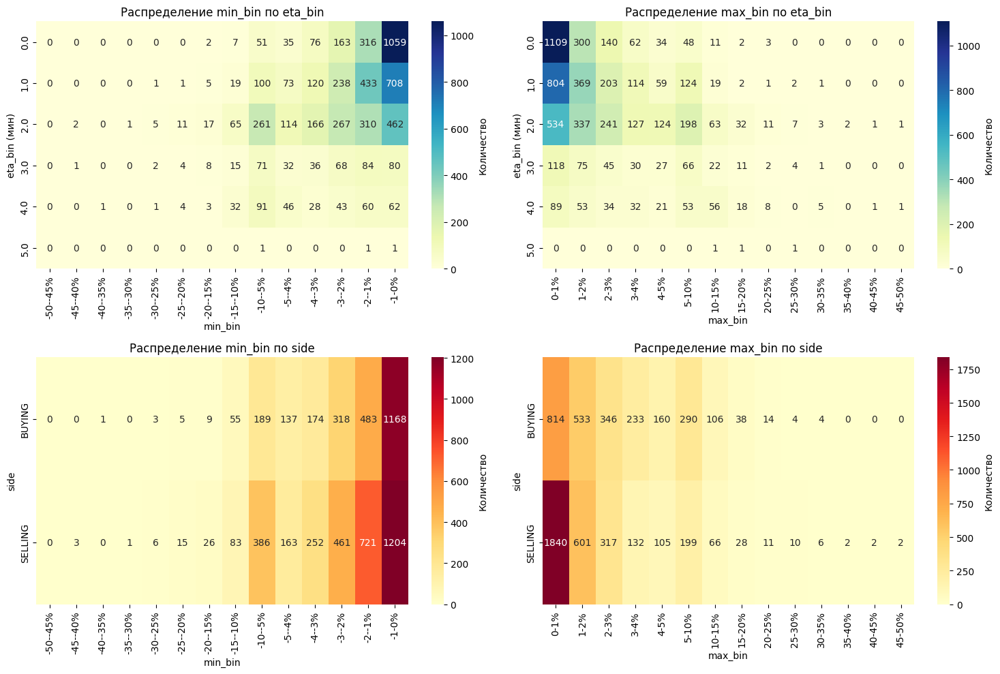

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt  # Также убедитесь, что matplotlib импортирован
# Построение графиков
plt.figure(figsize=(15, 10))

# График 1: Тепловая карта для min_bin по eta_bin
plt.subplot(2, 2, 1)
sns.heatmap(eta_bin_min_counts, cmap="YlGnBu", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение min_bin по eta_bin")
plt.xlabel("min_bin")
plt.ylabel("eta_bin (мин)")

# График 2: Тепловая карта для max_bin по eta_bin
plt.subplot(2, 2, 2)
sns.heatmap(eta_bin_max_counts, cmap="YlGnBu", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение max_bin по eta_bin")
plt.xlabel("max_bin")
plt.ylabel("eta_bin (мин)")

# График 3: Тепловая карта для min_bin по side
plt.subplot(2, 2, 3)
sns.heatmap(side_min_counts, cmap="YlOrRd", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение min_bin по side")
plt.xlabel("min_bin")
plt.ylabel("side")

# График 4: Тепловая карта для max_bin по side
plt.subplot(2, 2, 4)
sns.heatmap(side_max_counts, cmap="YlOrRd", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение max_bin по side")
plt.xlabel("max_bin")
plt.ylabel("side")

# Настройка отображения
plt.tight_layout()
plt.show()

<ipython-input-37-e22d1c3e26a6>:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  min_pivot = data.groupby(["eta_bin", "side", "min_bin"]).size().unstack(level=2, fill_value=0)
<ipython-input-37-e22d1c3e26a6>:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_pivot = data.groupby(["eta_bin", "side", "max_bin"]).size().unstack(level=2, fill_value=0)


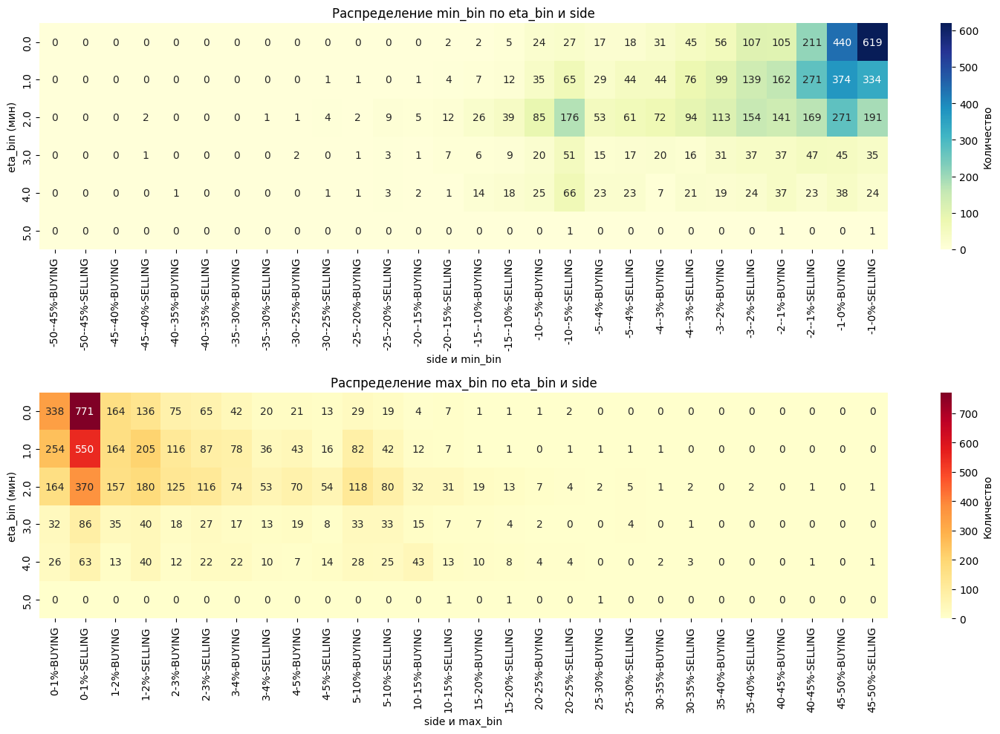

Распределение min_bin по eta_bin и side:
min_bin -50--45%         -45--40%         -40--35%         -35--30%         -30--25%          \
side      BUYING SELLING   BUYING SELLING   BUYING SELLING   BUYING SELLING   BUYING SELLING   
eta_bin                                                                                        
0.0            0       0        0       0        0       0        0       0        0       0   
1.0            0       0        0       0        0       0        0       0        0       1   
2.0            0       0        0       2        0       0        0       1        1       4   
3.0            0       0        0       1        0       0        0       0        2       0   
4.0            0       0        0       0        1       0        0       0        0       1   
5.0            0       0        0       0        0       0        0       0        0       0   

min_bin -25--20%         -20--15%         -15--10%         -10--5%         -5--4%         -4--

In [ ]:

min_labels = [f"{i}-{(i+5)}%" if i < -5 else f"{i}-{(i+1)}%" for i in min_bins[:-1]]
max_labels = [f"{i}-{(i+1)}%" if i < 5 else f"{i}-{(i+5)}%" for i in max_bins[:-1]]

# Разбиваем значения на категории
data["min_bin"] = pd.cut(data["min_pct"], bins=min_bins, labels=min_labels, include_lowest=True)
data["max_bin"] = pd.cut(data["max_pct"], bins=max_bins, labels=max_labels, include_lowest=True)

# Убедимся, что side, eta_bin, min_bin, max_bin не содержат NaN для анализа
data = data.dropna(subset=["eta_bin", "side", "min_bin", "max_bin"])

# Агрегация данных отдельно для min_bin и max_bin
# Для min_bin
min_pivot = data.groupby(["eta_bin", "side", "min_bin"]).size().unstack(level=2, fill_value=0)
min_pivot = min_pivot.groupby(level=[0, 1]).sum().unstack(level=1, fill_value=0)

# Для max_bin
max_pivot = data.groupby(["eta_bin", "side", "max_bin"]).size().unstack(level=2, fill_value=0)
max_pivot = max_pivot.groupby(level=[0, 1]).sum().unstack(level=1, fill_value=0)

# Построение графиков
plt.figure(figsize=(15, 10))

# График 1: Тепловая карта для min_bin по eta_bin и side
plt.subplot(2, 1, 1)
sns.heatmap(min_pivot, cmap="YlGnBu", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение min_bin по eta_bin и side")
plt.xlabel("side и min_bin")
plt.ylabel("eta_bin (мин)")

# График 2: Тепловая карта для max_bin по eta_bin и side
plt.subplot(2, 1, 2)
sns.heatmap(max_pivot, cmap="YlOrRd", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение max_bin по eta_bin и side")
plt.xlabel("side и max_bin")
plt.ylabel("eta_bin (мин)")

# Настройка отображения
plt.tight_layout()
plt.show()

# Вывод таблиц для справки
print("Распределение min_bin по eta_bin и side:")
print(min_pivot)
print("\nРаспределение max_bin по eta_bin и side:")
print(max_pivot)

<ipython-input-38-d4e1e8b38f96>:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  min_pivot_buy = data[data["side"] == "BUYING"].groupby(["eta_bin", "min_bin"]).size().unstack(fill_value=0)
<ipython-input-38-d4e1e8b38f96>:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_pivot_sell = data[data["side"] == "SELLING"].groupby(["eta_bin", "max_bin"]).size().unstack(fill_value=0)


Статистика по min_pct (для BUY) и max_pct (для SELL) по eta_bin и side:
    eta_bin     side  min_pct_min  min_pct_mean  min_pct_median  max_pct_min  max_pct_mean  \
0       0.0   BUYING   -14.098777     -1.205714       -0.625923     0.000000      1.605383   
1       0.0  SELLING   -19.348595     -1.254382       -0.716367     0.000000      0.934732   
2       1.0   BUYING   -23.948156     -1.679291       -1.007788     0.000000      2.506122   
3       1.0  SELLING   -28.247013     -2.145027       -1.449496     0.000000      1.425717   
4       2.0   BUYING   -27.188226     -2.734125       -1.747544     0.000000      3.868955   
5       2.0  SELLING   -44.087061     -4.000333       -2.616966     0.000000      2.968053   
6       3.0   BUYING   -29.292124     -3.291323       -2.161034     0.000000      4.574164   
7       3.0  SELLING   -43.849308     -4.473001       -2.685185     0.000000      3.332100   
8       4.0   BUYING   -35.094716     -4.074117       -2.332057     0.000000      

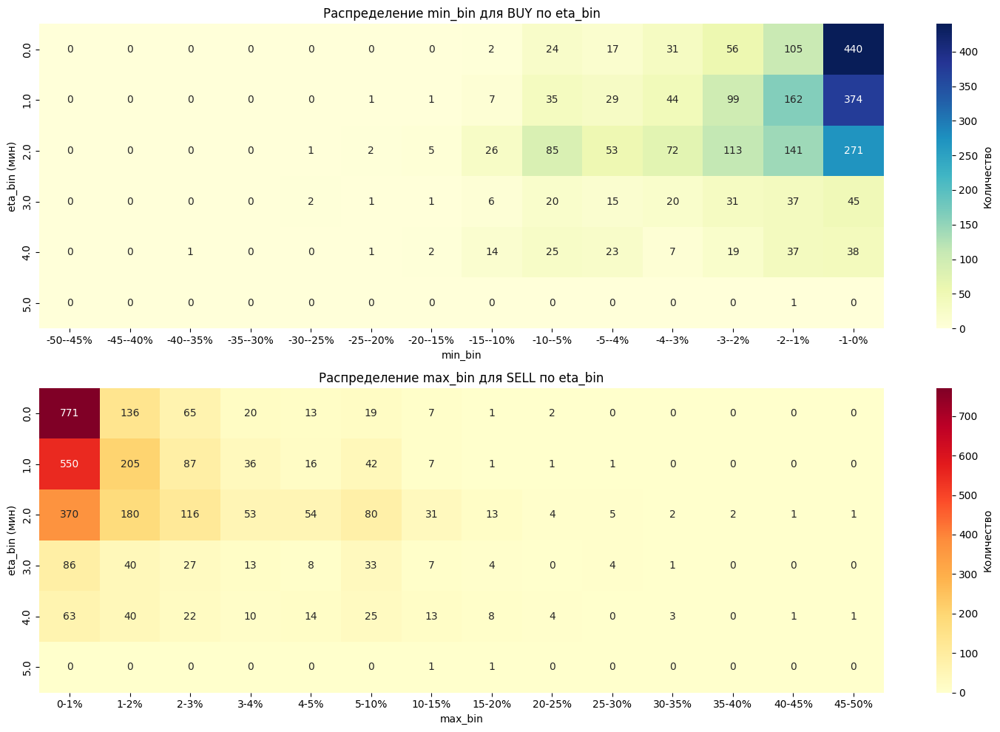


Рекомендации по стоп-лоссу:
Для 0.0 (BUYING):
  - Среднее минимальное падение: -1.21%
  - Процент успешных сделок: 56.30%
  - Рекомендуемый стоп-лосс: -1.33% (10% запас от среднего)
  - Комментарий: Установите стоп-лосс на -1.33%, чтобы минимизировать убытки при 56.30% успеха.
Для 0.0 (SELLING):
  - Средний максимальный рост: 0.93%
  - Процент успешных сделок: 63.64%
  - Рекомендуемый стоп-лосс: 1.03% (10% запас от среднего)
  - Комментарий: Установите стоп-лосс на 1.03%, чтобы выйти при неожиданном росте при 63.64% успеха.
Для 1.0 (BUYING):
  - Среднее минимальное падение: -1.68%
  - Процент успешных сделок: 57.18%
  - Рекомендуемый стоп-лосс: -1.85% (10% запас от среднего)
  - Комментарий: Установите стоп-лосс на -1.85%, чтобы минимизировать убытки при 57.18% успеха.
Для 1.0 (SELLING):
  - Средний максимальный рост: 1.43%
  - Процент успешных сделок: 63.74%
  - Рекомендуемый стоп-лосс: 1.57% (10% запас от среднего)
  - Комментарий: Установите стоп-лосс на 1.57%, чтобы выйти при неож

In [ ]:
min_labels = [f"{i}-{(i+5)}%" if i < -5 else f"{i}-{(i+1)}%" for i in min_bins[:-1]]
max_labels = [f"{i}-{(i+1)}%" if i < 5 else f"{i}-{(i+5)}%" for i in max_bins[:-1]]

# Разбиваем значения на категории
data["min_bin"] = pd.cut(data["min_pct"], bins=min_bins, labels=min_labels, include_lowest=True)
data["max_bin"] = pd.cut(data["max_pct"], bins=max_bins, labels=max_labels, include_lowest=True)

# Убедимся, что side, eta_bin, min_bin, max_bin не содержат NaN
data = data.dropna(subset=["eta_bin", "side", "min_bin", "max_bin", "win"])

# Агрегация данных
# 1. Статистики по min_pct для BUY и max_pct для SELL
stats = data.groupby(["eta_bin", "side"]).agg({
    "min_pct": ["min", "mean", "median"],
    "max_pct": ["min", "mean", "median"],
    "win": ["sum", "count"]
}).reset_index()

# Переименуем колонки для удобства
stats.columns = ["eta_bin", "side", "min_pct_min", "min_pct_mean", "min_pct_median",
                 "max_pct_min", "max_pct_mean", "max_pct_median", "win_sum", "win_count"]
stats["win_rate"] = (stats["win_sum"] / stats["win_count"] * 100).round(2)

# 2. Распределение min_bin для BUY и max_bin для SELL
min_pivot_buy = data[data["side"] == "BUYING"].groupby(["eta_bin", "min_bin"]).size().unstack(fill_value=0)
max_pivot_sell = data[data["side"] == "SELLING"].groupby(["eta_bin", "max_bin"]).size().unstack(fill_value=0)

# Вывод таблиц
print("Статистика по min_pct (для BUY) и max_pct (для SELL) по eta_bin и side:")
print(stats)
print("\nРаспределение min_bin для BUY по eta_bin:")
print(min_pivot_buy)
print("\nРаспределение max_bin для SELL по eta_bin:")
print(max_pivot_sell)

# Построение графиков
plt.figure(figsize=(15, 10))

# График 1: Тепловая карта для min_bin (BUY)
plt.subplot(2, 1, 1)
sns.heatmap(min_pivot_buy, cmap="YlGnBu", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение min_bin для BUY по eta_bin")
plt.xlabel("min_bin")
plt.ylabel("eta_bin (мин)")

# График 2: Тепловая карта для max_bin (SELL)
plt.subplot(2, 1, 2)
sns.heatmap(max_pivot_sell, cmap="YlOrRd", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение max_bin для SELL по eta_bin")
plt.xlabel("max_bin")
plt.ylabel("eta_bin (мин)")

# Настройка отображения
plt.tight_layout()
plt.show()

# Рекомендации по стоп-лоссу
print("\nРекомендации по стоп-лоссу:")
for index, row in stats.iterrows():
    eta = row["eta_bin"]
    side = row["side"]
    if side == "BUYING":
        min_pct_mean = row["min_pct_mean"]
        win_rate = row["win_rate"]
        # Стоп-лосс для BUY основан на min_pct с запасом
        stop_loss = min_pct_mean * 1.1 if min_pct_mean < 0 else min_pct_mean * 0.9
        print(f"Для {eta} (BUYING):")
        print(f"  - Среднее минимальное падение: {min_pct_mean:.2f}%")
        print(f"  - Процент успешных сделок: {win_rate:.2f}%")
        print(f"  - Рекомендуемый стоп-лосс: {stop_loss:.2f}% (10% запас от среднего)")
        print(f"  - Комментарий: Установите стоп-лосс на {stop_loss:.2f}%, чтобы минимизировать убытки при {win_rate:.2f}% успеха.")
    elif side == "SELLING":
        max_pct_mean = row["max_pct_mean"]
        win_rate = row["win_rate"]
        # Стоп-лосс для SELL основан на max_pct с запасом
        stop_loss = max_pct_mean * 1.1 if max_pct_mean > 0 else max_pct_mean * 0.9
        print(f"Для {eta} (SELLING):")
        print(f"  - Средний максимальный рост: {max_pct_mean:.2f}%")
        print(f"  - Процент успешных сделок: {win_rate:.2f}%")
        print(f"  - Рекомендуемый стоп-лосс: {stop_loss:.2f}% (10% запас от среднего)")
        print(f"  - Комментарий: Установите стоп-лосс на {stop_loss:.2f}%, чтобы выйти при неожиданном росте при {win_rate:.2f}% успеха.")

Поиск take profit

<ipython-input-39-ef9928fbef05>:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_pivot_buy = data[data["side"] == "BUYING"].groupby(["eta_bin", "max_bin"]).size().unstack(fill_value=0)
<ipython-input-39-ef9928fbef05>:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  min_pivot_sell = data[data["side"] == "SELLING"].groupby(["eta_bin", "min_bin"]).size().unstack(fill_value=0)


Статистика по max_pct (для BUY) и min_pct (для SELL) по eta_bin и side:
    eta_bin     side  max_pct_max  max_pct_mean  max_pct_median  min_pct_max  min_pct_mean  \
0       0.0   BUYING    22.344133      1.605383        0.997674     0.000000     -1.205714   
1       0.0  SELLING    20.154242      0.934732        0.373573     0.000000     -1.254382   
2       1.0   BUYING    31.578947      2.506122        1.754037     0.000000     -1.679291   
3       1.0  SELLING    25.060236      1.425717        0.794540     0.000000     -2.145027   
4       2.0   BUYING    32.189565      3.868955        2.488220     0.000000     -2.734125   
5       2.0  SELLING    45.788272      2.968053        1.497956     0.000000     -4.000333   
6       3.0   BUYING    22.428042      4.574164        3.115895     0.000000     -3.291323   
7       3.0  SELLING    31.300730      3.332100        1.533571    -0.028246     -4.473001   
8       4.0   BUYING    34.894719      7.534916        5.568829     0.000000     -

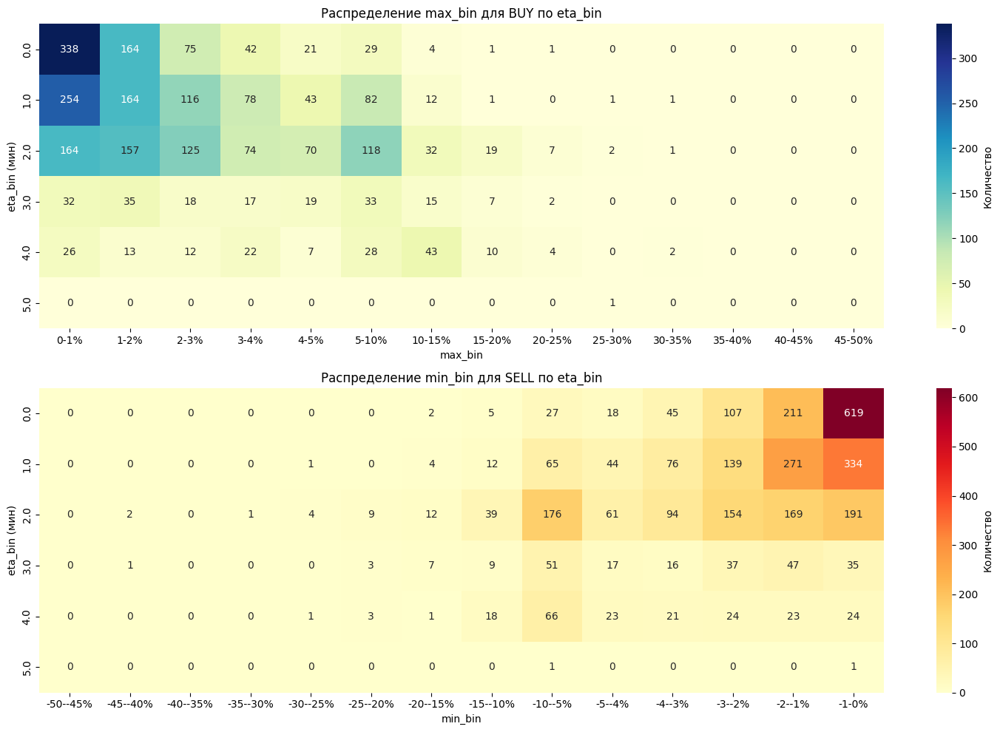


Рекомендации по тейк-профиту:
Для 0.0 (BUYING):
  - Средний максимальный рост: 1.61%
  - Процент успешных сделок: 56.30%
  - Рекомендуемый тейк-профит: 1.44% (90% от среднего)
  - Комментарий: Установите тейк-профит на 1.44%, чтобы фиксировать прибыль при 56.30% успеха.
Для 0.0 (SELLING):
  - Среднее минимальное падение: -1.25%
  - Процент успешных сделок: 63.64%
  - Рекомендуемый тейк-профит: -1.13% (90% от среднего)
  - Комментарий: Установите тейк-профит на -1.13%, чтобы фиксировать прибыль при 63.64% успеха.
Для 1.0 (BUYING):
  - Средний максимальный рост: 2.51%
  - Процент успешных сделок: 57.18%
  - Рекомендуемый тейк-профит: 2.26% (90% от среднего)
  - Комментарий: Установите тейк-профит на 2.26%, чтобы фиксировать прибыль при 57.18% успеха.
Для 1.0 (SELLING):
  - Среднее минимальное падение: -2.15%
  - Процент успешных сделок: 63.74%
  - Рекомендуемый тейк-профит: -1.93% (90% от среднего)
  - Комментарий: Установите тейк-профит на -1.93%, чтобы фиксировать прибыль при 63.74% у

In [ ]:
# Убедимся, что side, eta_bin, min_bin, max_bin не содержат NaN
data = data.dropna(subset=["eta_bin", "side", "min_bin", "max_bin", "win"])

# Агрегация данных для тейк-профита
stats = data.groupby(["eta_bin", "side"]).agg({
    "max_pct": ["max", "mean", "median"],  # Для BUYING
    "min_pct": ["max", "mean", "median"],  # Для SELLING
    "win": ["sum", "count"]
}).reset_index()

# Переименуем колонки для удобства
stats.columns = ["eta_bin", "side", "max_pct_max", "max_pct_mean", "max_pct_median",
                 "min_pct_max", "min_pct_mean", "min_pct_median", "win_sum", "win_count"]
stats["win_rate"] = (stats["win_sum"] / stats["win_count"] * 100).round(2)

# Распределение max_bin для BUY и min_bin для SELL
max_pivot_buy = data[data["side"] == "BUYING"].groupby(["eta_bin", "max_bin"]).size().unstack(fill_value=0)
min_pivot_sell = data[data["side"] == "SELLING"].groupby(["eta_bin", "min_bin"]).size().unstack(fill_value=0)

# Вывод таблиц
print("Статистика по max_pct (для BUY) и min_pct (для SELL) по eta_bin и side:")
print(stats)
print("\nРаспределение max_bin для BUY по eta_bin:")
print(max_pivot_buy)
print("\nРаспределение min_bin для SELL по eta_bin:")
print(min_pivot_sell)

# Построение графиков
plt.figure(figsize=(15, 10))

# График 1: Тепловая карта для max_bin (BUY)
plt.subplot(2, 1, 1)
sns.heatmap(max_pivot_buy, cmap="YlGnBu", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение max_bin для BUY по eta_bin")
plt.xlabel("max_bin")
plt.ylabel("eta_bin (мин)")

# График 2: Тепловая карта для min_bin (SELL)
plt.subplot(2, 1, 2)
sns.heatmap(min_pivot_sell, cmap="YlOrRd", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение min_bin для SELL по eta_bin")
plt.xlabel("min_bin")
plt.ylabel("eta_bin (мин)")

plt.tight_layout()
plt.show()

# Рекомендации по тейк-профиту
print("\nРекомендации по тейк-профиту:")
for index, row in stats.iterrows():
    eta = row["eta_bin"]
    side = row["side"]
    if side == "BUYING":
        max_pct_mean = row["max_pct_mean"]
        win_rate = row["win_rate"]
        # Тейк-профит для BUY основан на max_pct с уменьшением для реалистичности
        take_profit = max_pct_mean * 0.9 if max_pct_mean > 0 else max_pct_mean * 1.1
        print(f"Для {eta} (BUYING):")
        print(f"  - Средний максимальный рост: {max_pct_mean:.2f}%")
        print(f"  - Процент успешных сделок: {win_rate:.2f}%")
        print(f"  - Рекомендуемый тейк-профит: {take_profit:.2f}% (90% от среднего)")
        print(f"  - Комментарий: Установите тейк-профит на {take_profit:.2f}%, чтобы фиксировать прибыль при {win_rate:.2f}% успеха.")
    elif side == "SELLING":
        min_pct_mean = row["min_pct_mean"]
        win_rate = row["win_rate"]
        # Тейк-профит для SELL основан на min_pct с уменьшением для реалистичности
        take_profit = min_pct_mean * 0.9 if min_pct_mean < 0 else min_pct_mean * 1.1
        print(f"Для {eta} (SELLING):")
        print(f"  - Среднее минимальное падение: {min_pct_mean:.2f}%")
        print(f"  - Процент успешных сделок: {win_rate:.2f}%")
        print(f"  - Рекомендуемый тейк-профит: {take_profit:.2f}% (90% от среднего)")
        print(f"  - Комментарий: Установите тейк-профит на {take_profit:.2f}%, чтобы фиксировать прибыль при {win_rate:.2f}% успеха.")

**Тестирование разных стратегий**

Вход в спот, за все время на 100$ депозит 1000$

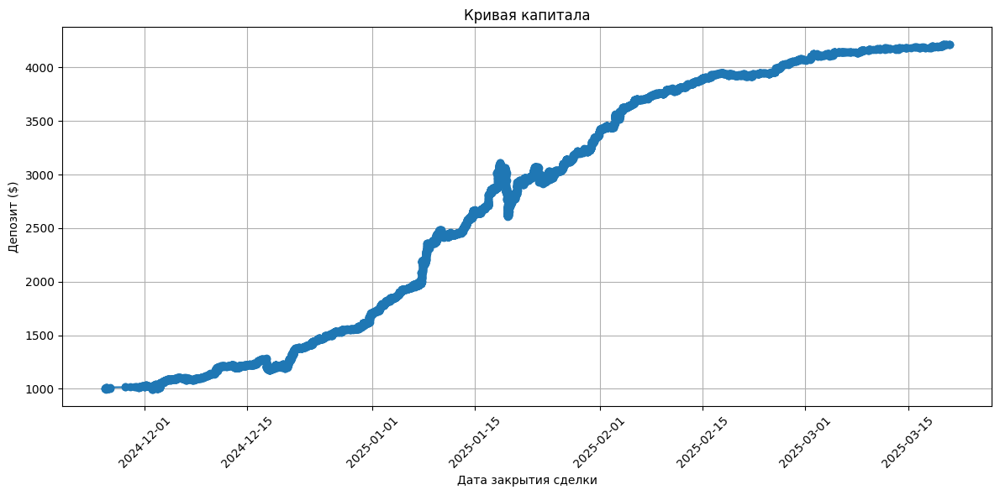

Прибыль по месяцам:
     month       profit
0  2024-11    24.896400
1  2024-12   680.385301
2  2025-01  1694.129446
3  2025-02   671.575926
4  2025-03   144.615542


<ipython-input-40-0377c7927700>:50: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month'] = df['close'].dt.to_period('M')


<Figure size 1200x600 with 0 Axes>

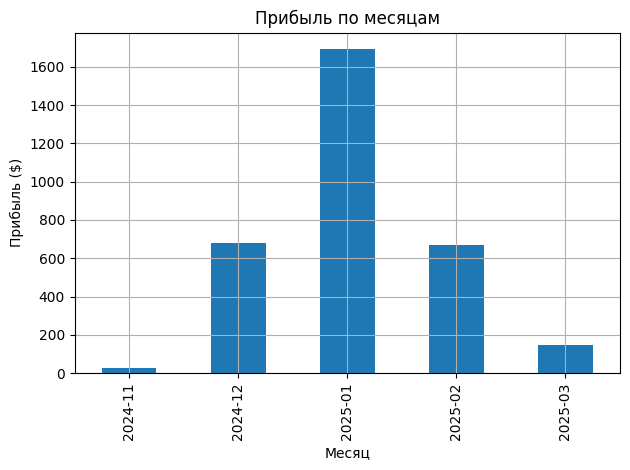

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Преобразуем даты в формат datetime
df['open'] = pd.to_datetime(df['open'])
df['close'] = pd.to_datetime(df['close'])

# Шаг 1: Расчет прибыли для каждой сделки
def calculate_profit(row):
    if row['side'] == 'BUYING':
        return 100 * (row['close_price'] / row['open_price'] - 1)
    elif row['side'] == 'SELLING':
        return 100 * (1 - row['close_price'] / row['open_price'])
    else:
        return 0

df['profit'] = df.apply(calculate_profit, axis=1)

# Шаг 2: Сортировка по дате открытия
df = df.sort_values(by='open')

# Шаг 3: Моделирование депозита
initial_deposit = 1000
deposit = initial_deposit
equity_curve = [initial_deposit]

for index, row in df.iterrows():
    if deposit >= 100:
        profit = row['profit']
        deposit += profit
        equity_curve.append(deposit)
    else:
        equity_curve.append(deposit)  # Депозит не меняется, если не хватает средств

# Добавляем equity_curve в DataFrame
df['equity_after_trade'] = equity_curve[1:]  # Берем значения после каждой сделки

# Шаг 4: Построение кривой капитала
plt.figure(figsize=(12, 6))
plt.plot(df['close'], df['equity_after_trade'], marker='o', linestyle='-')
plt.title("Кривая капитала")
plt.xlabel("Дата закрытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Шаг 5: Прибыль по месяцам
df['month'] = df['close'].dt.to_period('M')
monthly_profit = df.groupby('month')['profit'].sum().reset_index()

print("Прибыль по месяцам:")
print(monthly_profit)

# График прибыли по месяцам
plt.figure(figsize=(12, 6))
monthly_profit.plot(x='month', y='profit', kind='bar', legend=False)
plt.title("Прибыль по месяцам")
plt.xlabel("Месяц")
plt.ylabel("Прибыль ($)")
plt.grid(True)
plt.tight_layout()
plt.show()

Получение equity с учетом take profit

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Определение тейк-профитов
take_profit_dict = {
    (0.0, 'BUYING'): 1.44 / 100,
    (0.0, 'SELLING'): -1.13 / 100,
    (1.0, 'BUYING'): 2.26 / 100,
    (1.0, 'SELLING'): -1.93 / 100,
    (2.0, 'BUYING'): 3.48 / 100,
    (2.0, 'SELLING'): -3.60 / 100,
    (3.0, 'BUYING'): 4.12 / 100,
    (3.0, 'SELLING'): -4.03 / 100,
    (4.0, 'BUYING'): 6.78 / 100,
    (4.0, 'SELLING'): -4.84 / 100,
    (5.0, 'BUYING'): 24.10 / 100,
    (5.0, 'SELLING'): -2.64 / 100,
}

def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

def simulate_trade(row, stop_loss_dict, take_profit_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)  # Начальный стоп-лосс в процентах
    take_profit = take_profit_dict.get((eta_bin, side), 0)  # Тейк-профит в процентах
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации
    liquidation_threshold = 1 / leverage

    # Начальные цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Начальный стоп-лосс ниже open_price
        take_profit_price = open_price * (1 + take_profit)  # Тейк-профит выше open_price
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Начальный стоп-лосс выше open_price
        take_profit_price = open_price * (1 + take_profit)  # Тейк-профит ниже open_price
        liquidation_price = open_price * (1 + liquidation_threshold)

    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, тейк-профит {take_profit_price:.4f}, "
          f"порог ликвидации {liquidation_price:.4f}, trailing stop изначально {stop_loss*100:.2f}%")

    if side == 'BUYING':
        max_high = open_price  # Начальный максимум
        trailing_stop_price = stop_loss_price  # Trailing stop начинается с начального стоп-лосса
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%), high: {high_price}")
            # Проверка тейк-профита
            if high_price >= take_profit_price:
                print(f"Тейк-профит сработал на {high_price}")
                return high_price, False
            # Обновляем максимум и trailing stop
            if high_price > max_high:
                price_increase_percent = (high_price - open_price) / open_price  # Процент роста
                max_high = high_price
                trailing_stop_price = open_price * (1 + stop_loss + price_increase_percent)
                print(f"Новый максимум: {max_high}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
            # Проверка trailing stop
            if low_price <= trailing_stop_price:
                print(f"Trailing stop сработал на {low_price}")
                return low_price, False
        print(f"Ни тейк-профит, ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        min_low = open_price  # Начальный минимум
        trailing_stop_price = stop_loss_price  # Trailing stop начинается с начального стоп-лосса
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%), low: {low_price}")
            # Проверка тейк-профита
            if low_price <= take_profit_price:
                print(f"Тейк-профит сработал на {low_price}")
                return low_price, False
            # Обновляем минимум и trailing stop
            if low_price < min_low:
                price_decrease_percent = (open_price - low_price) / open_price  # Процент падения
                min_low = low_price
                trailing_stop_price = open_price * (1 + stop_loss - price_decrease_percent)
                print(f"Новый минимум: {min_low}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
            # Проверка trailing stop
            if high_price >= trailing_stop_price:
                print(f"Trailing stop сработал на {high_price}")
                return high_price, False
        print(f"Ни тейк-профит, ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
df['open_time'] = pd.to_datetime(df['open_time'])
df_march = df[df['open_time'].dt.month == 3]
df_march = df_march.sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
leverage = 25

# Инициализация
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0

# Симуляция сделок
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, take_profit_dict, leverage, investment)
        profit = calculate_profit(row, final_price, leverage, investment, liquidated)
        deposit += profit
        if liquidated:
            liquidation_count += 1
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

df_march['equity_after_trade'] = equity_curve[1:]

# График
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x и take profit")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"Итоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

NameError: name 'df' is not defined

Добавление комиссий

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re

# Определение стоп-лоссов
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Определение тейк-профитов
take_profit_dict = {
    (0.0, 'BUYING'): 1.44 / 100,
    (0.0, 'SELLING'): -1.13 / 100,
    (1.0, 'BUYING'): 2.26 / 100,
    (1.0, 'SELLING'): -1.93 / 100,
    (2.0, 'BUYING'): 3.48 / 100,
 ,'SELLING'): -3.60 / 100,
    (3.0, 'BUYING'): 4.12 / 100,
    (3.0, 'SELLING'): -4.03 / 100,
    (4.0, 'BUYING'): 6.78 / 100,
    (4.0, 'SELLING'): -4.84 / 100,
    (5.0, 'BUYING'): 24.10 / 100,
    (5.0, 'SELLING'): -2.64 / 100,
}

def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

def simulate_trade(row, stop_loss_dict, take_profit_dict, leverage, investment):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)  # Начальный стоп-лосс в процентах
    take_profit = take_profit_dict.get((eta_bin, side), 0)  # Тейк-профит в процентах
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Уровень ликвидации
    liquidation_threshold = 1 / leverage

    # Начальные цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)  # Начальный стоп-лосс ниже open_price
        take_profit_price = open_price * (1 + take_profit)  # Тейк-профит выше open_price
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)  # Начальный стоп-лосс выше open_price
        take_profit_price = open_price * (1 + take_profit)  # Тейк-профит ниже open_price
        liquidation_price = open_price * (1 + liquidation_threshold)

    print(f"\nДля {row['ticker']}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f}, тейк-профит {take_profit_price:.4f}, "
          f"порог ликвидации {liquidation_price:.4f}, trailing stop изначально {stop_loss*100:.2f}%")

    if side == 'BUYING':
        max_high = open_price  # Начальный максимум
        trailing_stop_price = stop_loss_price  # Trailing stop начинается с начального стоп-лосса
        print(f"Цена ликвидации для BUYING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((low_price - open_price) / open_price) * 100
            print(f"Свеча low: {low_price} (отклонение: {deviation_percent:.2f}%), high: {high_price}")
            # Проверка тейк-профита
            if high_price >= take_profit_price:
                print(f"Тейк-профит сработал на {high_price}")
                return high_price, False
            # Обновляем максимум и trailing stop
            if high_price > max_high:
                price_increase_percent = (high_price - open_price) / open_price  # Процент роста
                max_high = high_price
                trailing_stop_price = open_price * (1 + stop_loss + price_increase_percent)
                print(f"Новый максимум: {max_high}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if low_price <= liquidation_price:
                print(f"Ликвидация сработала на {low_price}")
                return low_price, True
            # Проверка trailing stop
            if low_price <= trailing_stop_price:
                print(f"Trailing stop сработал на {low_price}")
                return low_price, False
        print(f"Ни тейк-профит, ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

    elif side == 'SELLING':
        min_low = open_price  # Начальный минимум
        trailing_stop_price = stop_loss_price  # Trailing stop начинается с начального стоп-лосса
        print(f"Цена ликвидации для SELLING: {liquidation_price:.4f}")
        for candle in all_ochlv:
            low_price = candle['low']
            high_price = candle['high']
            deviation_percent = ((high_price - open_price) / open_price) * 100
            print(f"Свеча high: {high_price} (отклонение: {deviation_percent:.2f}%), low: {low_price}")
            # Проверка тейк-профита
            if low_price <= take_profit_price:
                print(f"Тейк-профит сработал на {low_price}")
                return low_price, False
            # Обновляем минимум и trailing stop
            if low_price < min_low:
                price_decrease_percent = (open_price - low_price) / open_price  # Процент падения
                min_low = low_price
                trailing_stop_price = open_price * (1 + stop_loss - price_decrease_percent)
                print(f"Новый минимум: {min_low}, trailing stop обновлен до {trailing_stop_price:.4f}")
            # Проверка ликвидации
            if high_price >= liquidation_price:
                print(f"Ликвидация сработала на {high_price}")
                return high_price, True
            # Проверка trailing stop
            if high_price >= trailing_stop_price:
                print(f"Trailing stop сработал на {high_price}")
                return high_price, False
        print(f"Ни тейк-профит, ни стоп-лосс, ни ликвидация не сработали, используется close_price {row['close_price']}")
        return row['close_price'], False

# Обновленная функция calculate_profit с учетом комиссий
def calculate_profit(row, final_price, leverage, investment, liquidated, fee_rate):
    open_price = row['open_price']
    side = row['side']

    if liquidated:
        profit = -investment  # При ликвидации теряется вся маржа
    else:
        if side == 'BUYING':
            price_change = (final_price / open_price) - 1
        elif side == 'SELLING':
            price_change = 1 - (final_price / open_price)
        else:
            price_change = 0
        # Прибыль до комиссий
        profit_before_commission = investment * leverage * price_change
        # Общая комиссия (для открытия и закрытия позиции)
        total_commission = 2 * investment * leverage * fee_rate
        # Чистая прибыль после вычета комиссий
        profit = profit_before_commission - total_commission

    print(f"Прибыль для {row['ticker']}: {profit:.2f} (Ликвидировано: {liquidated})")
    return profit

# Предполагается, что df уже определен ранее в коде
# Преобразование all_ochlv
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
df['open_time'] = pd.to_datetime(df['open_time'])
df_march = df[df['open_time'].dt.month == 3]
df_march = df_march.sort_values(by='open_time')

# Параметры симуляции
initial_deposit = 1000  # Начальный депозит
investment = 100       # Инвестиция на сделку
leverage = 25          # Рычаг
fee_rate = 0.0006      # Комиссия тейкера Bybit 0.06%

# Инициализация
deposit = initial_deposit
equity_curve = [initial_deposit]
liquidation_count = 0

# Симуляция сделок с учетом комиссий
for index, row in df_march.iterrows():
    if deposit >= investment:
        final_price, liquidated = simulate_trade(row, stop_loss_dict, take_profit_dict, leverage, investment)
        # Передаем fee_rate в функцию calculate_profit
        profit = calculate_profit(row, final_price, leverage, investment, liquidated, fee_rate)
        deposit += profit
        if liquidated:
            liquidation_count += 1
        equity_curve.append(deposit)
    else:
        print(f"Недостаточно средств для сделки {row['ticker']}, депозит: {deposit}")
        equity_curve.append(deposit)

df_march['equity_after_trade'] = equity_curve[1:]

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(df_march['open_time'], df_march['equity_after_trade'], marker='o', linestyle='-')
plt.title(f"Кривая капитала за март с рычагом {leverage}x и учетом комиссий Bybit")
plt.xlabel("Дата открытия сделки")
plt.ylabel("Депозит ($)")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print(f"Итоговый депозит за март с рычагом {leverage}x: ${deposit:.2f}")
print(f"Количество ликвидаций: {liquidation_count}")

SyntaxError: closing parenthesis ')' does not match opening parenthesis '{' on line 24 (<ipython-input-1-6d5be3c73a43>, line 30)

In [ ]:
df.head()

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win,profit,equity_after_trade,eta_bin
12580,CHILLGUY,760800.0,SELLING,5.58,380.49M,7.29M,89500000.0,NaN,76.08K every 1m,10.0,NaN,Df6yfrKC8kZE3KNkrHERKzAetSxbrWeniQfyJY4Jpump,6K2d9LvM3i47P9FxzEQP4hXZwiHA2c2wgfzGTeTvJqj8,NaN,2024-11-25 13:28:14+00:00,2024-11-25 13:38:14+00:00,2024-11-25 13:28:14+00:00,2024-11-25 13:38:14+00:00,76.08K,1 m,0.39400,0.39150,"[{'timestamp': datetime.datetime(2024, 11, 25,...",-0.634518,win,1,2024-11-25,Monday,2024-11,2024-11-25 13:28:14+00:00,2024-11-25,1,0.634518,1000.634518,0.0
12579,GOAT,1620000.0,SELLING,6.61,810.04M,12.89M,12110000.0,NaN,162.00K every 1m,10.0,NaN,CzLSujWBLFsSjncfkh59rUFqvafWcY5tzedWJSuypump,6K2d9LvM3i47P9FxzEQP4hXZwiHA2c2wgfzGTeTvJqj8,NaN,2024-11-25 13:28:24+00:00,2024-11-25 13:38:24+00:00,2024-11-25 13:28:24+00:00,2024-11-25 13:38:24+00:00,162.00K,1 m,0.81610,0.81860,"[{'timestamp': datetime.datetime(2024, 11, 25,...",0.306335,loss,0,2024-11-25,Monday,2024-11,2024-11-25 13:28:24+00:00,2024-11-25,0,-0.306335,1000.328183,0.0
12571,Pnut,17010.0,SELLING,6.04,1.15B,19.89M,28830000.0,NaN,773.06 every 1m,22.0,NaN,2qEHjDLDLbuBgRYvsxhc5D6uDWAivNFZGan56P1tpump,Bd452xENkG9VKk2hp3Vbf4KggvfW6cLMmKCydnoeaw9X,NaN,2024-11-25 14:42:05+00:00,2024-11-25 15:04:05+00:00,2024-11-25 14:42:05+00:00,2024-11-25 15:04:05+00:00,773.06,1 m,1.14620,1.14750,"[{'timestamp': datetime.datetime(2024, 11, 25,...",0.113418,loss,0,2024-11-25,Monday,2024-11,2024-11-25 14:42:05+00:00,2024-11-25,0,-0.113418,1000.214765,1.0
12560,MOODENG,588.5,SELLING,5.51,350.45M,8.59M,9970000.0,NaN,58.85 every 1m,10.0,NaN,ED5nyyWEzpPPiWimP8vYm7sD7TD3LAt3Q3gRTWHzPJBY,CQ3NdrwpqnFvzqvr3XReuPvRLQE7sTiTTSia4AgCtQef,NaN,2024-11-25 16:11:43+00:00,2024-11-25 16:21:43+00:00,2024-11-25 16:11:43+00:00,2024-11-25 16:21:43+00:00,58.85,1 m,0.35615,0.36424,"[{'timestamp': datetime.datetime(2024, 11, 25,...",2.271515,loss,0,2024-11-25,Monday,2024-11,2024-11-25 16:11:43+00:00,2024-11-25,0,-2.271515,997.943250,0.0
12559,KMNO,582050.0,SELLING,12.81,181.14M,207.65K,823660.0,NaN,19.40K every 1m,29.0,NaN,KMNo3nJsBXfcpJTVhZcXLW7RmTwTt4GVFE7suUBo9sS,AQNDBbDtYfQcAyXfrJwNiJVYNn6SuG3FPj2ZTe6HLdZL,NaN,2024-11-25 16:16:56+00:00,2024-11-25 16:46:56+00:00,2024-11-25 16:16:56+00:00,2024-11-25 16:46:56+00:00,19.40K,1 m,0.13518,0.13315,"[{'timestamp': datetime.datetime(2024, 11, 25,...",-1.501701,win,1,2024-11-25,Monday,2024-11,2024-11-25 16:16:56+00:00,2024-11-25,1,1.501701,999.444951,1.0


Получение примерного максимума за период в процентах
Построение fullness

In [ ]:
import pandas as pd
import re
import datetime
import pytz

# Функции парсинга
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Функция вычисления fullness
def calculate_fullness(row):
    all_ochlv = row['all_ochlv']
    side = row['side']

    if not isinstance(all_ochlv, list) or len(all_ochlv) == 0:
        print(f"Строка {row.name}: all_ochlv некорректен или пуст")
        return None

    total_candles = len(all_ochlv)
    highs = []
    lows = []

    for i, candle in enumerate(all_ochlv):
        if not isinstance(candle, dict):
            print(f"Строка {row.name}, свеча {i}: не словарь")
            return None
        if 'high' not in candle or 'low' not in candle:
            print(f"Строка {row.name}, свеча {i}: отсутствует 'high' или 'low'")
            return None
        try:
            highs.append(float(candle['high']))
            lows.append(float(candle['low']))
        except (ValueError, TypeError):
            print(f"Строка {row.name}, свеча {i}: 'high' или 'low' не число")
            return None

    if side == 'SELLING':
        min_low = min(lows)
        min_index = lows.index(min_low)
    else:  # 'BUYING'
        max_high = max(highs)
        min_index = highs.index(max_high)

    fullness = ((min_index + 1) / total_candles) * 100
    return round(fullness, 2)

# Применение
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
df['fullness'] = df.apply(calculate_fullness, axis=1)

# Проверка результата
print(df[['ticker', 'side', 'all_ochlv', 'fullness']].head())

         ticker     side                                          all_ochlv  fullness
12580  CHILLGUY  SELLING  [{'timestamp': 2024-11-25 13:29:00+00:00, 'ope...     100.0
12579      GOAT  SELLING  [{'timestamp': 2024-11-25 13:29:00+00:00, 'ope...      10.0
12571      Pnut  SELLING  [{'timestamp': 2024-11-25 14:43:00+00:00, 'ope...      50.0
12560   MOODENG  SELLING  [{'timestamp': 2024-11-25 16:12:00+00:00, 'ope...      10.0
12559      KMNO  SELLING  [{'timestamp': 2024-11-25 16:17:00+00:00, 'ope...     100.0


In [ ]:
df.tail()

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,is_win,profit,equity_after_trade,eta_bin,fullness
4,Fartcoin,659860.0,SELLING,-11.30,377.58M,21.36M,15320000.0,417.12K,11.00K every 1min,60.0,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-20 02:10:36+00:00,2025-03-20 03:10:36+00:00,11.00K,1 min,0.3787,0.3837,"[{'timestamp': 2025-03-20 02:11:00+00:00, 'ope...",1.320306,loss,0,2025-03-20,Thursday,2025-03,2025-03-20 02:10:36+00:00,2025-03-20,0,-1.320306,4214.577536,2.0,10.0
3,JTO,89970.0,BUYING,4.24,660.45M,8.39M,2180000.0,53.35K,9.00K every 1min,9.0,mexc bitget gate binance,jtojtomepa8beP8AuQc6eXt5FriJwfFMwQx2v2f9mCL,NaN,NaN,NaN,NaN,2025-03-20 04:20:34+00:00,2025-03-20 04:30:34+00:00,9.00K,1 min,2.1640,2.1780,"[{'timestamp': 2025-03-20 04:21:00+00:00, 'ope...",0.646950,win,1,2025-03-20,Thursday,2025-03,2025-03-20 04:20:34+00:00,2025-03-20,1,0.646950,4215.224486,0.0,100.0
2,GRASS,100020.0,BUYING,10.60,348.65M,3.67M,889320.0,121.21K,25.00K every 4min,16.0,mexc bitget gate binance,Grass7B4RdKfBCjTKgSqnXkqjwiGvQyFbuSCUJr3XXjs,NaN,NaN,NaN,NaN,2025-03-20 11:01:48+00:00,2025-03-20 11:17:48+00:00,25.00K,4 min,1.2700,1.2832,"[{'timestamp': 2025-03-20 11:02:00+00:00, 'ope...",1.039370,win,1,2025-03-20,Thursday,2025-03,2025-03-20 11:01:48+00:00,2025-03-20,1,1.039370,4216.263856,1.0,100.0
1,Fartcoin,161080.0,SELLING,-3.03,386.74M,20.80M,13810000.0,442.06K,16.11K every 1min,10.0,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-20 14:05:48+00:00,2025-03-20 14:15:48+00:00,16.11K,1 min,0.3871,0.3871,"[{'timestamp': 2025-03-20 14:06:00+00:00, 'ope...",0.000000,loss,0,2025-03-20,Thursday,2025-03,2025-03-20 14:05:48+00:00,2025-03-20,0,0.000000,4216.263856,0.0,80.0
0,Fartcoin,90030.0,BUYING,1.72,390.54M,20.89M,14110000.0,841.97K,9.00K every 1min,10.0,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-20 14:25:05+00:00,2025-03-20 14:35:05+00:00,9.00K,1 min,0.3932,0.3906,"[{'timestamp': 2025-03-20 14:26:00+00:00, 'ope...",-0.661241,loss,0,2025-03-20,Thursday,2025-03,2025-03-20 14:25:05+00:00,2025-03-20,0,-0.661241,4215.602615,0.0,50.0


<ipython-input-49-9fb1b62ec536>:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fullness_pivot = df.groupby(["eta_bin", "side", "fullness_bin"]).size().unstack(level=2, fill_value=0)


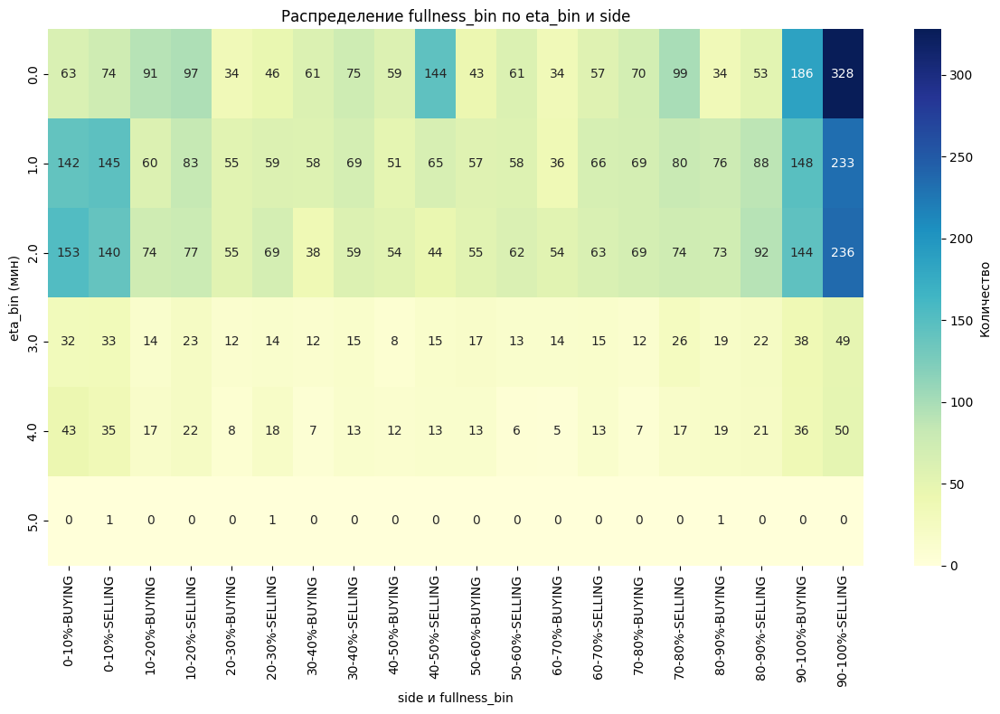

Распределение fullness_bin по eta_bin и side:
fullness_bin  0-10%         10-20%         20-30%         30-40%         40-50%         50-60%  \
side         BUYING SELLING BUYING SELLING BUYING SELLING BUYING SELLING BUYING SELLING BUYING   
eta_bin                                                                                          
0.0              63      74     91      97     34      46     61      75     59     144     43   
1.0             142     145     60      83     55      59     58      69     51      65     57   
2.0             153     140     74      77     55      69     38      59     54      44     55   
3.0              32      33     14      23     12      14     12      15      8      15     17   
4.0              43      35     17      22      8      18      7      13     12      13     13   
5.0               0       1      0       0      0       1      0       0      0       0      0   

fullness_bin         60-70%         70-80%         80-90%         90-10

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Предполагаем, что df — это ваш DataFrame с колонками 'eta_bin', 'side', 'fullness'

# Шаг 1: Определяем бины и метки для fullness
fullness_bins = [i for i in range(0, 101, 10)]  # [0, 10, 20, ..., 100]
fullness_labels = [f"{i}-{(i+10)}%" for i in range(0, 100, 10)]  # ['0-10%', '10-20%', ..., '90-100%']

# Шаг 2: Разбиваем fullness на категории
df["fullness_bin"] = pd.cut(df["fullness"], bins=fullness_bins, labels=fullness_labels, include_lowest=True)

# Шаг 3: Убедимся, что eta_bin, side и fullness_bin не содержат NaN
df = df.dropna(subset=["eta_bin", "side", "fullness_bin"])

# Шаг 4: Агрегация данных по eta_bin, side и fullness_bin
fullness_pivot = df.groupby(["eta_bin", "side", "fullness_bin"]).size().unstack(level=2, fill_value=0)
fullness_pivot = fullness_pivot.groupby(level=[0, 1]).sum().unstack(level=1, fill_value=0)

# Шаг 5: Построение тепловой карты
plt.figure(figsize=(12, 8))
sns.heatmap(fullness_pivot, cmap="YlGnBu", annot=True, fmt="d", cbar_kws={'label': 'Количество'})
plt.title("Распределение fullness_bin по eta_bin и side")
plt.xlabel("side и fullness_bin")
plt.ylabel("eta_bin (мин)")
plt.tight_layout()
plt.show()

# Шаг 6: Вывод таблицы
print("Распределение fullness_bin по eta_bin и side:")
print(fullness_pivot)

<ipython-input-50-afc73df3271e>:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(["eta_bin", "side", "fullness_bin"]).agg(
<ipython-input-50-afc73df3271e>:23: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  profit_pivot = grouped.pivot_table(index=["eta_bin", "side"], columns="fullness_bin", values="mean_profit")
<ipython-input-50-afc73df3271e>:24: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  win_rate_pivot = grouped.pivot_table(index=["eta_bin", "side"],

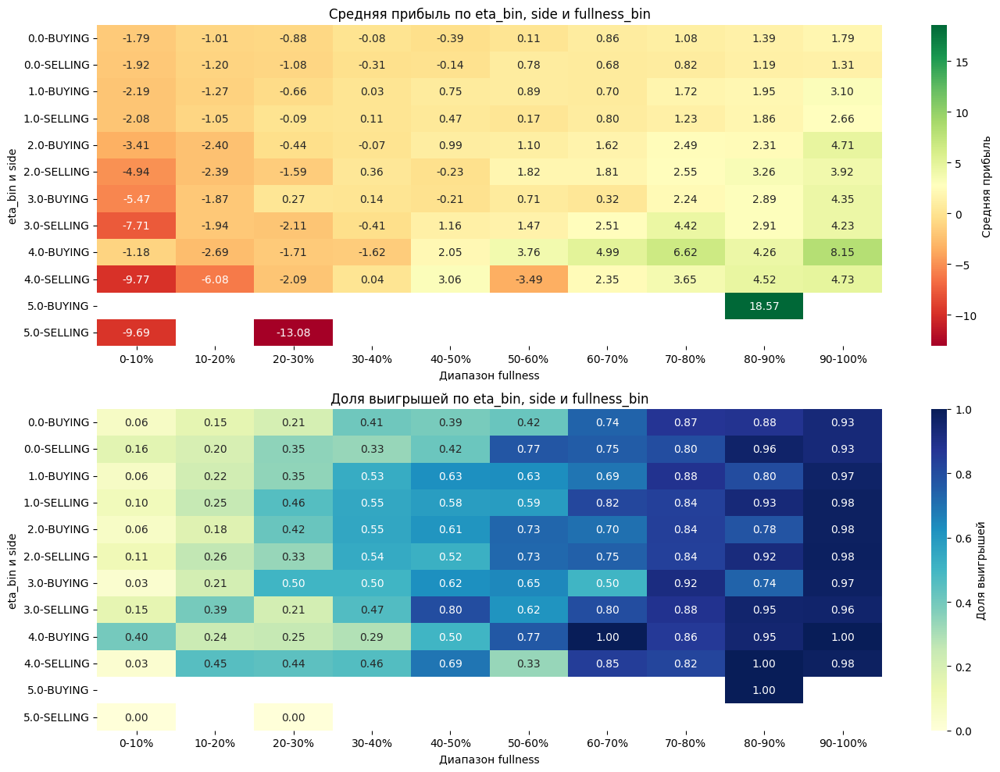


Лучший fullness_bin по средней прибыли:
eta_bin  side   
0.0      BUYING     90-100%
         SELLING    90-100%
1.0      BUYING     90-100%
         SELLING    90-100%
2.0      BUYING     90-100%
         SELLING    90-100%
3.0      BUYING     90-100%
         SELLING     70-80%
4.0      BUYING     90-100%
         SELLING    90-100%
5.0      BUYING      80-90%
         SELLING      0-10%
dtype: category
Categories (10, object): ['0-10%' < '10-20%' < '20-30%' < '30-40%' ... '60-70%' < '70-80%' < '80-90%' < '90-100%']

Лучший fullness_bin по доле выигрышей:
eta_bin  side   
0.0      BUYING     90-100%
         SELLING     80-90%
1.0      BUYING     90-100%
         SELLING    90-100%
2.0      BUYING     90-100%
         SELLING    90-100%
3.0      BUYING     90-100%
         SELLING    90-100%
4.0      BUYING      60-70%
         SELLING     80-90%
5.0      BUYING      80-90%
         SELLING      0-10%
dtype: category
Categories (10, object): ['0-10%' < '10-20%' < '20-30%' < '30-40%'

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Предполагаю, что у тебя есть DataFrame df с твоими данными
# Колонки: 'eta_bin', 'side', 'fullness', 'profit', 'is_win'

# Шаг 1: Создаем бины для fullness
fullness_bins = [i for i in range(0, 101, 10)]  # [0, 10, 20, ..., 100]
fullness_labels = [f"{i}-{i+10}%" for i in range(0, 100, 10)]  # ['0-10%', '10-20%', ..., '90-100%']
df["fullness_bin"] = pd.cut(df["fullness"], bins=fullness_bins, labels=fullness_labels, include_lowest=True)

# Шаг 2: Убираем пропуски (если есть)
df = df.dropna(subset=["eta_bin", "side", "fullness_bin", "profit", "is_win"])

# Шаг 3: Группируем и считаем метрики
grouped = df.groupby(["eta_bin", "side", "fullness_bin"]).agg(
    mean_profit=("profit", "mean"),  # Средняя прибыль
    win_rate=("is_win", "mean")      # Доля выигрышей
).reset_index()

# Шаг 4: Создаем сводные таблицы для тепловых карт
profit_pivot = grouped.pivot_table(index=["eta_bin", "side"], columns="fullness_bin", values="mean_profit")
win_rate_pivot = grouped.pivot_table(index=["eta_bin", "side"], columns="fullness_bin", values="win_rate")

# Шаг 5: Рисуем тепловые карты
plt.figure(figsize=(14, 10))

# Тепловая карта для прибыли
plt.subplot(2, 1, 1)
sns.heatmap(profit_pivot, cmap="RdYlGn", annot=True, fmt=".2f", cbar_kws={'label': 'Средняя прибыль'})
plt.title("Средняя прибыль по eta_bin, side и fullness_bin")
plt.xlabel("Диапазон fullness")
plt.ylabel("eta_bin и side")

# Тепловая карта для доли выигрышей
plt.subplot(2, 1, 2)
sns.heatmap(win_rate_pivot, cmap="YlGnBu", annot=True, fmt=".2f", cbar_kws={'label': 'Доля выигрышей'})
plt.title("Доля выигрышей по eta_bin, side и fullness_bin")
plt.xlabel("Диапазон fullness")
plt.ylabel("eta_bin и side")

plt.tight_layout()
plt.show()

# Шаг 6: Находим оптимальные диапазоны
optimal_profit = profit_pivot.idxmax(axis=1)
optimal_win_rate = win_rate_pivot.idxmax(axis=1)

print("\nЛучший fullness_bin по средней прибыли:")
print(optimal_profit)
print("\nЛучший fullness_bin по доле выигрышей:")
print(optimal_win_rate)

In [ ]:
print("Тепловая карта для средней прибыли:")
print(profit_pivot.to_string())

print("\nТепловая карта для доли выигрышей:")
print(win_rate_pivot.to_string())

Тепловая карта для средней прибыли:
fullness_bin        0-10%    10-20%     20-30%    30-40%    40-50%    50-60%    60-70%    70-80%     80-90%   90-100%
eta_bin side                                                                                                         
0.0     BUYING  -1.793674 -1.006564  -0.878543 -0.083384 -0.394972  0.108262  0.862157  1.075018   1.387186  1.789988
        SELLING -1.922743 -1.197045  -1.081677 -0.312621 -0.140644  0.775431  0.678706  0.824238   1.189574  1.313599
1.0     BUYING  -2.188232 -1.270511  -0.662387  0.033595  0.750440  0.890820  0.699049  1.715868   1.954286  3.100957
        SELLING -2.082978 -1.050459  -0.086146  0.106887  0.468222  0.167457  0.795187  1.227297   1.861735  2.655819
2.0     BUYING  -3.408079 -2.402577  -0.442277 -0.074616  0.989719  1.099126  1.616411  2.489216   2.308414  4.711894
        SELLING -4.935826 -2.387947  -1.594830  0.361871 -0.226279  1.823625  1.810796  2.551461   3.258315  3.921575
3.0     BUYING  -5.4

Поиск лучшей стратегии

In [ ]:
print(df.tail(1))

     ticker  amount_usd    side  potential_price_change     mcap liquidity     vol_24h   vol_1h  \
0  Fartcoin     90030.0  BUYING                    1.72  390.54M    20.89M  14110000.0  841.97K   

          frequency   eta              futures                                            ca user  \
0  9.00K every 1min  10.0  mexc bitget binance  9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump  NaN   

   amount_token created finish                      open                     close  \
0           NaN     NaN    NaN 2025-03-20 14:25:05+00:00 2025-03-20 14:35:05+00:00   

  frequency_amount frequency_interval  open_price  close_price  \
0            9.00K              1 min      0.3932       0.3906   

                                           all_ochlv  percent_change result  win        date  \
0  [{'timestamp': 2025-03-20 14:26:00+00:00, 'ope...       -0.661241   loss    0  2025-03-20   

  day_of_week    month                 open_time         day  is_win    profit  \
0    Thursday  20

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re
import numpy as np

# Определение стоп-лоссов (в процентах)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функция для предобработки строки all_ochlv
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

# Функция для парсинга all_ochlv
def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Универсальная функция симуляции сделки (для фиксированного и динамического плеча)
def simulate_trade(row, stop_loss_dict, investment, leverage=None, max_risk=None, base_leverage=25):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    # Если задан max_risk, используем динамическое плечо
    if max_risk is not None:
        abs_stop_loss = abs(stop_loss)
        calculated_leverage = max_risk / (investment * abs_stop_loss) if abs_stop_loss != 0 else base_leverage
        leverage = max(int(min(calculated_leverage, base_leverage)), 1)
    # Иначе используем фиксированное плечо
    else:
        leverage = leverage or base_leverage

    liquidation_threshold = 1 / leverage
    stop_loss_in_money = investment * leverage * abs(stop_loss)

    # Корректировка стоп-лосса для фиксированного плеча
    min_stop_loss = liquidation_threshold * 1.1
    if side == 'BUYING' and stop_loss > -min_stop_loss:
        stop_loss = -min_stop_loss
    elif side == 'SELLING' and stop_loss < min_stop_loss:
        stop_loss = min_stop_loss

    # Переводим стоп-лосс и порог ликвидации в цены
    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 - liquidation_threshold)
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 + liquidation_threshold)

    # Вывод информации
    print(f"\nДля {row['ticker']}, eta_bin: {eta_bin}, сторона {side}, цена открытия {open_price}, "
          f"стоп-лосс {stop_loss_price:.4f} ({stop_loss*100:.2f}%), "
          f"порог ликвидации {liquidation_price:.4f}, Плечо: {leverage}x, "
          f"Стоп-лосс в деньгах: ${stop_loss_in_money:.2f}")

    if side == 'BUYING':
        for candle in all_ochlv:
            low_price = candle['low']
            if low_price <= liquidation_price:
                return low_price, True
            if low_price <= stop_loss_price:
                return stop_loss_price, False
        return row['close_price'], False
    elif side == 'SELLING':
        for candle in all_ochlv:
            high_price = candle['high']
            if high_price >= liquidation_price:
                return high_price, True
            if high_price >= stop_loss_price:
                return stop_loss_price, False
        return row['close_price'], False

# Расчет прибыли
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']
    if liquidated:
        profit = -investment
    else:
        if side == 'BUYING':
            price_change = final_price / open_price - 1
        elif side == 'SELLING':
            price_change = 1 - final_price / open_price
        else:
            price_change = 0
        profit = investment * leverage * price_change
    return profit

# Расчет метрик
def calculate_metrics(equity_curve, profits):
    peak = np.maximum.accumulate(equity_curve)
    drawdowns = (peak - equity_curve) / peak * 100
    max_drawdown = np.max(drawdowns) if len(drawdowns) > 0 else 0
    initial_deposit = equity_curve[0]
    final_deposit = equity_curve[-1]
    total_return = (final_deposit - initial_deposit) / initial_deposit * 100
    avg_profit_loss = np.mean(profits) if profits else 0
    win_rate = (np.sum(np.array(profits) > 0) / len(profits) * 100) if profits else 0
    returns = np.diff(equity_curve) / equity_curve[:-1]
    sharpe_ratio = np.mean(returns) / np.std(returns) if np.std(returns) != 0 else 0
    return {
        'Max Drawdown (%)': max_drawdown,
        'Total Return (%)': total_return,
        'Average Profit/Loss per Trade ($)': avg_profit_loss,
        'Win Rate (%)': win_rate,
        'Sharpe Ratio': sharpe_ratio
    }

# Преобразование данных
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
df['open_time'] = pd.to_datetime(df['open_time'])
df_march = df[df['open_time'].dt.month == 3].sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100

# Список параметров для тестирования
fixed_leverages = [10, 20, 25, 30]  # Фиксированное плечо
dynamic_configs = [(25, 25), (50, 25), (75, 25), (50, 20)]  # (max_risk, base_leverage)

results = []

# Тестирование фиксированного плеча
for leverage in fixed_leverages:
    deposit = initial_deposit
    equity_curve = [initial_deposit]
    profits = []
    liquidation_count = 0
    for index, row in df_march.iterrows():
        if deposit >= investment:
            final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, leverage=leverage)
            profit = calculate_profit(row, final_price, leverage, investment, liquidated)
            deposit += profit
            profits.append(profit)
            if liquidated:
                liquidation_count += 1
            equity_curve.append(deposit)
        else:
            equity_curve.append(deposit)
    metrics = calculate_metrics(equity_curve, profits)
    results.append({
        'Strategy': f'Fixed Leverage {leverage}x',
        'Final Deposit': deposit,
        'Liquidation Count': liquidation_count,
        **metrics
    })

# Тестирование динамического плеча
for max_risk, base_leverage in dynamic_configs:
    deposit = initial_deposit
    equity_curve = [initial_deposit]
    profits = []
    liquidation_count = 0
    for index, row in df_march.iterrows():
        if deposit >= investment:
            final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, max_risk=max_risk, base_leverage=base_leverage)
            leverage = max(int(min(max_risk / (investment * abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))), base_leverage)), 1) if abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0)) != 0 else base_leverage
            profit = calculate_profit(row, final_price, leverage, investment, liquidated)
            deposit += profit
            profits.append(profit)
            if liquidated:
                liquidation_count += 1
            equity_curve.append(deposit)
        else:
            equity_curve.append(deposit)
    metrics = calculate_metrics(equity_curve, profits)
    results.append({
        'Strategy': f'Dynamic (max_risk={max_risk}, base_leverage={base_leverage})',
        'Final Deposit': deposit,
        'Liquidation Count': liquidation_count,
        **metrics
    })

# Выбор лучшего варианта
best_result = max(results, key=lambda x: (x['Total Return (%)'] - x['Max Drawdown (%)'], x['Total Return (%)']))
print("\n=== Все результаты ===")
for result in results:
    print(f"\nStrategy: {result['Strategy']}")
    print(f"Final Deposit: ${result['Final Deposit']:.2f}")
    print(f"Liquidation Count: {result['Liquidation Count']}")
    print(f"Max Drawdown (%): {result['Max Drawdown (%)']:.2f}")
    print(f"Total Return (%): {result['Total Return (%)']:.2f}")
    print(f"Average Profit/Loss per Trade ($): {result['Average Profit/Loss per Trade ($)']:.2f}")
    print(f"Win Rate (%): {result['Win Rate (%)']:.2f}")
    print(f"Sharpe Ratio: {result['Sharpe Ratio']:.2f}")

print("\n=== Лучший вариант ===")
print(f"Strategy: {best_result['Strategy']}")
print(f"Final Deposit: ${best_result['Final Deposit']:.2f}")
print(f"Liquidation Count: {best_result['Liquidation Count']}")
print(f"Max Drawdown (%): {best_result['Max Drawdown (%)']:.2f}")
print(f"Total Return (%): {best_result['Total Return (%)']:.2f}")
print(f"Average Profit/Loss per Trade ($): {best_result['Average Profit/Loss per Trade ($)']:.2f}")
print(f"Win Rate (%): {best_result['Win Rate (%)']:.2f}")
print(f"Sharpe Ratio: {best_result['Sharpe Ratio']:.2f}")


Для JUP, eta_bin: 1.0, сторона BUYING, цена открытия 0.7606, стоп-лосс 0.6769 (-11.00%), порог ликвидации 0.6845, Плечо: 10x, Стоп-лосс в деньгах: $18.50

Для Fartcoin, eta_bin: 1.0, сторона SELLING, цена открытия 0.2695, стоп-лосс 0.2991 (11.00%), порог ликвидации 0.2965, Плечо: 10x, Стоп-лосс в деньгах: $15.70

Для Fartcoin, eta_bin: 1.0, сторона SELLING, цена открытия 0.2694, стоп-лосс 0.2990 (11.00%), порог ликвидации 0.2963, Плечо: 10x, Стоп-лосс в деньгах: $15.70

Для Fartcoin, eta_bin: 1.0, сторона SELLING, цена открытия 0.2661, стоп-лосс 0.2954 (11.00%), порог ликвидации 0.2927, Плечо: 10x, Стоп-лосс в деньгах: $15.70

Для Fartcoin, eta_bin: 2.0, сторона SELLING, цена открытия 0.2653, стоп-лосс 0.2945 (11.00%), порог ликвидации 0.2918, Плечо: 10x, Стоп-лосс в деньгах: $32.60

Для Fartcoin, eta_bin: 2.0, сторона SELLING, цена открытия 0.2646, стоп-лосс 0.2937 (11.00%), порог ликвидации 0.2911, Плечо: 10x, Стоп-лосс в деньгах: $32.60

Для Fartcoin, eta_bin: 2.0, сторона SELLING,

2 вариант лучшей стратегии

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime
import pytz
import re
import numpy as np

# Определение стоп-лоссов (в процентах)
stop_loss_dict = {
    (0.0, 'BUYING'): -1.33 / 100,
    (0.0, 'SELLING'): 1.03 / 100,
    (1.0, 'BUYING'): -1.85 / 100,
    (1.0, 'SELLING'): 1.57 / 100,
    (2.0, 'BUYING'): -3.01 / 100,
    (2.0, 'SELLING'): 3.26 / 100,
    (3.0, 'BUYING'): -3.62 / 100,
    (3.0, 'SELLING'): 3.67 / 100,
    (4.0, 'BUYING'): -4.48 / 100,
    (4.0, 'SELLING'): 5.29 / 100,
    (5.0, 'BUYING'): -1.78 / 100,
    (5.0, 'SELLING'): 18.52 / 100,
}

# Функции предобработки
def preprocess_ochlv_string(s):
    return re.sub(r'tzinfo=<UTC>', 'tzinfo=pytz.UTC', s)

def parse_all_ochlv(x):
    if isinstance(x, str):
        try:
            return eval(preprocess_ochlv_string(x), {'datetime': datetime, 'pytz': pytz})
        except Exception as e:
            print(f"Ошибка парсинга all_ochlv: {e}")
            return []
    else:
        return x

# Симуляция сделки с динамическим плечом (без ликвидаций)
def simulate_trade(row, stop_loss_dict, investment, max_risk, base_leverage):
    eta_bin = row['eta_bin']
    side = row['side']
    stop_loss = stop_loss_dict.get((eta_bin, side), 0)
    open_price = row['open_price']
    all_ochlv = row['all_ochlv']

    abs_stop_loss = abs(stop_loss)
    calculated_leverage = max_risk / (investment * abs_stop_loss) if abs_stop_loss != 0 else base_leverage
    leverage = max(int(min(calculated_leverage, base_leverage)), 1)
    stop_loss_in_money = investment * leverage * abs_stop_loss
    liquidation_threshold = 1 / leverage

    if side == 'BUYING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 - liquidation_threshold)
        for candle in all_ochlv:
            low_price = candle['low']
            if low_price <= stop_loss_price:
                return stop_loss_price, False  # Стоп-лосс срабатывает раньше ликвидации
        return row['close_price'], False  # Ликвидация невозможна
    elif side == 'SELLING':
        stop_loss_price = open_price * (1 + stop_loss)
        liquidation_price = open_price * (1 + liquidation_threshold)
        for candle in all_ochlv:
            high_price = candle['high']
            if high_price >= stop_loss_price:
                return stop_loss_price, False  # Стоп-лосс срабатывает раньше ликвидации
        return row['close_price'], False  # Ликвидация невозможна

# Расчет прибыли
def calculate_profit(row, final_price, leverage, investment, liquidated):
    open_price = row['open_price']
    side = row['side']
    if liquidated:
        profit = -investment
    else:
        profit = investment * leverage * (final_price / open_price - 1 if side == 'BUYING' else 1 - final_price / open_price)
    return profit

# Расчет метрик
def calculate_metrics(equity_curve, profits):
    peak = np.maximum.accumulate(equity_curve)
    drawdowns = (peak - equity_curve) / peak * 100
    max_drawdown = np.max(drawdowns) if len(drawdowns) > 0 else 0
    initial_deposit = equity_curve[0]
    final_deposit = equity_curve[-1]
    total_return = (final_deposit - initial_deposit) / initial_deposit * 100
    avg_profit_loss = np.mean(profits) if profits else 0
    win_rate = (np.sum(np.array(profits) > 0) / len(profits) * 100) if profits else 0
    returns = np.diff(equity_curve) / equity_curve[:-1]
    sharpe_ratio = np.mean(returns) / np.std(returns) if np.std(returns) != 0 else 0
    return {
        'Max Drawdown (%)': max_drawdown,
        'Total Return (%)': total_return,
        'Average Profit/Loss per Trade ($)': avg_profit_loss,
        'Win Rate (%)': win_rate,
        'Sharpe Ratio': sharpe_ratio
    }

# Преобразование данных
df['all_ochlv'] = df['all_ochlv'].apply(parse_all_ochlv)
df['open_time'] = pd.to_datetime(df['open_time'])
df_march = df[df['open_time'].dt.month == 3].sort_values(by='open_time')

# Параметры
initial_deposit = 1000
investment = 100
base_leverage = 25
max_risk_values = [25, 50, 75, 100]  # Тестируем разные max_risk

results = []

# Тестирование динамического плеча
for max_risk in max_risk_values:
    deposit = initial_deposit
    equity_curve = [initial_deposit]
    profits = []
    liquidation_count = 0
    for index, row in df_march.iterrows():
        if deposit >= investment:
            final_price, liquidated = simulate_trade(row, stop_loss_dict, investment, max_risk, base_leverage)
            leverage = max(int(min(max_risk / (investment * abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0))), base_leverage)), 1) if abs(stop_loss_dict.get((row['eta_bin'], row['side']), 0)) != 0 else base_leverage
            profit = calculate_profit(row, final_price, leverage, investment, liquidated)
            deposit += profit
            profits.append(profit)
            if liquidated:
                liquidation_count += 1
            equity_curve.append(deposit)
        else:
            equity_curve.append(deposit)
    metrics = calculate_metrics(equity_curve, profits)
    results.append({
        'Strategy': f'Dynamic (max_risk={max_risk}, base_leverage={base_leverage})',
        'Final Deposit': deposit,
        'Liquidation Count': liquidation_count,
        **metrics
    })

# Выбор лучшего варианта
best_result = max(results, key=lambda x: (x['Total Return (%)'] - x['Max Drawdown (%)'], x['Total Return (%)']))

# Вывод результатов
print("\n=== Все результаты ===")
for result in results:
    print(f"\nStrategy: {result['Strategy']}")
    print(f"Final Deposit: ${result['Final Deposit']:.2f}")
    print(f"Liquidation Count: {result['Liquidation Count']}")
    print(f"Max Drawdown (%): {result['Max Drawdown (%)']:.2f}")
    print(f"Total Return (%): {result['Total Return (%)']:.2f}")
    print(f"Average Profit/Loss per Trade ($): {result['Average Profit/Loss per Trade ($)']:.2f}")
    print(f"Win Rate (%): {result['Win Rate (%)']:.2f}")
    print(f"Sharpe Ratio: {result['Sharpe Ratio']:.2f}")

print("\n=== Лучший вариант ===")
print(f"Strategy: {best_result['Strategy']}")
print(f"Final Deposit: ${best_result['Final Deposit']:.2f}")
print(f"Liquidation Count: {best_result['Liquidation Count']}")
print(f"Max Drawdown (%): {best_result['Max Drawdown (%)']:.2f}")
print(f"Total Return (%): {best_result['Total Return (%)']:.2f}")
print(f"Average Profit/Loss per Trade ($): {best_result['Average Profit/Loss per Trade ($)']:.2f}")
print(f"Win Rate (%): {best_result['Win Rate (%)']:.2f}")
print(f"Sharpe Ratio: {best_result['Sharpe Ratio']:.2f}")


=== Все результаты ===

Strategy: Dynamic (max_risk=25, base_leverage=25)
Final Deposit: $2279.79
Liquidation Count: 0
Max Drawdown (%): 9.34
Total Return (%): 127.98
Average Profit/Loss per Trade ($): 5.74
Win Rate (%): 52.47
Sharpe Ratio: 0.21

Strategy: Dynamic (max_risk=50, base_leverage=25)
Final Deposit: $3454.99
Liquidation Count: 0
Max Drawdown (%): 14.10
Total Return (%): 245.50
Average Profit/Loss per Trade ($): 11.01
Win Rate (%): 52.47
Sharpe Ratio: 0.22

Strategy: Dynamic (max_risk=75, base_leverage=25)
Final Deposit: $4483.22
Liquidation Count: 0
Max Drawdown (%): 13.48
Total Return (%): 348.32
Average Profit/Loss per Trade ($): 15.62
Win Rate (%): 52.47
Sharpe Ratio: 0.25

Strategy: Dynamic (max_risk=100, base_leverage=25)
Final Deposit: $4774.18
Liquidation Count: 0
Max Drawdown (%): 13.51
Total Return (%): 377.42
Average Profit/Loss per Trade ($): 16.92
Win Rate (%): 52.47
Sharpe Ratio: 0.25

=== Лучший вариант ===
Strategy: Dynamic (max_risk=100, base_leverage=25)
Fi

Проводим нормализацию данных и строим correlation heatmap

mcap                0
liquidity           0
frequency_amount    0
dtype: int64
Axes(0.125,0.11;0.496x0.77)


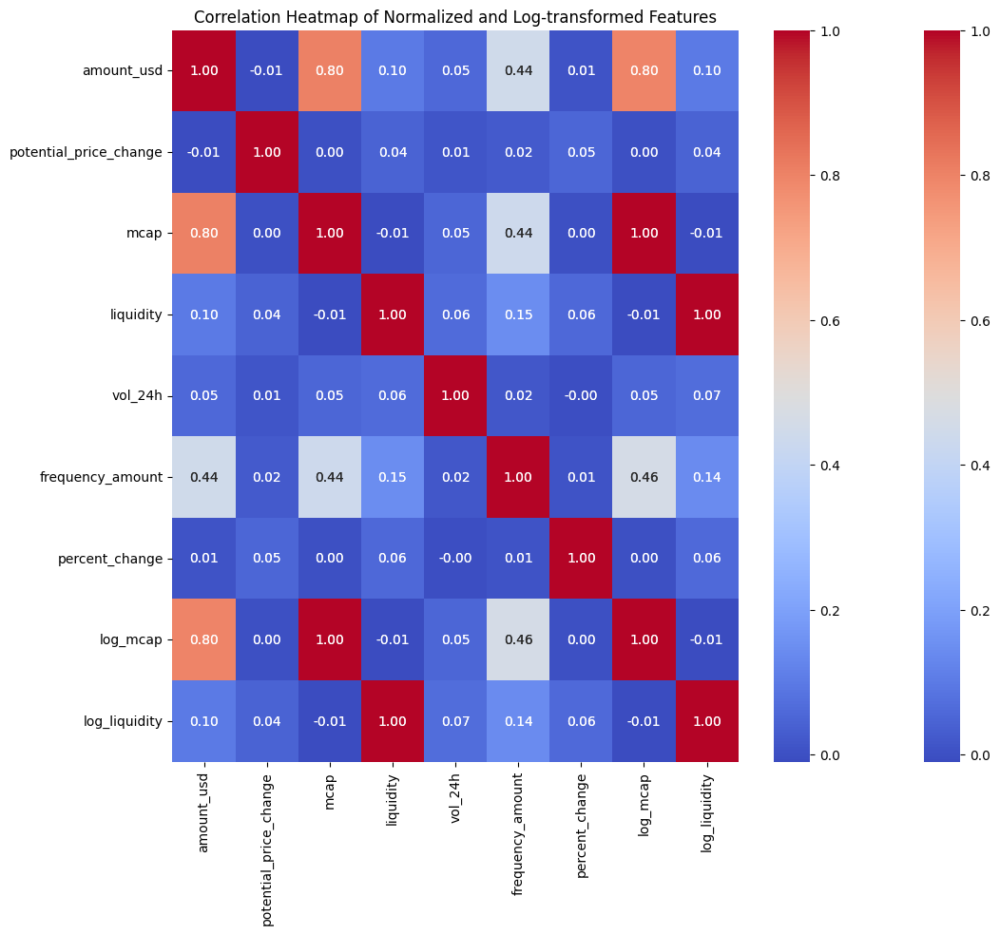

                        amount_usd  potential_price_change      mcap  liquidity   vol_24h  frequency_amount  percent_change  log_mcap  log_liquidity
amount_usd                1.000000               -0.008881  0.803884   0.100183  0.053619          0.444378        0.009041  0.795575       0.099262
potential_price_change   -0.008881                1.000000  0.000422   0.044581  0.010613          0.024675        0.052003  0.000489       0.044108
mcap                      0.803884                0.000422  1.000000  -0.008932  0.052854          0.439687        0.000150  0.998772      -0.009758
liquidity                 0.100183                0.044581 -0.008932   1.000000  0.063650          0.145166        0.056162 -0.007958       0.998815
vol_24h                   0.053619                0.010613  0.052854   0.063650  1.000000          0.016943       -0.004094  0.051759       0.066826
frequency_amount          0.444378                0.024675  0.439687   0.145166  0.016943          1.00000

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
df_copy = df
# Функция для преобразования строковых значений с суффиксами в числовые значения
def parse_numeric(value):
    if isinstance(value, str):
        # Заменяем суффиксы 'K', 'M', 'B', 'T' на эквивалентные множители
        value = value.replace('M', 'e6').replace('B', 'e9').replace('K', 'e3').replace('T', 'e12')
    return pd.to_numeric(value, errors='coerce')  # Преобразуем в числовое значение

# Применяем функцию к столбцам 'mcap', 'liquidity', 'frequency_amount'
df_copy['mcap'] = df_copy['mcap'].apply(parse_numeric)
df_copy['liquidity'] = df_copy['liquidity'].apply(parse_numeric)
df_copy['frequency_amount'] = df_copy['frequency_amount'].apply(parse_numeric)

# Проверяем, есть ли в столбцах NaN значения, которые остались после коэрсирования
print(df_copy[['mcap', 'liquidity', 'frequency_amount']].isna().sum())

# Теперь можно применить нормализацию и логарифмирование
scaler = MinMaxScaler()

# Применяем нормализацию только к столбцам 'mcap', 'liquidity' и 'frequency_amount'
df_copy[['mcap', 'liquidity', 'frequency_amount']] = scaler.fit_transform(df_copy[['mcap', 'liquidity', 'frequency_amount']])

# Логарифмирование капитализации и ликвидности (для уменьшения масштаба)
df_copy['log_mcap'] = np.log1p(df_copy['mcap'])  # log(1 + mcap) для предотвращения логарифма от 0
df_copy['log_liquidity'] = np.log1p(df_copy['liquidity'])

# Рассчитываем корреляцию между признаками
correlation_matrix = df_copy[['amount_usd', 'potential_price_change', 'mcap', 'liquidity',
                              'vol_24h', 'frequency_amount', 'percent_change',
                              'log_mcap', 'log_liquidity']].corr()

# Строим heatmap для нормализованных и логарифмированных данных
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
print(sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True))
plt.title("Correlation Heatmap of Normalized and Log-transformed Features")
plt.show()
# Печать в виде строки
print(correlation_matrix.to_string())



Корреляционная матрица с новыми признаками

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from itertools import combinations

# Пример данных (замените на ваши данные)
# df_copy = pd.read_csv('your_data.csv')  # Замените на загрузку ваших данных

# Функция для конвертации строковых значений с приставками в числа
def convert_to_numeric(value):
    try:
        if isinstance(value, str):
            if 'K' in value:
                return float(value.replace('K', '').replace(',', '')) * 1e3
            elif 'M' in value:
                return float(value.replace('M', '').replace(',', '')) * 1e6
            elif 'B' in value:
                return float(value.replace('B', '').replace(',', '')) * 1e9
            else:
                # Пробуем преобразовать в число напрямую
                return float(value.replace(',', ''))
        return pd.to_numeric(value, errors='coerce')  # Преобразуем все остальные в числа
    except Exception as e:
        print(f"Ошибка при преобразовании значения {value}: {e}")
        return np.nan  # Возвращаем NaN в случае ошибки

# Применяем преобразование для всех числовых столбцов
df_copy['mcap'] = df_copy['mcap'].apply(convert_to_numeric)
df_copy['liquidity'] = df_copy['liquidity'].apply(convert_to_numeric)
df_copy['vol_24h'] = df_copy['vol_24h'].apply(convert_to_numeric)
df_copy['frequency_amount'] = df_copy['frequency_amount'].apply(convert_to_numeric)

# Проверяем, есть ли в данных пропущенные значения после преобразования
print("Пропущенные значения после преобразования:")
print(df_copy.isnull().sum())

# Убираем строки с пропущенными значениями в столбцах 'mcap' и 'liquidity'
df_copy = df_copy.dropna(subset=['mcap', 'liquidity'])

# Проверка на количество строк после удаления
print(f"Количество строк после удаления пропусков: {df_copy.shape[0]}")

# Нормализуем данные только в столбцах 'mcap' и 'liquidity'
scaler = MinMaxScaler()

# Проверяем, есть ли данные для нормализации
if df_copy[['mcap', 'liquidity']].shape[0] > 0:
    df_copy[['mcap', 'liquidity']] = scaler.fit_transform(df_copy[['mcap', 'liquidity']])

    # Логарифмируем капитализацию и ликвидность
    df_copy['log_mcap'] = np.log(df_copy['mcap'] + 1)  # +1, чтобы избежать логарифма от 0
    df_copy['log_liquidity'] = np.log(df_copy['liquidity'] + 1)  # +1, чтобы избежать логарифма от 0
else:
    print("Данных для нормализации нет.")

# Добавляем новые комбинации признаков
df_copy['mcap_vol_24h'] = df_copy['mcap'] * df_copy['vol_24h']
df_copy['liquidity_vol_24h'] = df_copy['liquidity'] * df_copy['vol_24h']
df_copy['percent_change_freq'] = df_copy['percent_change'] * df_copy['frequency_amount']
df_copy['log_mcap_freq'] = df_copy['log_mcap'] * df_copy['frequency_amount']
df_copy['mcap_squared'] = df_copy['mcap'] ** 2
df_copy['liquidity_squared'] = df_copy['liquidity'] ** 2

# Проверка всех пар взаимодействий между признаками
columns = df_copy.columns
for col1, col2 in combinations(columns, 2):
    df_copy[f'{col1}_{col2}'] = df_copy[col1] * df_copy[col2]

# Вычисляем корреляционную матрицу для всех переменных
correlation_matrix_extended = df_copy.corr()

# Строим heatmap для новых комбинаций
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_extended, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap для расширенных признаков')
plt.show()


Пропущенные значения после преобразования:
ticker                       0
amount_usd                   0
side                         0
potential_price_change       4
mcap                         0
liquidity                    0
vol_24h                      0
vol_1h                     519
frequency                    0
eta                          0
futures                    267
ca                           0
user                      5813
amount_token              5898
created                   5813
finish                    5813
open                         0
close                        0
frequency_amount             0
frequency_interval           0
open_price                   0
close_price                  0
all_ochlv                    0
percent_change               0
result                       0
win                          0
date                         0
day_of_week                  0
month                        0
open_time                    0
day                        

TypeError: can't multiply sequence by non-int of type 'float'

In [ ]:
df_copy.head(10)

,ticker,amount_usd,side,potential_price_change,mcap,liquidity,vol_24h,vol_1h,frequency,eta,futures,ca,user,amount_token,created,finish,open,close,frequency_amount,frequency_interval,open_price,close_price,all_ochlv,percent_change,result,win,date,day_of_week,month,open_time,day,win_day
0,Fartcoin,671160.0,SELLING,-9.74,314.91M,13.79M,23900000.0,719.81K,134.23K every 1min,4.0,mexc bitget binance,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,NaN,NaN,NaN,NaN,2025-03-03 18:17:54+00:00,2025-03-03 18:22:54+00:00,134.23K,1 min,0.31310,0.30890,"[{'timestamp': datetime.datetime(2025, 3, 3, 1...",-1.341424,win,1,2025-03-03,Monday,2025-03,2025-03-03 18:17:54+00:00,2025-03-03,1
1,JUP,647590.0,BUYING,105.21,1.93B,2.53M,20000000.0,245.18K,10.79K every 1min,59.0,mexc bitget gate binance,JUPyiwrYJFskUPiHa7hkeR8VUtAeFoSYbKedZNsDvCN,NaN,NaN,NaN,NaN,2025-03-03 17:40:33+00:00,2025-03-03 18:40:33+00:00,10.79K,1 min,0.73230,0.70870,"[{'timestamp': datetime.datetime(2025, 3, 3, 1...",-3.222723,loss,0,2025-03-03,Monday,2025-03,2025-03-03 17:40:33+00:00,2025-03-03,0
2,POPCAT,81230.0,SELLING,-1.91,249.08M,8.51M,5910000.0,73.70K,8.12K every 15min,120.0,mexc gate binance,7GCihgDB8fe6KNjn2MYtkzZcRjQy3t9GHdC8uHYmW2hr,NaN,NaN,NaN,NaN,2025-03-03 17:19:54+00:00,2025-03-03 19:49:54+00:00,8.12K,15 min,0.25440,0.24550,"[{'timestamp': datetime.datetime(2025, 3, 3, 1...",-3.498428,win,1,2025-03-03,Monday,2025-03,2025-03-03 17:19:54+00:00,2025-03-03,1
4,LUCE,96030.0,BUYING,16.26,10.07M,1.37M,922640.0,25.53K,1.60K every 1min,60.0,mexc bitget,CBdCxKo9QavR9hfShgpEBG3zekorAeD7W1jfq2o3pump,NaN,NaN,NaN,NaN,2025-03-03 16:29:13+00:00,2025-03-03 17:29:13+00:00,1.60K,1 min,0.01014,0.00997,"[{'timestamp': datetime.datetime(2025, 3, 3, 1...",-1.676529,loss,0,2025-03-03,Monday,2025-03,2025-03-03 16:29:13+00:00,2025-03-03,0
10,swarms,144540.0,SELLING,-7.56,72.28M,3.82M,5680000.0,221.38K,722.70 every 1min,180.0,mexc bitget gate binance,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-03-03 13:16:52+00:00,2025-03-03 16:36:52+00:00,722.70,1 min,0.07221,0.06440,"[{'timestamp': datetime.datetime(2025, 3, 3, 1...",-10.815676,win,1,2025-03-03,Monday,2025-03,2025-03-03 13:16:52+00:00,2025-03-03,1
11,arc,91600.0,SELLING,-2.89,229.04M,6.34M,6110000.0,39.94K,4.58K every 1min,20.0,mexc bitget gate binance,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,NaN,NaN,NaN,NaN,2025-03-03 12:01:24+00:00,2025-03-03 12:21:24+00:00,4.58K,1 min,0.23129,0.23236,"[{'timestamp': datetime.datetime(2025, 3, 3, 1...",0.462623,loss,0,2025-03-03,Monday,2025-03,2025-03-03 12:01:24+00:00,2025-03-03,0
13,GRIFFAIN,120030.0,BUYING,6.94,66.04M,3.70M,5570000.0,115.93K,20.01K every 5min,30.0,mexc bitget gate binance,KENJSUYLASHUMfHyy5o4Hp2FdNqZg1AsUPhfH2kYvEP,NaN,NaN,NaN,NaN,2025-03-03 09:42:08+00:00,2025-03-03 10:12:08+00:00,20.01K,5 min,0.06633,0.06745,"[{'timestamp': datetime.datetime(2025, 3, 3, 9...",1.688527,win,1,2025-03-03,Monday,2025-03,2025-03-03 09:42:08+00:00,2025-03-03,1
14,swarms,142200.0,SELLING,-7.62,71.11M,3.73M,4390000.0,150.04K,711.00 every 1min,180.0,mexc bitget gate binance,74SBV4zDXxTRgv1pEMoECskKBkZHc2yGPnc7GYVepump,NaN,NaN,NaN,NaN,2025-03-03 09:19:22+00:00,2025-03-03 12:39:22+00:00,711.00,1 min,0.06958,0.07158,"[{'timestamp': datetime.datetime(2025, 3, 3, 9...",2.874389,loss,0,2025-03-03,Monday,2025-03,2025-03-03 09:19:22+00:00,2025-03-03,0
18,GRASS,134000.0,SELLING,-8.04,655.68M,3.33M,14720000.0,287.88K,1.34K every 2min,180.0,mexc bitget gate binance,Grass7B4RdKfBCjTKgSqnXkqjwiGvQyFbuSCUJr3XXjs,NaN,NaN,NaN,NaN,2025-03-03 02:21:36+00:00,2025-03-03 05:41:36+00:00,1.34K,2 min,2.69650,2.62130,"[{'timestamp': datetime.datetime(2025, 3, 3, 2...",-2.788800,win,1,2025-03-03,Monday,2025-03,2025-03-03 02:21:36+00:00,2025-03-03,1
19,ALCH,86460.0,SELLING,-3.70,56.54M,4.68M,10400000.0,520.34K,864.63 every 1min,60.0,mexc bitget gate binance,HNg5PYJmtqcmzXrv6S9zP1CDKk5BgDuyFBxbvNApump,NaN,NaN,NaN,NaN,2025-03-03 01:11:04+00:00,2025-03-03 02:51:04+00:00,864.63,1 min,0.06602,0.06371,"[{'timestamp': da

SyntaxError: invalid syntax (<ipython-input-44-763bddca778a>, line 1)

################################################################################################################################################################

In [ ]:


# Имя файла (если у тебя другое — поменяй)
file_name = "trade_data.csv"

# Читаем CSV в DataFrame
df = pd.read_csv(file_name)

# Проверяем, есть ли столбец "ticker"
if "ticker" in df.columns:
    value_counts = df["ticker"].value_counts(dropna=False)  # Подсчет всех значений, включая NaN
    print(f"Количество уникальных значений в столбце 'ticker': {len(value_counts)}\n")
    print("Уникальные значения и их количество:\n")
    print(value_counts.to_string())  # Вывести все значения без сокращений
    print(len(df))
else:
    print("Столбец 'ticker' не найден в датасете")


Количество уникальных значений в столбце 'ticker': 202

Уникальные значения и их количество:

ticker
NaN           1590
Fartcoin       606
TRUMP          333
arc            201
AVA            104
swarms         101
JLP            100
POPCAT          71
pippin          70
GRIFFAIN        68
ZEREBRO         60
MLG             53
JUP             53
UFD             47
FWOG            42
RAY             38
SPX             35
MELANIA         35
ALCH            35
WBTC            34
PENGU           33
Bonk            32
USA             31
VINE            31
LLM             29
BUZZ            29
JitoSOL         28
MVRS            26
GRIFT           26
MOBY            25
jellyjelly      24
GOAT            23
jailstool       22
HYPER           22
Anon            19
GRASS           15
AGiXT           14
Pnut            13
MOTHER          13
WETH            12
SONIC           11
cbBTC           11
Butthole        10
BARRON          10
JTO              9
GIGA             9
CHILLGUY         9
ELIZA 

In [ ]:
# Получаем массив всех уникальных значений ticker
unique_tickers = df_cleaned["ticker"].unique()

# Выводим количество уникальных значений
print(f"Количество уникальных значений в 'ticker': {len(unique_tickers)}")

# Выводим сам массив
print(unique_tickers)


Количество уникальных значений в 'ticker': 87
['arc' 'POPCAT' 'Fartcoin' 'VIRTUAL' 'RAY' 'GRIFFAIN' 'TRACY' 'JUP' 'WBTC'
 'PENGU' 'Duo' 'MLG' 'TRUMP' 'JLP' 'jellyjelly' 'GOAT' 'LIBRA' 'GFM' 'JTO'
 'Bonk' 'GME' 'FAIR³' 'cbBTC' 'jailstool' 'GRASS' 'AVA' 'WETH' 'CHEX'
 'listen' 'CAR' 'VINE' 'MOODENG' 'BIGBALLS' 'GIGA' 'HYPER' 'UFD' 'FWOG'
 'JupSOL' 'SPX' 'AESOP' 'Calicoin' 'SSE' 'swarms' 'BUTTCOIN' 'BUZZ'
 'GRIFT' 'SNAI' 'MELANIA' 'fxn' 'pippin' 'Anon' 'KMNO' 'mSOL' 'Pnut'
 'DRIFT' 'ALCH' 'MOBY' 'MUSKIT' 'ELIZA' 'LEV' 'PKIN' 'KAYYO' 'RIFT' 'MUMU'
 'WEN' 'KWEEN' 'STNK' 'DOGEAI' 'TRISIG' 'CHILLGUY' 'LMT' 'TMC' 'USA'
 'WOULD' 'CBM' 'dreams' 'sora' 'FSTR' 'AGiXT' 'HAT' 'THE1' 'ZEREBRO'
 'daige' 'LUMO' 'SLERF' 'BARRON' 'TANK']


In [ ]:
df_cleaned.head(2940)

,amount_selling,ticker,trade_type,trade_frequency,eta,scores,price_change,market_cap,liquidity,holders,24h_volume,1h_volume,1h_volume_impact,price,contract_address,user,trade_period,nlp_entities,open,close
0,160.06K,arc,buy,16.01,10m,👍,4.944%,158.75M,6.23M,"54,810",22.17M,844.53K,18.94546%,0.15870,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,3LG78wKNP4s1FC5b5o6WcwjzqNochbQ35gfKbzQsagyJ,18 Feb 2025 22:44:16 - 18 Feb 2025 22:54:16,"{'MONEY': 'more than $5', 'CARDINAL': '1h', 'O...",18 Feb 2025 22:44:16,18 Feb 2025 22:54:16
1,160.06K,arc,buy,16.01,10m,👍,4.94%,159.13M,6.24M,"54,804",22.13M,1.04M,15.39576%,0.15910,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,3LG78wKNP4s1FC5b5o6WcwjzqNochbQ35gfKbzQsagyJ,18 Feb 2025 22:44:16 - 18 Feb 2025 22:54:16,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",18 Feb 2025 22:44:16,18 Feb 2025 22:54:16
2,430.15K,POPCAT,buy,215.08,2m,🔥,9.258%,234.36M,8.64M,"128,649",6.20M,129.42K,332.25379%,0.23910,7GCihgDB8fe6KNjn2MYtkzZcRjQy3t9GHdC8uHYmW2hr,GU2GdJwhif5y4h74cq9L9HFdtcZZeP3SJSHQqF5zsWQo,18 Feb 2025 22:36:37 - 18 Feb 2025 22:38:37,"{'ORG': 'ETA', 'PERCENT': '9.3%', 'CARDINAL': ...",18 Feb 2025 22:36:37,18 Feb 2025 22:38:37
4,291.59K,arc,sell,41.66,8m,👍,9.061%,151.81M,6.00M,"54,724",20.69M,421.91K,455.27735%,0.15180,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,C55Sq4ub3H5ALCmjfjd9P2GPnsBtphrJHeEFKATKArYm,18 Feb 2025 20:52:51 - 18 Feb 2025 21:00:51,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",18 Feb 2025 20:52:51,18 Feb 2025 21:00:51
7,81.72K,Fartcoin,sell,20.43,5m,🚩,1.103%,282.52M,14.69M,"108,460",35.69M,3.38M,8.54978%,0.28250,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,FsPxrPpidJTqne9Uut5wkzKLskXfmu1QEV3xt61tjMW7,18 Feb 2025 17:39:39 - 18 Feb 2025 17:44:39,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",18 Feb 2025 17:39:39,18 Feb 2025 17:44:39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4515,441.29K,GRIFFAIN,buy,NaN,NaN,NaN,6.41%,NaN,NaN,"44,430",NaN,NaN,NaN,NaN,KENJSUYLASHUMfHyy5o4Hp2FdNqZg1AsUPhfH2kYvEP,B2EJmfXuGfRWBig79njraT8S8BCkmYAEpquoJowHp3sX,06 Jan 2025 03:36:33,"{'MONEY': 'more than $3K', 'TIME': 'less than ...",06 Jan 2025 03:36:33,None
4516,211.48K,Fartcoin,buy,NaN,NaN,NaN,1.17%,NaN,NaN,"65,184",NaN,NaN,NaN,NaN,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,BjcHe1tZqcJ93RekSEks4hqY81Gx7qWTcZNvc76teXfM,06 Jan 2025 03:34:52,"{'MONEY': 'more than $3K', 'TIME': 'less than ...",06 Jan 2025 03:34:52,None
4517,701.48K,HYPER,buy,NaN,NaN,NaN,34.85%,NaN,NaN,"3,418",NaN,NaN,NaN,NaN,8vBMibwpn8wpfYKbQ9xqzodymg3LjmYec2tSNGRy23K8,EwkH5aEmKEAC2M8eh8x8XVkNyPTZt1PSUH875bXrVmjP,06 Jan 2025 03:23:21,"{'MONEY': 'more than $3K', 'PERSON': '875bXrVm...",06 Jan 2025 03:23:21,None
4519,752.62K,HYPER,buy,NaN,NaN,NaN,36.64%,NaN,NaN,"3,181",NaN,NaN,NaN,NaN,8vBMibwpn8wpfYKbQ9xqzodymg3LjmYec2tSNGRy23K8,EwkH5aEmKEAC2M8eh8x8XVkNyPTZt1PSUH875bXrVmjP,06 Jan 2025 03:12:09,"{'MONEY': 'more than $3K', 'PERSON': 'HYPER', ...",06 Jan 2025 03:12:09,None


In [ ]:

# Проверяем, есть ли столбец "ticker"
if "ticker" in df.columns:
    value_counts = df["ticker"].value_counts(dropna=False)  # Подсчет всех значений, включая NaN
    print(f"Количество уникальных значений в столбце 'ticker': {len(value_counts)}\n")
    print("Уникальные значения и их количество:\n")
    print(value_counts.to_string())  # Вывести все значения без сокращений
else:
    print("Столбец 'ticker' не найден в датасете")

Количество уникальных значений в столбце 'ticker': 202

Уникальные значения и их количество:

ticker
NaN           1590
Fartcoin       606
TRUMP          333
arc            201
AVA            104
swarms         101
JLP            100
POPCAT          71
pippin          70
GRIFFAIN        68
ZEREBRO         60
MLG             53
JUP             53
UFD             47
FWOG            42
RAY             38
SPX             35
MELANIA         35
ALCH            35
WBTC            34
PENGU           33
Bonk            32
USA             31
VINE            31
LLM             29
BUZZ            29
JitoSOL         28
MVRS            26
GRIFT           26
MOBY            25
jellyjelly      24
GOAT            23
jailstool       22
HYPER           22
Anon            19
GRASS           15
AGiXT           14
Pnut            13
MOTHER          13
WETH            12
SONIC           11
cbBTC           11
Butthole        10
BARRON          10
JTO              9
GIGA             9
CHILLGUY         9
ELIZA 

In [ ]:
# Удаляем строки, где ticker == NaN
df_cleaned = df.dropna(subset=["ticker"])

# Проверяем, что NaN удалены
print(f"После удаления NaN в 'ticker' осталось строк: {len(df_cleaned)}")

# Сохраняем обновленный датасет
df_cleaned.to_csv("trade_data_cleaned.csv", index=False)

# Даём возможность скачать новый файл
from google.colab import files
files.download("trade_data_cleaned.csv")


После удаления NaN в 'ticker' осталось строк: 2974


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print(len(df_cleaned))

2974


In [ ]:
print(df_cleaned.iloc[2973])

amount_selling                                                126.81K
ticker                                                       Fartcoin
trade_type                                                       sell
trade_frequency                                                   NaN
eta                                                               NaN
scores                                                            NaN
price_change                                                    0.71%
market_cap                                                        NaN
liquidity                                                         NaN
holders                                                        65,002
24h_volume                                                        NaN
1h_volume                                                         NaN
1h_volume_impact                                                  NaN
price                                                             NaN
contract_address    

In [ ]:

# Проверяем, есть ли столбец "ticker"
if "ticker" in df_cleaned.columns:
    value_counts = df_cleaned["ticker"].value_counts(dropna=False)  # Подсчет всех значений, включая NaN
    print(f"Количество уникальных значений в столбце 'ticker': {len(value_counts)}\n")
    print("Уникальные значения и их количество:\n")
    print(value_counts.to_string())  # Вывести все значения без сокращений
else:
    print("Столбец 'ticker' не найден в датасете")

Количество уникальных значений в столбце 'ticker': 201

Уникальные значения и их количество:

ticker
Fartcoin      606
TRUMP         333
arc           201
AVA           104
swarms        101
JLP           100
POPCAT         71
pippin         70
GRIFFAIN       68
ZEREBRO        60
MLG            53
JUP            53
UFD            47
FWOG           42
RAY            38
SPX            35
MELANIA        35
ALCH           35
WBTC           34
PENGU          33
Bonk           32
USA            31
VINE           31
LLM            29
BUZZ           29
JitoSOL        28
MVRS           26
GRIFT          26
MOBY           25
jellyjelly     24
GOAT           23
jailstool      22
HYPER          22
Anon           19
GRASS          15
AGiXT          14
Pnut           13
MOTHER         13
WETH           12
SONIC          11
cbBTC          11
Butthole       10
BARRON         10
JTO             9
GIGA            9
CHILLGUY        9
ELIZA           9
CAR             9
LMT             8
KMNO            8

In [ ]:
df_cleaned[["open", "close"]] = df_cleaned["trade_period"].str.split(" - ", expand=True)

df_cleaned.to_csv("trade_data_latest.csv", index=False)

# Даём возможность скачать новый файл
from google.colab import files
files.download("trade_data_latest.csv")
# Проверяем результат
print(df_cleaned.head())

<ipython-input-38-b0dd1996a0c2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned[["open", "close"]] = df_cleaned["trade_period"].str.split(" - ", expand=True)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  amount_selling    ticker trade_type trade_frequency  eta scores  \
0        160.06K       arc        buy           16.01  10m      👍   
1        160.06K       arc        buy           16.01  10m      👍   
2        430.15K    POPCAT        buy          215.08   2m      🔥   
4        291.59K       arc       sell           41.66   8m      👍   
7         81.72K  Fartcoin       sell           20.43   5m      🚩   

  price_change market_cap liquidity  holders 24h_volume 1h_volume  \
0       4.944%    158.75M     6.23M   54,810     22.17M   844.53K   
1        4.94%    159.13M     6.24M   54,804     22.13M     1.04M   
2       9.258%    234.36M     8.64M  128,649      6.20M   129.42K   
4       9.061%    151.81M     6.00M   54,724     20.69M   421.91K   
7       1.103%    282.52M    14.69M  108,460     35.69M     3.38M   

  1h_volume_impact    price                              contract_address  \
0        18.94546%  0.15870  61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump   
1        15.3957

In [ ]:
pip install pybit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 29.0 MB/s eta 0:00:00
  Created wheel for pybit: filename=pybit-5.9.0-py2.py3-none-any.whl size=39477 sha256=615b13ebc983cdbed122a59d782e511d3c8e801c180fd513b00626201962d711
  Stored in directory: /root/.cache/pip/wheels/a9/da/06/02dff0a8d1e494ab7a7c627337b5e58d18ae684ea52aef042f
Successfully built pybit


In [ ]:
df_cleaned = df_cleaned.dropna(subset=["scores"])


In [ ]:
import pandas as pd

# Удаляем строки, где ticker содержит только числа (включая возможную десятичную точку)
df_cleaned = df_cleaned[~df_cleaned["ticker"].astype(str).str.match(r"^\d+(\.\d+)?$")]

# Выводим оставшиеся уникальные тикеры для проверки
print("Оставшиеся уникальные тикеры:", df_cleaned["ticker"].unique())


Оставшиеся уникальные тикеры: ['arc' 'POPCAT' 'Fartcoin' 'VIRTUAL' 'RAY' 'GRIFFAIN' 'TRACY' 'JUP' 'WBTC'
 'PENGU' 'Duo' 'MLG' 'TRUMP' 'JLP' 'jellyjelly' 'GOAT' 'LIBRA' 'GFM' 'JTO'
 'Bonk' 'GME' 'FAIR³' 'cbBTC' 'jailstool' 'GRASS' 'AVA' 'WETH' 'CHEX'
 'listen' 'CAR' 'VINE' 'MOODENG' 'BIGBALLS' 'GIGA' 'HYPER' 'UFD' 'FWOG'
 'JupSOL' 'SPX' 'AESOP' 'Calicoin' 'SSE' 'swarms' 'BUTTCOIN' 'BUZZ'
 'GRIFT' 'SNAI' 'MELANIA' 'fxn' 'pippin' 'Anon' 'KMNO' 'mSOL' 'Pnut'
 'DRIFT' 'ALCH' 'MOBY' 'MUSKIT' 'ELIZA' 'LEV' 'PKIN' 'KAYYO' 'RIFT' 'MUMU'
 'WEN' 'KWEEN' 'STNK' 'DOGEAI' 'TRISIG' 'CHILLGUY' 'LMT' 'TMC' 'USA'
 'WOULD' 'CBM' 'dreams' 'sora' 'FSTR' 'AGiXT' 'HAT' 'THE1' 'ZEREBRO'
 'daige' 'LUMO' 'SLERF' 'BARRON' 'TANK']


In [ ]:
print(len(df_cleaned))

2974


Аналитика тф с open an close


In [ ]:
from google.colab import files

# Загружаем файл вручную
uploaded = files.upload()

Saving trade_data_test_final.csv to trade_data_test_final.csv


In [ ]:
import pandas as pd

# Читаем CSV (меняем разделитель, если надо)
df = pd.read_csv("trade_data_test_final.csv")  # Если данные странно выглядят, попробуйте delimiter=";"
print(df)
# Показываем первые 5 строк
df.head(100)

     amount_selling    ticker trade_type  trade_frequency  eta scores  \
0           160.06K       arc        buy            16.01  10m      👍   
1           160.06K       arc        buy            16.01  10m      👍   
2           430.15K    POPCAT        buy           215.08   2m      🔥   
3           291.59K       arc       sell            41.66   8m      👍   
4            81.72K  Fartcoin       sell            20.43   5m      🚩   
...             ...       ...        ...              ...  ...    ...   
1136        500.55K  Fartcoin        buy            50.06  10m      👍   
1137        100.23K     TRUMP        buy            10.02  10m      🤔   
1138         93.11K     TRUMP       sell            46.56   3m      🚩   
1139        889.09K     TRUMP       sell            29.64  30m      🚩   
1140         91.13K     TRUMP       sell             8.28  12m      🤔   

     price_change market_cap liquidity  holders  ...  \
0          4.944%    158.75M     6.23M   54,810  ...   
1          

,amount_selling,ticker,trade_type,trade_frequency,eta,scores,price_change,market_cap,liquidity,holders,...,contract_address,user,trade_period,nlp_entities,open,close,open_price,close_price,open_price_calc,close_price_calc
0,160.06K,arc,buy,16.01,10m,👍,4.944%,158.75M,6.23M,"54,810",...,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,3LG78wKNP4s1FC5b5o6WcwjzqNochbQ35gfKbzQsagyJ,18 Feb 2025 22:44:16 - 18 Feb 2025 22:54:16,"{'MONEY': 'more than $5', 'CARDINAL': '1h', 'O...",18 Feb 2025 22:44:16,18 Feb 2025 22:54:16,NaN,NaN,0.15947,0.15695
1,160.06K,arc,buy,16.01,10m,👍,4.94%,159.13M,6.24M,"54,804",...,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,3LG78wKNP4s1FC5b5o6WcwjzqNochbQ35gfKbzQsagyJ,18 Feb 2025 22:44:16 - 18 Feb 2025 22:54:16,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",18 Feb 2025 22:44:16,18 Feb 2025 22:54:16,NaN,NaN,0.15947,0.15695
2,430.15K,POPCAT,buy,215.08,2m,🔥,9.258%,234.36M,8.64M,"128,649",...,7GCihgDB8fe6KNjn2MYtkzZcRjQy3t9GHdC8uHYmW2hr,GU2GdJwhif5y4h74cq9L9HFdtcZZeP3SJSHQqF5zsWQo,18 Feb 2025 22:36:37 - 18 Feb 2025 22:38:37,"{'ORG': 'ETA', 'PERCENT': '9.3%', 'CARDINAL': ...",18 Feb 2025 22:36:37,18 Feb 2025 22:38:37,NaN,NaN,0.24110,0.24090
3,291.59K,arc,sell,41.66,8m,👍,9.061%,151.81M,6.00M,"54,724",...,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,C55Sq4ub3H5ALCmjfjd9P2GPnsBtphrJHeEFKATKArYm,18 Feb 2025 20:52:51 - 18 Feb 2025 21:00:51,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",18 Feb 2025 20:52:51,18 Feb 2025 21:00:51,NaN,NaN,0.14919,0.15171
4,81.72K,Fartcoin,sell,20.43,5m,🚩,1.103%,282.52M,14.69M,"108,460",...,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,FsPxrPpidJTqne9Uut5wkzKLskXfmu1QEV3xt61tjMW7,18 Feb 2025 17:39:39 - 18 Feb 2025 17:44:39,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",18 Feb 2025 17:39:39,18 Feb 2025 17:44:39,NaN,NaN,0.28720,0.28610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,162.72K,FAIR³,buy,5.42,31m,👍,24.962%,44.59M,1.05M,"7,345",...,42kgc4RDpWBMM5qtuaHenJuMzfk7nu1t7HSau74cpump,4vyTQRsX1yxr3cZfwEbzwvdeJ6hHznHrf2joLArh846h,14 Feb 2025 08:18:37 - 14 Feb 2025 08:49:37,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",14 Feb 2025 08:18:37,14 Feb 2025 08:49:37,NaN,NaN,0.00000,0.00000
96,96.94K,cbBTC,sell,6.46,15m,🚩,7.412%,108.77M,2.47M,"19,139",...,cbbtcf3aa214zXHbiAZQwf4122FBYbraNdFqgw4iMij,GG41MndjnC5oEhqEkvThGoPxS5P6mV77JLgLHR8DBarR,14 Feb 2025 07:11:24 - 14 Feb 2025 07:26:24,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",14 Feb 2025 07:11:24,14 Feb 2025 07:26:24,NaN,NaN,0.00000,0.00000
97,350.60K,arc,sell,35.06,10m,👍,6.024%,350.68M,11.11M,"53,040",...,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,GRKuj5767vBEuAiVt7s7AKPRAYmLSvP7MwH8tiXHGNQm,14 Feb 2025 04:42:09 - 14 Feb 2025 04:52:09,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",14 Feb 2025 04:42:09,14 Feb 2025 04:52:09,NaN,NaN,0.34768,0.34632
98,97.86K,arc,buy,6.52,16m,🤔,1.694%,368.51M,11.40M,"53,121",...,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,HWYjJqoMAjKsMB8Y6MiFZ4wRAY5PaBvsNjV5sa612G6R,14 Feb 2025 01:02:13 - 14 Feb 2025 01:18:13,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",14 Feb 2025 01:02:13,14 Feb 2025 01:18:13,NaN,NaN,0.37261,0.35830


In [ ]:
df.drop(columns=["open_price", "close_price"], inplace=True)

In [ ]:
df.head()

,amount_selling,ticker,trade_type,trade_frequency,eta,scores,price_change,market_cap,liquidity,holders,24h_volume,1h_volume,1h_volume_impact,price,contract_address,user,trade_period,nlp_entities,open_price_calc,close_price_calc
0,160.06K,arc,buy,16.01,10m,👍,4.944%,158.75M,6.23M,"54,810",22.17M,844.53K,18.94546%,0.1587,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,3LG78wKNP4s1FC5b5o6WcwjzqNochbQ35gfKbzQsagyJ,18 Feb 2025 22:44:16 - 18 Feb 2025 22:54:16,"{'MONEY': 'more than $5', 'CARDINAL': '1h', 'O...",0.15947,0.15695
1,160.06K,arc,buy,16.01,10m,👍,4.94%,159.13M,6.24M,"54,804",22.13M,1.04M,15.39576%,0.1591,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,3LG78wKNP4s1FC5b5o6WcwjzqNochbQ35gfKbzQsagyJ,18 Feb 2025 22:44:16 - 18 Feb 2025 22:54:16,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",0.15947,0.15695
2,430.15K,POPCAT,buy,215.08,2m,🔥,9.258%,234.36M,8.64M,"128,649",6.20M,129.42K,332.25379%,0.2391,7GCihgDB8fe6KNjn2MYtkzZcRjQy3t9GHdC8uHYmW2hr,GU2GdJwhif5y4h74cq9L9HFdtcZZeP3SJSHQqF5zsWQo,18 Feb 2025 22:36:37 - 18 Feb 2025 22:38:37,"{'ORG': 'ETA', 'PERCENT': '9.3%', 'CARDINAL': ...",0.24110,0.24090
3,291.59K,arc,sell,41.66,8m,👍,9.061%,151.81M,6.00M,"54,724",20.69M,421.91K,455.27735%,0.1518,61V8vBaqAGMpgDQi4JcAwo1dmBGHsyhzodcPqnEVpump,C55Sq4ub3H5ALCmjfjd9P2GPnsBtphrJHeEFKATKArYm,18 Feb 2025 20:52:51 - 18 Feb 2025 21:00:51,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",0.14919,0.15171
4,81.72K,Fartcoin,sell,20.43,5m,🚩,1.103%,282.52M,14.69M,"108,460",35.69M,3.38M,8.54978%,0.2825,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,FsPxrPpidJTqne9Uut5wkzKLskXfmu1QEV3xt61tjMW7,18 Feb 2025 17:39:39 - 18 Feb 2025 17:44:39,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",0.28720,0.28610


In [ ]:
def calculate_trade_result(row):
    open_price = row["open_price_calc"]
    close_price = row["close_price_calc"]

    # Проверка на ноль
    if close_price == 0 or open_price == 0:
        return pd.Series(["undefined", 0.0])  # Если цена 0, сделка неопределенная

    if row["trade_type"].lower() == "buy":
        profit_percentage = (close_price / open_price - 1) * 100
        result = "win" if close_price > open_price else "loss"
    else:  # Если "sell"
        profit_percentage = (open_price / close_price - 1) * 100
        result = "win" if close_price < open_price else "loss"

    return pd.Series([result, profit_percentage])

# Добавляем новые колонки
df[["trade_result", "profit_percentage"]] = df.apply(calculate_trade_result, axis=1)

# Сохраняем обновленный файл
df.to_csv("trade_data_result.csv", index=False)

print("✅ Анализ завершен! Файл 'trade_data_result.csv' обновлен.")

✅ Анализ завершен! Файл 'trade_data_result.csv' обновлен.


In [ ]:
print(df.head(1000))

    amount_selling    ticker trade_type  trade_frequency  eta scores  \
0          160.06K       arc        buy            16.01  10m      👍   
1          160.06K       arc        buy            16.01  10m      👍   
2          430.15K    POPCAT        buy           215.08   2m      🔥   
3          291.59K       arc       sell            41.66   8m      👍   
4           81.72K  Fartcoin       sell            20.43   5m      🚩   
..             ...       ...        ...              ...  ...    ...   
995        251.46K   ZEREBRO       sell            25.15  10m      🔥   
996        604.47K  Fartcoin       sell            17.27  36m      🤔   
997        197.29K     GRIFT       sell             9.86  20m      👍   
998        120.02K      MOBY       sell            12.00  11m      👍   
999        177.78K  Fartcoin       sell            29.63   6m      👍   

    price_change market_cap liquidity  holders  ... 1h_volume_impact   price  \
0         4.944%    158.75M     6.23M   54,810  ...    

In [ ]:
import pandas as pd


# Функция для вычисления результата сделки
def calculate_trade_result(row):
    open_price = row["open_price_calc"]
    close_price = row["close_price_calc"]

    # Проверка на ноль
    if close_price == 0 or open_price == 0:
        return pd.Series(["undefined", 0.0])  # Если цена 0, сделка неопределенная

    if row["trade_type"].lower() == "buy":
        profit_percentage = (close_price / open_price - 1) * 100
        result = "win" if close_price > open_price else "loss"
    else:  # Если "sell"
        profit_percentage = (open_price / close_price - 1) * 100
        result = "win" if close_price < open_price else "loss"

    return pd.Series([result, profit_percentage])

# Добавляем новые колонки
df[["trade_result", "profit_percentage"]] = df.apply(calculate_trade_result, axis=1)

# Подсчет количества побед и поражений
wins = df[df["trade_result"] == "win"].shape[0]
losses = df[df["trade_result"] == "loss"].shape[0]

print(f"✅ Побед: {wins}, Поражений: {losses}")

# Симуляция торговли с депозитом $1000 (фиксированный вход $100)
initial_deposit = 1000
balance = initial_deposit
trade_amount = 100  # Фиксированная сумма сделки

loss_point = None  # Фиксируем момент слива

for index, row in df.iterrows():
    if row["trade_result"] in ["win", "loss"]:
        profit_loss = trade_amount * (row["profit_percentage"] / 100)
        balance += profit_loss

        if balance <= 0:
            loss_point = index
            break  # Останавливаем торговлю при полном сливе

if loss_point is not None:
    print(f"❌ Депозит обнулился на сделке {loss_point + 1} (индекс {loss_point})")
else:
    print(f"💰 Итоговый депозит после всех сделок: ${balance:.2f}")

# Сохраняем обновленный файл
df.to_csv("trade_data_result.csv", index=False)

print("✅ Анализ завершен! Файл 'trade_data_result.csv' обновлен.")


✅ Побед: 475, Поражений: 341
💰 Итоговый депозит после всех сделок: $1558.24
✅ Анализ завершен! Файл 'trade_data_result.csv' обновлен.


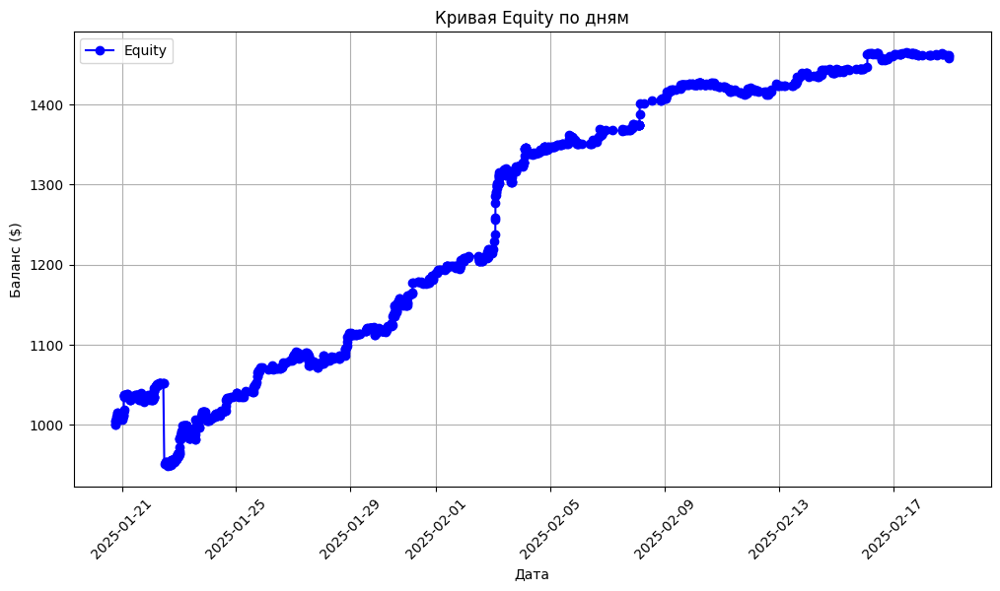

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Загружаем данные
df["trade_date"] = pd.to_datetime(df["trade_period"].str.split(" - ").str[0])  # Берем начало сделки
df = df.sort_values("trade_date")  # Сортируем сделки по времени

# Начальные параметры
initial_deposit = 1000
trade_size = 100  # Каждая сделка на $100
equity = [initial_deposit]  # История депозита
dates = [df["trade_date"].iloc[0]]  # Даты для графика

# Подсчет equity
current_balance = initial_deposit
for index, row in df.iterrows():
    if row["trade_type"] == "buy":
        if (row["close_price_calc"] or row["open_price_calc"]) != 0:
          profit_percentage = (row["close_price_calc"] / row["open_price_calc"] - 1) * 100
        else:
          profit_percentage = 0
    else:  # sell
        if (row["close_price_calc"] or row["open_price_calc"]) != 0:
          profit_percentage = (row["open_price_calc"] / row["close_price_calc"] - 1) * 100
        else:
          profit_percentage = 0


    profit = trade_size * (profit_percentage / 100)  # Считаем профит от сделки
    current_balance += profit  # Обновляем баланс

    equity.append(current_balance)
    dates.append(row["trade_date"])

    if current_balance <= 0:  # Если депозит обнулился, фиксируем момент
        print(f"💀 Депозит обнулился на {row['trade_date']}")
        break

# Строим график equity
plt.figure(figsize=(12, 6))
plt.plot(dates, equity, label="Equity", marker="o", linestyle="-", color="blue")
plt.xlabel("Дата")
plt.ylabel("Баланс ($)")
plt.title("Кривая Equity по дням")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()


     amount_selling    ticker trade_type  trade_frequency  eta scores  \
1140         91.13K     TRUMP       sell             8.28  12m      🤔   
1139        889.09K     TRUMP       sell            29.64  30m      🚩   
1138         93.11K     TRUMP       sell            46.56   3m      🚩   
1137        100.23K     TRUMP        buy            10.02  10m      🤔   
1136        500.55K  Fartcoin        buy            50.06  10m      👍   
...             ...       ...        ...              ...  ...    ...   
1045        268.27K  Fartcoin        buy            53.65   5m      🚩   
1044        111.57K  Fartcoin        buy            22.31   6m      🚩   
1043         93.16K      BUZZ        buy            18.63   6m      🤔   
1042        253.57K      BUZZ        buy            25.36  30m      👍   
1041         72.74K      BUZZ       sell             6.61  12m      🤔   

     price_change market_cap liquidity  holders  ...    price  \
1140       0.025%       8.18   715.07M  832,374  ...  40.9

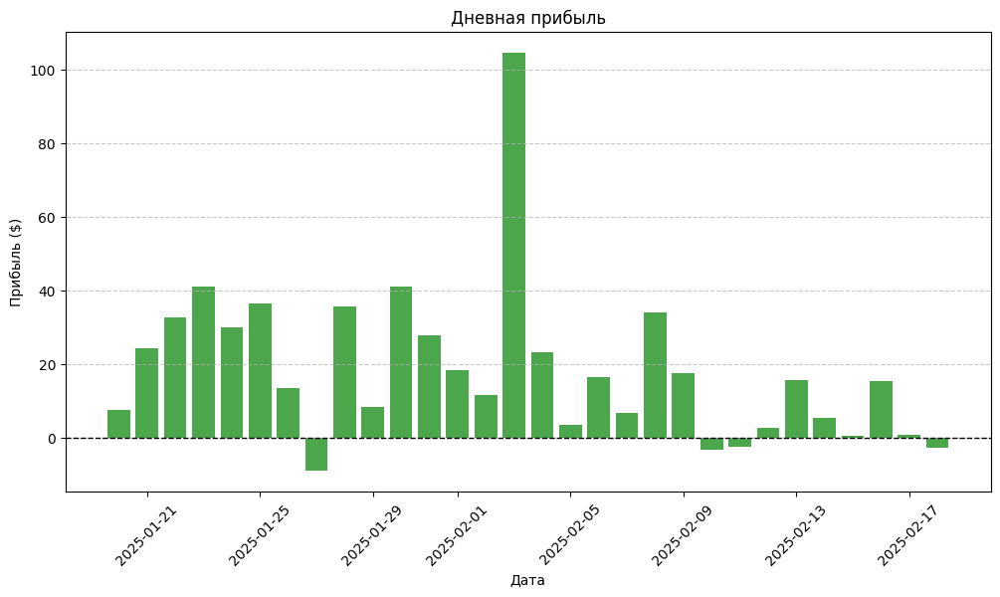

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


new_df = df.copy()
print(new_df.head(100))
# Начальные параметры
trade_size = 100  # Каждая сделка на $100
daily_profit = {}  # Словарь для хранения профита по дням

# Подсчет профита по дням
for index, row in new_df.iterrows():
    open_price = row["open_price_calc"]
    close_price = row["close_price_calc"]
    date = row["trade_date"].date()  # Оставляем только дату (без времени)

    # Проверка деления на ноль
    if open_price == 0 or close_price == 0:
        #pprint(f"⚠️ Пропуск сделки: {row['trade_period']} (open={open_price}, close={close_price})")
        continue

    if row["trade_type"] == "buy":
        profit_percentage = (close_price / open_price - 1) * 100
    else:  # sell
        profit_percentage = (open_price / close_price - 1) * 100

    profit = trade_size * (profit_percentage / 100)  # Считаем профит от сделки

    # Суммируем профит за день
    daily_profit[date] = daily_profit.get(date, 0) + profit

# Преобразуем в DataFrame для удобства
profit_df = pd.DataFrame(list(daily_profit.items()), columns=["trade_date", "profit"]).sort_values("trade_date")

# Строим график профита по дням
plt.figure(figsize=(12, 6))
plt.bar(profit_df["trade_date"], profit_df["profit"], color="green", alpha=0.7)
plt.axhline(0, color="black", linestyle="--", linewidth=1)  # Линия нулевой прибыли
plt.xlabel("Дата")
plt.ylabel("Прибыль ($)")
plt.title("Дневная прибыль")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


In [ ]:
new_df["profit"] = new_df.apply(lambda row:
    ((row["close_price_calc"] - row["open_price_calc"]) / row["open_price_calc"]) * 100
    if row["trade_type"] == "buy" and row["open_price_calc"] != 0
    else ((row["open_price_calc"] - row["close_price_calc"]) / row["open_price_calc"]) * 100
    if row["trade_type"] == "sell" and row["open_price_calc"] != 0
    else 0,  # Если open_price_calc == 0, ставим 0 прибыли
    axis=1
)


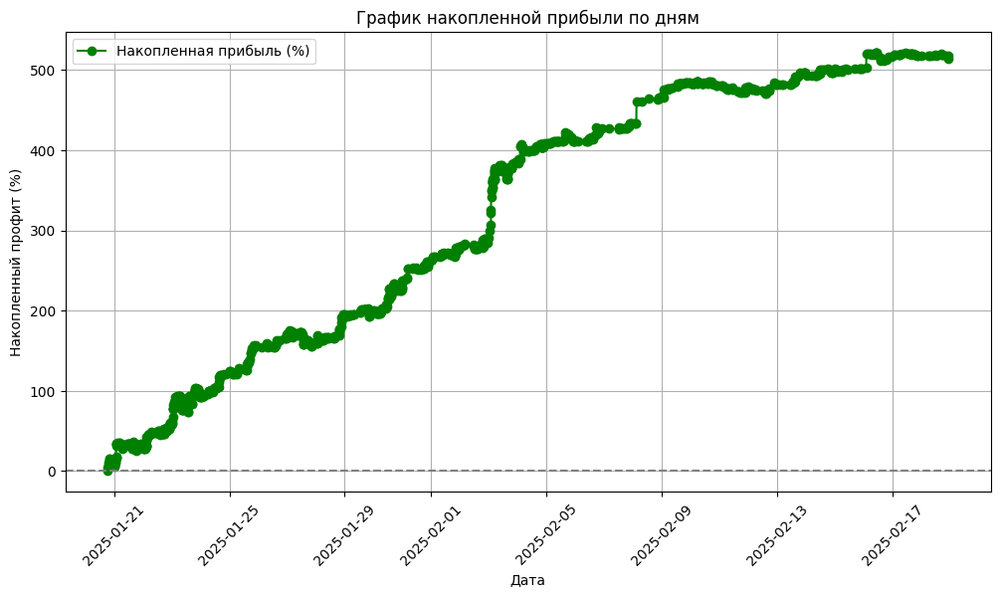

In [ ]:
import matplotlib.pyplot as plt

# Преобразуем даты в datetime, если это не сделано ранее
new_df["trade_date"] = pd.to_datetime(new_df["trade_period"].str.split(" - ").str[0])

# Группируем по дням и суммируем прибыль
daily_profit = new_df.groupby("trade_date")["profit"].sum()

# Построение графика
plt.figure(figsize=(12, 6))
plt.plot(daily_profit.index, daily_profit.cumsum(), marker="o", linestyle="-", color="green", label="Накопленная прибыль (%)")
plt.axhline(0, color="gray", linestyle="--")  # Линия 0 для ориентира
plt.xlabel("Дата")
plt.ylabel("Накопленный профит (%)")
plt.title("График накопленной прибыли по дням")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()


In [ ]:
new_df = new_df[new_df["profit"] != 0].reset_index(drop=True)


In [ ]:
total_trades = len(new_df)
win_trades = len(new_df[new_df["profit"] > 0])
win_rate = (win_trades / total_trades) * 100
print(f"Win Rate: {win_rate:.2f}%")


Win Rate: 58.43%


In [ ]:
print(new_df["trade_type"].value_counts())
print(new_df[new_df["profit"] > 0].head())  # Прибыльные
print(new_df[new_df["profit"] <= 0].head())  # Убыточные


trade_type
sell    467
buy     346
Name: count, dtype: int64
  amount_selling    ticker trade_type  trade_frequency  eta scores  \
0         91.13K     TRUMP       sell             8.28  12m      🤔   
1        889.09K     TRUMP       sell            29.64  30m      🚩   
2         93.11K     TRUMP       sell            46.56   3m      🚩   
3        100.23K     TRUMP        buy            10.02  10m      🤔   
4        500.55K  Fartcoin        buy            50.06  10m      👍   

  price_change market_cap liquidity  holders  ...  \
0       0.025%       8.18   715.07M  832,374  ...   
1       0.244%       8.60   728.37M  832,170  ...   
2       0.026%       8.43   722.89M  830,884  ...   
3       0.028%       8.02   709.82M  829,574  ...   
4       3.647%       1.88    26.70M   86,479  ...   

                               contract_address  \
0  6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN   
1  6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN   
2  6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiP

In [ ]:
print(new_df)

    amount_selling    ticker trade_type  trade_frequency  eta scores  \
0           91.13K     TRUMP       sell             8.28  12m      🤔   
1          889.09K     TRUMP       sell            29.64  30m      🚩   
2           93.11K     TRUMP       sell            46.56   3m      🚩   
3          100.23K     TRUMP        buy            10.02  10m      🤔   
4          500.55K  Fartcoin        buy            50.06  10m      👍   
..             ...       ...        ...              ...  ...    ...   
808         81.72K  Fartcoin       sell            20.43   5m      🚩   
809        291.59K       arc       sell            41.66   8m      👍   
810        430.15K    POPCAT        buy           215.08   2m      🔥   
811        160.06K       arc        buy            16.01  10m      👍   
812        160.06K       arc        buy            16.01  10m      👍   

    price_change market_cap liquidity  holders  ...  \
0         0.025%       8.18   715.07M  832,374  ...   
1         0.244%       8.

🔻 Maximum Drawdown (MDD): 1.86%
🔄 Recovery Factor (RF): 277.17


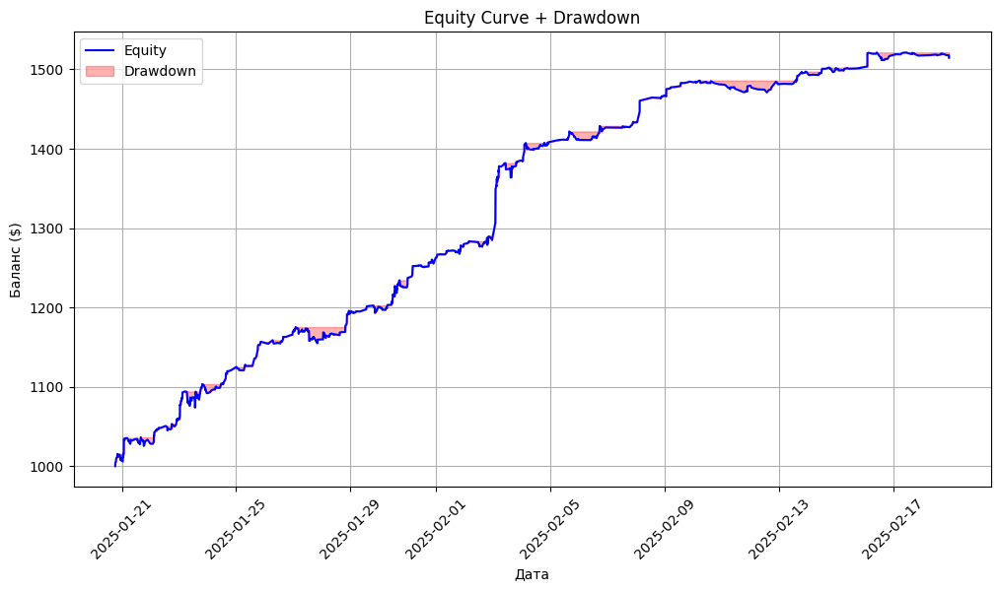

In [ ]:
import numpy as np

# Рассчитываем кривую баланса
initial_deposit = 1000
trade_size = 100
equity = [initial_deposit]
dates = [new_df["trade_date"].iloc[0]]

current_balance = initial_deposit
for _, row in new_df.iterrows():
    profit = trade_size * (row["profit"] / 100)
    current_balance += profit
    equity.append(current_balance)
    dates.append(row["trade_date"])

# Преобразуем в массив
equity = np.array(equity)

# 🔻 Maximum Drawdown (MDD)
peak = np.maximum.accumulate(equity)  # Текущий максимум на каждом шаге
drawdown = (peak - equity) / peak  # Относительная просадка
max_drawdown = np.max(drawdown) * 100  # MDD в %

# 🔄 Recovery Factor (RF)
total_profit = equity[-1] - initial_deposit
recovery_factor = total_profit / (max_drawdown if max_drawdown > 0 else 1)

# 📊 Вывод результатов
print(f"🔻 Maximum Drawdown (MDD): {max_drawdown:.2f}%")
print(f"🔄 Recovery Factor (RF): {recovery_factor:.2f}")

# График Equity + Drawdown
plt.figure(figsize=(12, 6))
plt.plot(dates, equity, label="Equity", color="blue")
plt.fill_between(dates, equity, peak, color="red", alpha=0.3, label="Drawdown")
plt.xlabel("Дата")
plt.ylabel("Баланс ($)")
plt.title("Equity Curve + Drawdown")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.show()


In [ ]:
import numpy as np

# Разделяем прибыльные и убыточные сделки
winners = new_df[new_df["profit"] > 0]["profit"]
losers = new_df[new_df["profit"] < 0]["profit"]

# Profit Factor (PF)
total_profit = winners.sum()
total_loss = abs(losers.sum())
profit_factor = total_profit / total_loss if total_loss > 0 else np.inf

# Sharpe Ratio
mean_return = new_df["profit"].mean()
std_dev = new_df["profit"].std()
sharpe_ratio = mean_return / std_dev if std_dev > 0 else np.inf

# Sortino Ratio (учитываем только убыточные сделки)
downside_std = losers.std()
sortino_ratio = mean_return / downside_std if downside_std > 0 else np.inf

# Expectancy (ожидаемая доходность на сделку)
win_rate = len(winners) / len(new_df)
loss_rate = 1 - win_rate
avg_win = winners.mean()
avg_loss = losers.mean()
expectancy = (win_rate * avg_win) + (loss_rate * avg_loss)

# 📊 Вывод результатов
print(f"📈 Profit Factor (PF): {profit_factor:.2f}")
print(f"📊 Sharpe Ratio: {sharpe_ratio:.2f}")
print(f"📉 Sortino Ratio: {sortino_ratio:.2f}")
print(f"💰 Expectancy per trade: {expectancy:.2f}%")


📈 Profit Factor (PF): 2.05
📊 Sharpe Ratio: 0.22
📉 Sortino Ratio: 0.38
💰 Expectancy per trade: 0.63%


In [ ]:
new_df.head()

,amount_selling,ticker,trade_type,trade_frequency,eta,scores,price_change,market_cap,liquidity,holders,...,contract_address,user,trade_period,nlp_entities,open_price_calc,close_price_calc,trade_result,profit_percentage,trade_date,profit
0,91.13K,TRUMP,sell,8.28,12m,🤔,0.025%,8.18,715.07M,"832,374",...,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,9ZhynUHmAaHi83T8xNaeobofiHyM9KcRgDzZqeVaXr9m,20 Jan 2025 18:23:07 - 20 Jan 2025 18:35:07,"{'MONEY': 'more than $5', 'ORG': 'Tracker - Fi...",42.4720,42.3860,win,0.202897,2025-01-20 18:23:07,0.202486
1,889.09K,TRUMP,sell,29.64,30m,🚩,0.244%,8.60,728.37M,"832,170",...,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,HiWVZ438ZT4MjneTg1Ft1KAjP9iYrmptMn4MbkBmrRyU,20 Jan 2025 18:29:37 - 20 Jan 2025 18:59:37,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",42.7880,41.1100,win,4.081732,2025-01-20 18:29:37,3.921660
2,93.11K,TRUMP,sell,46.56,3m,🚩,0.026%,8.43,722.89M,"830,884",...,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,AvPc7ocZ4h7vNtyADsoHtWS4ujC4rrr4sFq7QhLoxmWm,20 Jan 2025 18:57:01 - 20 Jan 2025 19:00:01,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",40.9930,40.4100,win,1.442712,2025-01-20 18:57:01,1.422194
3,100.23K,TRUMP,buy,10.02,10m,🤔,0.028%,8.02,709.82M,"829,574",...,6p6xgHyF7AeE6TZkSmFsko444wqoP15icUSqi2jfGiPN,CRCLhwcP1HiWb4p7BL72rBk1WY8HFYPPVeXt7HApu8Qc,20 Jan 2025 19:04:23 - 20 Jan 2025 19:14:23,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",39.1520,39.9930,win,2.148038,2025-01-20 19:04:23,2.148038
4,500.55K,Fartcoin,buy,50.06,10m,👍,3.647%,1.88,26.70M,"86,479",...,9BB6NFEcjBCtnNLFko2FqVQBq8HHM13kCyYcdQbgpump,4xrTHsaCpoKZCqzP3KYrfy8qFAWsvgziSTYB5JrhuhvA,20 Jan 2025 19:17:55 - 20 Jan 2025 19:27:55,"{'ORG': 'Tracker - Filtred - Feedback - Chat',...",1.8809,1.9235,win,2.264873,2025-01-20 19:17:55,2.264873


from matplotlib import pyplot as plt
_df_0['trade_frequency'].plot(kind='hist', bins=20, title='trade_frequency')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['price'].plot(kind='hist', bins=20, title='price')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['open_price_calc'].plot(kind='hist', bins=20, title='open_price_calc')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['close_price_calc'].plot(kind='hist', bins=20, title='close_price_calc')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('amount_selling').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_5.groupby('ticker').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_6.groupby('trade_type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_7.groupby('eta').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='trade_frequency', y='price', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9.plot(kind='scatter', x='price', y='open_price_calc', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_10.plot(kind='scatter', x='open_price_calc', y='close_price_calc', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_11.plot(kind='scatter', x='close_price_calc', y='profit_percentage', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['trade_date']
  ys = series['trade_frequency']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_12.sort_values('trade_date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('amount_selling')):
  _plot_series(series, series_name, i)
  fig.legend(title='amount_selling', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('trade_date')
_ = plt.ylabel('trade_frequency')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['trade_date']
  ys = series['trade_frequency']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_13.sort_values('trade_date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('ticker')):
  _plot_series(series, series_name, i)
  fig.legend(title='ticker', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('trade_date')
_ = plt.ylabel('trade_frequency')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['trade_date']
  ys = series['trade_frequency']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_14.sort_values('trade_date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('trade_type')):
  _plot_series(series, series_name, i)
  fig.legend(title='trade_type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('trade_date')
_ = plt.ylabel('trade_frequency')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['trade_date']
  ys = series['trade_frequency']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_15.sort_values('trade_date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('eta')):
  _plot_series(series, series_name, i)
  fig.legend(title='eta', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('trade_date')
_ = plt.ylabel('trade_frequency')

from matplotlib import pyplot as plt
_df_16['trade_frequency'].plot(kind='line', figsize=(8, 4), title='trade_frequency')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_17['price'].plot(kind='line', figsize=(8, 4), title='price')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_18['open_price_calc'].plot(kind='line', figsize=(8, 4), title='open_price_calc')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_19['close_price_calc'].plot(kind='line', figsize=(8, 4), title='close_price_calc')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['ticker'].value_counts()
    for x_label, grp in _df_20.groupby('amount_selling')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('amount_selling')
_ = plt.ylabel('ticker')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['trade_type'].value_counts()
    for x_label, grp in _df_21.groupby('ticker')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('ticker')
_ = plt.ylabel('trade_type')

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['eta'].value_counts()
    for x_label, grp in _df_22.groupby('trade_type')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('trade_type')
_ = plt.ylabel('eta')

/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 128681 (\N{TRIANGULAR FLAG ON POST}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 129300 (\N{THINKING FACE}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/google/colab/_quickchart_lib.py:32: UserWarning: Glyph 128077 (\N{THUMBS UP SIGN}) missing from font(s) DejaVu Sans.
  plt.savefig(
/usr/local/lib/python3.11/dist-packages/google/colab/_quickchart_lib.py:32: UserWarning: Glyph 128681 (\N{TRIANGULAR FLAG ON POST}) missing from font(s) DejaVu Sans.
  plt.savefig(
/usr/local/lib/python3.11/dist-packages/google/colab/_quickchart_lib.py:32: UserWarning: Glyph 129300 (\N{THINKING FACE}) missing from font(s) DejaVu San

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['scores'].value_counts()
    for x_label, grp in _df_23.groupby('eta')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('eta')
_ = plt.ylabel('scores')

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_24['amount_selling'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_24, x='trade_frequency', y='amount_selling', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_25['ticker'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_25, x='trade_frequency', y='ticker', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_26['trade_type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_26, x='trade_frequency', y='trade_type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_27['eta'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_27, x='trade_frequency', y='eta', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
total_profit = new_df[new_df["profit"] > 0]["profit"].sum()
total_loss = abs(new_df[new_df["profit"] < 0]["profit"].sum())  # Берем модуль убытков

profit_factor = total_profit / total_loss if total_loss != 0 else float('inf')
print(f"📈 Profit Factor (PF): {profit_factor:.2f}")


📈 Profit Factor (PF): 2.05


In [ ]:
risk_free_rate = 0  # Безрисковая ставка
mean_return = new_df["profit"].mean()
std_return = new_df["profit"].std()

sharpe_ratio = (mean_return - risk_free_rate) / std_return if std_return != 0 else 0
print(f"📊 Sharpe Ratio: {sharpe_ratio:.2f}")


📊 Sharpe Ratio: 0.22


In [ ]:
downside_std = new_df[new_df["profit"] < 0]["profit"].std()
sortino_ratio = (mean_return - risk_free_rate) / downside_std if downside_std != 0 else 0
print(f"📉 Sortino Ratio: {sortino_ratio:.2f}")


📉 Sortino Ratio: 0.38


In [ ]:
new_df["win"] = new_df["profit"] > 0
new_df["streak"] = new_df["win"].groupby((new_df["win"] != new_df["win"].shift()).cumsum()).cumcount() + 1

max_win_streak = new_df[new_df["win"]]["streak"].max()
max_loss_streak = new_df[~new_df["win"]]["streak"].max()

print(f"🔥 Max Winning Streak: {max_win_streak}")
print(f"💀 Max Losing Streak: {max_loss_streak}")


🔥 Max Winning Streak: 12
💀 Max Losing Streak: 8


In [ ]:
import numpy as np

drawdowns_squared = (drawdown ** 2).mean()
ulcer_index = np.sqrt(drawdowns_squared)

print(f"🤕 Ulcer Index: {ulcer_index:.2f}")


🤕 Ulcer Index: 0.00


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


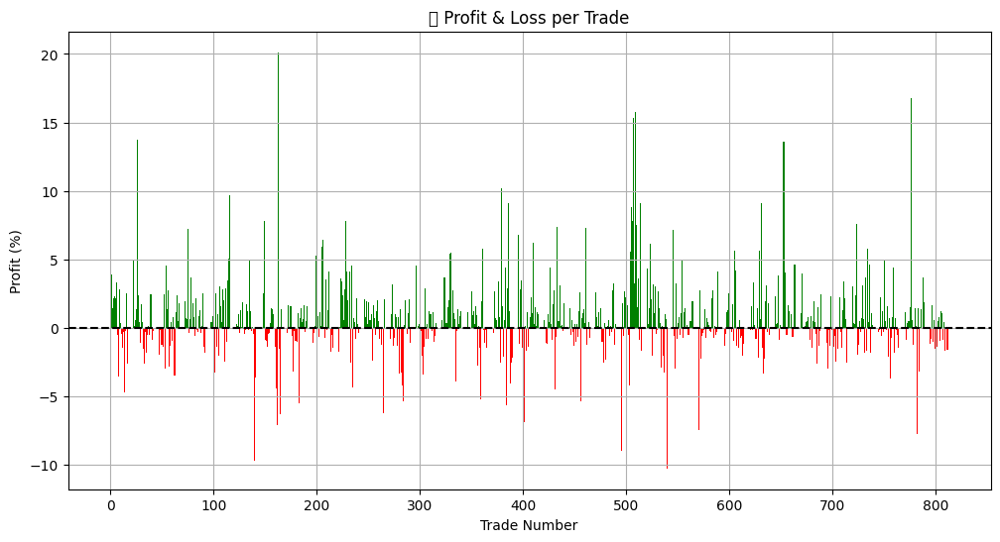

In [ ]:
plt.figure(figsize=(12, 6))
plt.bar(range(len(new_df)), new_df["profit"], color=new_df["profit"].apply(lambda x: 'green' if x > 0 else 'red'))
plt.axhline(0, color="black", linestyle="--")
plt.title("📊 Profit & Loss per Trade")
plt.xlabel("Trade Number")
plt.ylabel("Profit (%)")
plt.grid()
plt.show()


In [ ]:
expectancy = new_df["profit"].mean()
print(f"💰 Expectancy per trade: {expectancy:.2f}%")


💰 Expectancy per trade: 0.63%


In [ ]:
average_win = new_df[new_df["profit"] > 0]["profit"].mean()
average_loss = abs(new_df[new_df["profit"] < 0]["profit"].mean())
rrr = average_win / average_loss if average_loss != 0 else float('inf')

print(f"⚖️ Risk-Reward Ratio (RRR): {rrr:.2f}")


⚖️ Risk-Reward Ratio (RRR): 1.46


In [ ]:
import requests

# Получаем индекс страха и жадности (пример запроса)
url = "https://api.alternative.me/fng/?limit=1000"
response = requests.get(url).json()

# Преобразуем в DataFrame
fng_data = pd.DataFrame(response["data"])
fng_data["date"] = pd.to_datetime(fng_data["timestamp"], unit="s")
fng_data["value"] = fng_data["value"].astype(float)

print(fng_data.head())


   value value_classification   timestamp time_until_update       date
0   44.0                 Fear  1739923200              1648 2025-02-19
1   47.0              Neutral  1739836800               NaN 2025-02-18
2   51.0              Neutral  1739750400               NaN 2025-02-17
3   54.0              Neutral  1739664000               NaN 2025-02-16
4   50.0              Neutral  1739577600               NaN 2025-02-15


<ipython-input-49-3b94409112dc>:9: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  fng_data["date"] = pd.to_datetime(fng_data["timestamp"], unit="s")


<ipython-input-52-605ee932c1dd>:11: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  fng_data["date"] = pd.to_datetime(fng_data["timestamp"], unit="s")
<ipython-input-52-605ee932c1dd>:61: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


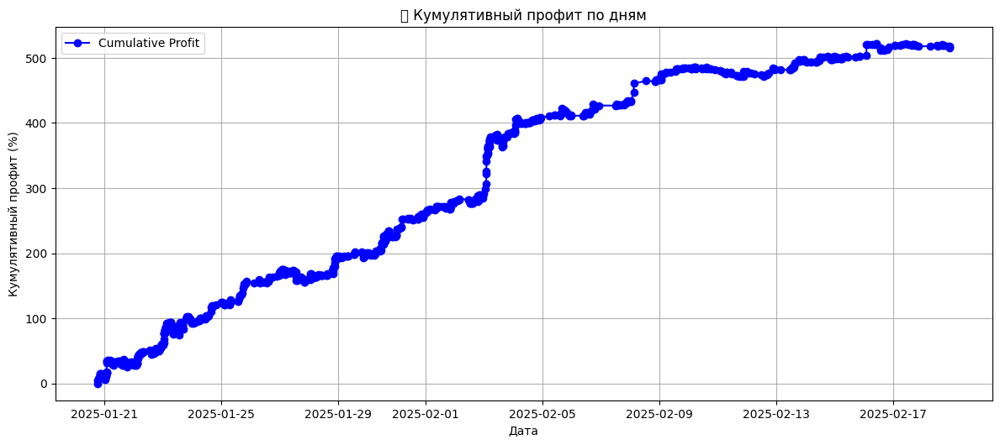

❌ Нет данных по Fear & Greed Index за этот период


In [ ]:
import pandas as pd
import requests
import matplotlib.pyplot as plt

# ===== 1. Получение данных по Fear & Greed Index =====
url = "https://api.alternative.me/fng/?limit=1000"
response = requests.get(url).json()

# Преобразуем в DataFrame
fng_data = pd.DataFrame(response["data"])
fng_data["date"] = pd.to_datetime(fng_data["timestamp"], unit="s")
fng_data["value"] = fng_data["value"].astype(float)

# ===== 2. Подготовка данных трейдов =====
# Здесь предполагается, что у тебя уже есть new_df с колонками trade_date, open_price_calc, close_price_calc и trade_type

# Добавляем расчет прибыли на каждую сделку
new_df["profit"] = new_df.apply(lambda row:
    ((row["close_price_calc"] - row["open_price_calc"]) / row["open_price_calc"]) * 100
    if row["trade_type"] == "buy"
    else ((row["open_price_calc"] - row["close_price_calc"]) / row["open_price_calc"]) * 100, axis=1
)

# Удаляем нулевые сделки (без прибыли/убытка)
new_df = new_df[new_df["profit"] != 0]

# Приводим даты к единому формату
new_df["trade_date"] = pd.to_datetime(new_df["trade_date"])

# Ограничиваем данные только теми датами, которые есть в трейдах
fng_data = fng_data[fng_data["date"].between(new_df["trade_date"].min(), new_df["trade_date"].max())]

# ===== 3. Объединение данных по дате =====
merged_df = new_df.merge(fng_data, left_on="trade_date", right_on="date", how="left")
merged_df = merged_df.drop(columns=["date"])  # Убираем дубликаты столбцов

# ===== 4. Построение графиков =====
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# График 1: Профит по дням
axes[0].plot(merged_df["trade_date"], merged_df["profit"].cumsum(), marker="o", linestyle="-", color="blue", label="Cumulative Profit")
axes[0].set_xlabel("Дата")
axes[0].set_ylabel("Кумулятивный профит (%)")
axes[0].set_title("📈 Кумулятивный профит по дням")
axes[0].legend()
axes[0].grid()

# График 2: Зависимость профита от Fear & Greed Index
if not merged_df["value"].isnull().all():  # Проверяем, есть ли вообще данные
    scatter = axes[1].scatter(merged_df["value"], merged_df["profit"], alpha=0.6, c=merged_df["profit"], cmap="coolwarm")
    axes[1].set_xlabel("Fear & Greed Index (0 = Fear, 100 = Greed)")
    axes[1].set_ylabel("Profit (%)")
    axes[1].set_title("📊 Зависимость профита от страха и жадности")
    axes[1].axvline(50, color="black", linestyle="--", label="Neutral Zone")
    axes[1].legend()
    axes[1].grid()
    fig.colorbar(scatter, ax=axes[1], label="Profit (%)")
else:
    axes[1].set_visible(False)  # Скрываем второй график, если нет данных

plt.tight_layout()
plt.show()

# ===== 5. Вычисление корреляции между профитом и индексом =====
if not merged_df["value"].isnull().all():
    correlation = merged_df["profit"].corr(merged_df["value"])
    print(f"📉 Корреляция между профитом и Fear & Greed Index: {correlation:.2f}")
else:
    print("❌ Нет данных по Fear & Greed Index за этот период")
